# Some matplotlib or pandas function that helps you plot better

## 6/10/2024

In [218]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import corner 
from tqdm import tqdm
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.gridspec as gridspec
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from matplotlib.lines import Line2D
from matplotlib.patches import Patch
# plt.rcParams['text.usetex'] = False
# plt.rcParams['text.latex.preamble'] = r'\usepackage{amsmath}'


#Another option for plotting
# pip install scienceplots
import scienceplots 
plt.style.use('science')


# #Some colors that Pablo likes:
colors = [
    "#1f77b4", # Vivid blue
    "#ff7f0e", # Bright orange
    "#2ca02c", # Rich green
    "#d62728", # Strong red
    "#9467bd", # Deep purple
    # "#8c564b", # Brownish-pink
    "#e377c2", # Pink
    "#7f7f7f", # Medium gray
    "#bcbd22", # Lime green
    "#17becf", # Cyan
    "#393b79", # Dark blue
    "#637939", # Olive green
    "#8c6d31", # Bronze
    # "#843c39", # Dark red
    # "#ad494a", # Reddish brown
    "#d6616b", # Soft red
    "#e7ba52", # Golden yellow
    "#7b4173", # Dark purple
    "#a55194", # Mauve
    "#ce6dbd", # Light purple
]

colors_sets = [
    "#ff7f0e",

    "#1f77b4",

    "#2ca02c",
    "#d62728",
    
    "#9467bd",
    "#8c564b",
    "#e377c2",
    "#7f7f7f",
    "#bcbd22",
    "#17becf",
    '#1f77b4',  # muted blue
    'r',  
] 

markers = [
    "o",  # Circle
    "^",  # Triangle up
    "s",  # Square
    "P",  # Plus (filled)
    "*",  # Star
    "X",  # X (filled)
    "D",  # Diamond
    "H",  # Hexagon
]


colors_models = colors


Selected_element=50
Selected_element_name="Sn"




### First, we learn about the read_hdf function

In [219]:
models = ['AME2020', 'ME2', 'MEdelta', 'PC1', 'NL3S', 'SKMS', 'SKP', 'SLY4', 'SV', 'UNEDF0', \
        'UNEDF1', 'UNEDF2', 'FRDM12', 'HFB24', 'BCPM', 'D1M'] #Here I am copying all the models that we will be using 

#In the line below we are going to access the data that we have for the binding energies of different models
models_data_sets = {}
for model in models:
    Data_Values = pd.read_hdf("./data./selected_data.h5", key = model)
    models_data_sets[model] = {"N" : Data_Values["N"], "Z" : Data_Values["Z"], "BE" : Data_Values["BE"]}

In [220]:
for model in models:
    print(model, len(models_data_sets[model]["N"]))

AME2020 2548
ME2 654
MEdelta 654
PC1 654
NL3S 656
SKMS 2459
SKP 2485
SLY4 2479
SV 2484
UNEDF0 2484
UNEDF1 2495
UNEDF2 2540
FRDM12 2457
HFB24 2457
BCPM 2525
D1M 2524


### Second, after we have learnt how to open a HDF file, let's try to graph some of the data that we get from the file

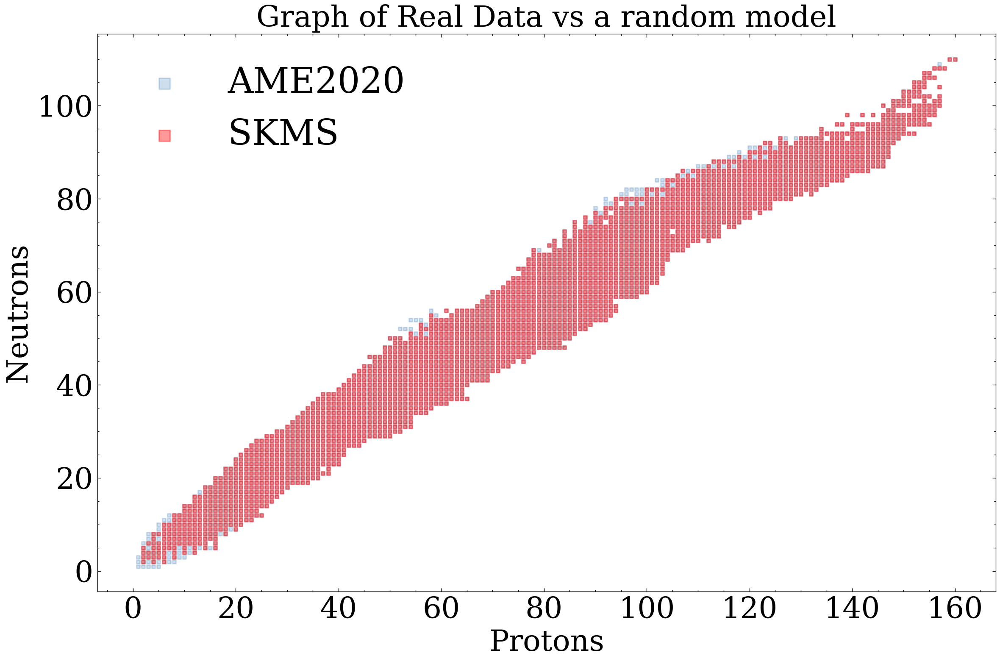

In [221]:
plt.rc("xtick", labelsize = 25)
plt.rc("ytick", labelsize = 25)
plt.rcParams['text.usetex'] = False
#Let's try to graph the real data and one of the models

fig, ax = plt.subplots(figsize = (12,8), dpi = 200)
ax.scatter(models_data_sets['AME2020']['N'], models_data_sets['AME2020']['Z'], s = 10, marker = "s", alpha = 0.2, label = 'AME2020')

ax.scatter(models_data_sets[models[5]]['N'], models_data_sets[models[5]]['Z'], color = 'r', s = 10, marker = "s", alpha = 0.4, label = models[5])

plt.xlabel("Protons", fontsize = "25")
plt.ylabel("Neutrons", fontsize = "25")
plt.title("Graph of Real Data vs a random model", fontsize = 25)
plt.tight_layout()
plt.legend(fontsize = 30, markerscale = 3)
plt.show()

### After we have tried to plot Protons vs Neutrons, let's first add some contraints on the data set

In [222]:
# We first first want our truth data to only contain even_even nuclei:
models_selected=['AME2020','ME2', 'MEdelta', 'PC1', 'NL3S', 'SKMS', 'SKP', 'SLY4', 'SV', 'UNEDF0', \
        'UNEDF1', 'UNEDF2', 'FRDM12', 'HFB24', 'BCPM', 'D1M'] # These are models with even_even nucleis
filtered_NZ = np.array([models_data_sets['AME2020']['N'].tolist(), models_data_sets['AME2020']['Z'].tolist()]).T
filtered_NZ_new = []
for isotope in filtered_NZ:
    if ((isotope[0] >= 8) & (isotope[1] >= 8)) & ( (isotope[0]%2 == 0) & (isotope[1]%2 == 0) ):
        filtered_NZ_new.append(isotope)
filtered_NZ = np.array(filtered_NZ_new)

In [223]:
print(filtered_NZ)

[[  8   8]
 [ 10   8]
 [ 12   8]
 ...
 [156 108]
 [158 108]
 [160 110]]


In [224]:
#Now let's try to make all our data the same across all models
for model in models_selected:
    filtered_NZ_new = []
    for isotope in filtered_NZ:
        if ((models_data_sets[model]["N"] == isotope[0]) & (models_data_sets[model]["Z"] == isotope[1])).any():
            filtered_NZ_new.append(isotope)
    filtered_NZ = np.array(filtered_NZ_new)

In [225]:
print(len(filtered_NZ))

629


### Next we are going to merge the data into a data frame

In [226]:
filtered_NZ_df = {"N" : filtered_NZ.T[0], "Z" : filtered_NZ.T[1]}

In [227]:
filtered_NZ_df = pd.DataFrame(filtered_NZ_df)

In [228]:
filtered_NZ_df

,N,Z
0,8,8
1,10,8
2,12,8
3,14,8
4,16,8
...,...,...
624,154,106
625,156,106
626,156,108
627,158,108


In [229]:
pd.DataFrame(models_data_sets['AME2020'])

,N,Z,BE
0,1,1,2.224566
1,2,1,8.481796
2,3,1,6.881796
3,4,1,6.681796
4,5,1,5.769837
...,...,...,...
2543,157,108,1933.505561
2544,158,108,1941.337453
2545,157,109,1934.022107
2546,159,110,1950.291722


In [230]:
for model in models_selected:
    a = pd.merge(filtered_NZ_df, pd.DataFrame(models_data_sets[model]), how = "left", on = ["N", "Z"] )
    filtered_NZ_df[model] = a["BE"]

In [231]:
filtered_NZ_df

,N,Z,AME2020,ME2,MEdelta,PC1,NL3S,SKMS,SKP,SLY4,SV,UNEDF0,UNEDF1,UNEDF2,FRDM12,HFB24,BCPM,D1M
0,8,8,127.619315,126.738,129.026,127.455,128.114,128.856436,128.904993,129.839429,127.368236,126.708495,121.705460,121.950687,128.03,125.632422,127.007944,128.028806
1,10,8,139.807766,140.156,141.992,141.423,141.715,144.746257,144.484846,144.734392,141.963546,142.040342,136.123181,136.259511,141.84,138.095058,141.145503,141.000517
2,12,8,151.371414,151.224,152.793,153.215,153.432,158.460613,156.849135,156.488630,153.746333,154.121072,147.620242,148.128389,152.98,151.927694,153.041593,151.904718
3,14,8,162.027188,160.513,161.884,163.303,163.311,170.486446,167.278899,166.483309,163.855872,164.192707,157.219361,158.409799,161.39,161.930329,163.391272,160.883175
4,16,8,168.952452,167.472,168.465,170.768,170.970,178.908577,174.420231,173.303716,170.930478,171.196394,163.998623,165.167568,165.98,168.322965,170.887643,166.974152
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
624,154,106,1909.066432,1910.765,1907.813,1909.928,1914.193,1894.445901,1900.875946,1898.639172,1902.293050,1907.479821,1908.851310,1908.842630,1909.73,1909.145350,1905.125660,1901.308909
625,156,106,1923.387483,1925.019,1921.738,1924.361,1928.042,1909.221132,1915.371887,1912.434046,1916.575965,1921.884406,1922.815073,1922.920406,1923.99,1923.647986,1919.402948,1915.781516
626,156,108,1926.771317,1928.415,1925.436,1927.488,1932.395,1911.680941,1918.341803,1916.133844,1919.723353,1925.454882,1926.206982,1926.326995,1927.52,1926.745956,1922.608355,1918.524169
627,158,108,1941.337453,1943.010,1939.691,1942.276,1946.498,1927.231556,1933.157370,1930.669126,1934.554087,1940.259078,1940.812152,1940.991163,1942.52,1941.618592,1937.508145,1933.626547


In [232]:
stable_isotopes = np.loadtxt('Stable-Isotopes.txt')

In [233]:
stable_isotopes

array([[  0.,   1.],
       [  1.,   1.],
       [  1.,   2.],
       [  2.,   2.],
       [  3.,   3.],
       [  4.,   3.],
       [  5.,   4.],
       [  5.,   5.],
       [  6.,   5.],
       [  6.,   6.],
       [  7.,   6.],
       [  7.,   7.],
       [  8.,   7.],
       [  8.,   8.],
       [  9.,   8.],
       [ 10.,   8.],
       [ 10.,   9.],
       [ 10.,  10.],
       [ 11.,  10.],
       [ 12.,  10.],
       [ 12.,  11.],
       [ 12.,  12.],
       [ 13.,  12.],
       [ 14.,  12.],
       [ 14.,  13.],
       [ 14.,  14.],
       [ 15.,  14.],
       [ 16.,  14.],
       [ 16.,  15.],
       [ 16.,  16.],
       [ 17.,  16.],
       [ 18.,  16.],
       [ 20.,  16.],
       [ 18.,  17.],
       [ 20.,  17.],
       [ 18.,  18.],
       [ 20.,  18.],
       [ 22.,  18.],
       [ 20.,  19.],
       [ 21.,  19.],
       [ 22.,  19.],
       [ 20.,  20.],
       [ 22.,  20.],
       [ 23.,  20.],
       [ 24.,  20.],
       [ 26.,  20.],
       [ 28.,  20.],
       [ 24.,

In [234]:
#Let's try to select data of even_even case and satisfies the minimum conditions
stable_coordinates = []
for isotope in stable_isotopes.tolist():
    if (isotope[0] >= 8) & (isotope[1] >= 8) & (isotope[0]%2 == 0) & (isotope[1]%2 == 0):
        stable_coordinates.append(isotope)

In [235]:
stable_coordinates = np.array(stable_coordinates)

In [236]:
stable_coordinates.shape

(167, 2)

### Here are some functions that will be necessary for our analytics

In [237]:
#Some functions for plotting capabilities

def plot_bars(values, labels, title="Bar Plot", color='blue'):
    """
    Create a bar plot based on the provided values and labels.

    Parameters:
    - values (list): A list of numerical values for the bars.
    - labels (list): A list of labels for each bar.
    - title (str): The title for the bar plot. Default is "Bar Plot".
    - color (str): Color for the bars. Default is 'blue'.
    """
    
    if len(values) != len(labels):
        raise ValueError("Length of values and labels should be the same.") #This is just a command that prints out the problem if these 2 values
        #are not the same
    
    plt.figure(figsize=(10, 5))
    plt.bar(labels, values, color=color)
    plt.title(title)
    plt.xlabel('Models')
    plt.ylabel('Vt Coordinates')
    plt.xticks(labels,fontsize=10,rotation='vertical')
    plt.grid(axis='y')
    plt.tight_layout()
    plt.show()


def Plotter2D_single(data):
    xvals,yvals,zvals = data
    #A plotter to see principal components in 2D
    plt.rc("xtick", labelsize=25)
    plt.rc("ytick", labelsize=25)
    
    fig, ax = plt.subplots(figsize=(12, 8), dpi=200)

    # Create scatter plot
    sc = ax.scatter(xvals, yvals, c=zvals, s=25, cmap='plasma',marker='s')
    # plt.colorbar(sc, label='Z-Value')
    cbar = plt.colorbar(sc, ax=ax)
    cbar.set_label('Z-Value', fontsize=25) 
    cbar.ax.tick_params(labelsize=20) 
    plt.xlabel('Neutrons',fontsize=25)
    plt.ylabel('Protons',fontsize=25)

    ax.grid(True)
    # ax.axis('equal')

    plt.show()

def Plotter3D_single(data,elev=30,azim=-60):
    xvals,yvals,zvals = data
    #A plotter to see principal components in 3D
    plt.rc("xtick", labelsize=15)
    plt.rc("ytick", labelsize=15)

    z_min = zvals.min()
    z_max = zvals.max()
    z_normalized = (zvals - z_min) / (z_max - z_min)

    # Create figure for 3D plot
    fig = plt.figure(figsize=(8, 6), dpi=200)
    ax = fig.add_subplot(111, projection='3d')



    # Define the size of the bars
    dx = dy = 1.5  # Width of the bars in the x and y direction
    dz = z_normalized        # Height of the bars (z values)

    # Create 3D bar plot
    ax.bar3d(xvals, yvals, np.zeros_like(zvals), dx, dy, dz, color=plt.cm.plasma(z_normalized))

    ax.view_init(elev=elev, azim=azim) 

    # Setting labels and title
    ax.set_xlabel('Neutrons')
    ax.set_ylabel('Protons')
    ax.set_zlabel('Scaled Z')


    plt.show()    



def Plotter2D(ax,xvals,yvals,zvals):
    #A plotter to see principal components in 2D, part of the big plotter



    # Create scatter plot
    sc = ax.scatter(xvals, yvals, c=zvals, s=25, cmap='plasma',marker='s')
    # plt.colorbar(sc, label='Z-Value')
    cbar = plt.colorbar(sc, ax=ax)
    cbar.set_label('Z-Value', fontsize=25) 
    cbar.ax.tick_params(labelsize=20) 




    plt.xlabel('Neutrons',fontsize=25)
    plt.ylabel('Protons',fontsize=25)

    ax.grid(True)
    ax.axis('equal')

    # plt.show()

def Plotter3D(ax,xvals,yvals,zvals,elev=30,azim=-60):
    #A plotter to see principal components in 3D, part of the big plotter


    z_min = zvals.min()
    z_max = zvals.max()
    z_normalized = (zvals - z_min) / (z_max - z_min)

    # Create figure for 3D plot
    # fig = plt.figure(figsize=(8, 6), dpi=200)
    # ax = fig.add_subplot(111, projection='3d')



    # Define the size of the bars
    dx = dy = 1.5  # Width of the bars in the x and y direction
    dz = z_normalized        # Height of the bars (z values)

    # Create 3D bar plot
    ax.bar3d(xvals, yvals, np.zeros_like(zvals), dx, dy, dz, color=plt.cm.plasma(z_normalized))

    ax.view_init(elev=elev, azim=azim) 

    # Setting labels and title
    ax.set_xlabel('Neutrons')
    ax.set_ylabel('Protons')
    ax.set_zlabel('Scaled Z')


    # plt.show()    



def PlotMultiple(data_sets,angles_sheet=None):
    # Determine the number of rows needed for the plots
    n_rows = len(data_sets)
    # Each data_sets element should look like [x,y,z]

    # Create a figure with subplots
    fig = plt.figure(figsize=(20, 8 * n_rows), dpi=200)

    for i, (xvals, yvals, zvals) in enumerate(data_sets):
        # 2D plot
        ax_2d = fig.add_subplot(n_rows, 2, 2 * i + 1)
        Plotter2D(ax_2d, xvals, yvals, zvals)

        # 3D plot
        ax_3d = fig.add_subplot(n_rows, 2, 2 * i + 2, projection='3d')
        if angles_sheet == None:
            Plotter3D(ax_3d, xvals, yvals, zvals)
        else:
            Plotter3D(ax_3d, xvals, yvals, zvals,elev=angles_sheet[0],azim=angles_sheet[1])

    plt.tight_layout()
    plt.show()



In [238]:
def separate_points_random(list1,random_chance):
    """
    Separates points in list1 into two groups randomly

    """
    train = []
    test = []

    train_list_coordinates=[]
    test_list_coordinates=[]


    for i in range(len(list1)):
        point1=list1[i]
        val=np.random.rand()
        if val<=random_chance:
            train.append(point1)
            train_list_coordinates.append(i)
        else:
            test.append(point1)
            test_list_coordinates.append(i)

    return np.array(train), np.array(test), np.array(train_list_coordinates), np.array(test_list_coordinates)


In [239]:
def separate_points_distance(list1, list2, distance):
    """
    Separates points in list1 into two groups based on their proximity to any point in list2.

    :param list1: List of (x, y) tuples.
    :param list2: List of (x, y) tuples.
    :param distance: The threshold distance to determine proximity.
    :return: Two lists - close_points and distant_points.
    """
    train = []
    test = []

    train_list_coordinates=[]
    test_list_coordinates=[]

    for i in range(len(list1)):
        point1=list1[i]
        close = False
        for point2 in list2:
            if np.linalg.norm(np.array(point1) - np.array(point2)) <= distance:
                close = True
                break
        if close:
            train.append(point1)
            train_list_coordinates.append(i)
        else:
            test.append(point1)
            test_list_coordinates.append(i)

    return np.array(train), np.array(test), np.array(train_list_coordinates), np.array(test_list_coordinates)


In [240]:
def separate_points_distance_allSets(list1, list2, distance1, distance2):
    """
    Separates points in list1 into three groups based on their proximity to any point in list2.

    :param list1: List of (x, y) tuples.
    :param list2: List of (x, y) tuples.
    :param distance: The threshold distance to determine proximity.
    :return: Two lists - close_points and distant_points.
    """
    train = []
    validation=[]
    test = []

    train_list_coordinates=[]
    validation_list_coordinates=[]
    test_list_coordinates=[]

    for i in range(len(list1)):
        point1=list1[i]
        close = False
        for point2 in list2:
            if np.linalg.norm(np.array(point1) - np.array(point2)) <= distance1:
                close = True
                break
        if close:
            train.append(point1)
            train_list_coordinates.append(i)
        else:
            close2=False
            for point2 in list2:
                if np.linalg.norm(np.array(point1) - np.array(point2)) <= distance2:
                    close2 = True
                    break
            if close2==True:
                validation.append(point1)
                validation_list_coordinates.append(i)
            else:
                test.append(point1)
                test_list_coordinates.append(i)                

    return np.array(train),np.array(validation), np.array(test), np.array(train_list_coordinates),  np.array(validation_list_coordinates),np.array(test_list_coordinates)


In [241]:
Full_set = np.copy(filtered_NZ)

In [242]:
distance1 = 2
distance2 = 3

train_set, validation_set, test_set, train_coordinates, validation_coordinates, test_coordinates = separate_points_distance_allSets(Full_set, stable_coordinates, distance1, distance2)

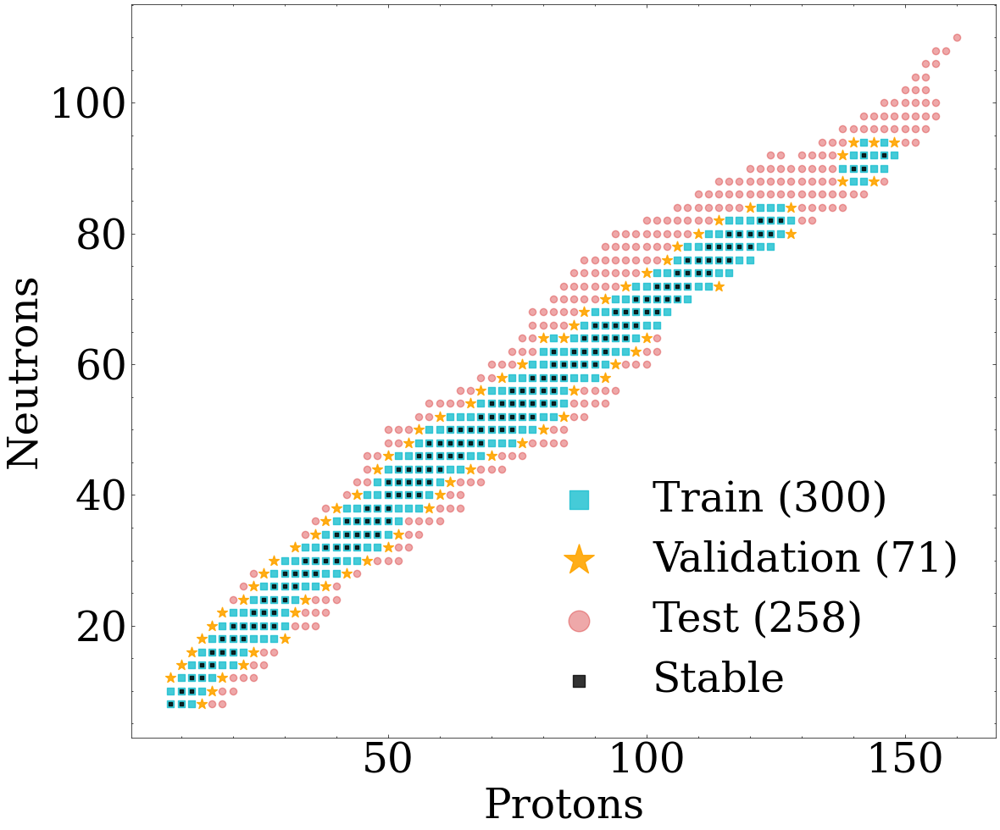

In [243]:
plt.rc("xtick", labelsize=35)
plt.rc("ytick", labelsize=35)

fig, ax = plt.subplots(figsize=(12,10), dpi=100)
plt.rcParams['text.usetex'] = False

color_trainig=colors_sets[9]
color_validation='orange'
color_testing=colors_sets[3]

marker_trainig='s'
marker_validation='*'
marker_testing='o'



size_trainig=30
size_validation=80
size_testing=35

alpha_trainig=0.8
alpha_validation=0.9
alpha_testing=0.4

ax.scatter(train_set.T[0], train_set.T[1], color = color_trainig, marker = marker_trainig, s = size_trainig, alpha = alpha_trainig, label = "Train ("+ str(len(train_set))+")")
ax.scatter(validation_set.T[0], validation_set.T[1], color = color_validation, marker = marker_validation, s = size_validation, alpha = alpha_validation, label = "Validation ("+ str(len(validation_set))+")")
ax.scatter(test_set.T[0], test_set.T[1], color = color_testing, marker = marker_testing, s = size_testing, alpha = alpha_testing, label = "Test ("+ str(len(test_set))+")")
ax.scatter(stable_coordinates.T[0], stable_coordinates.T[1], label = "Stable", alpha = 0.8,color='black',s=11,marker="s")

plt.xlabel("Protons",  fontsize = 35)
plt.ylabel("Neutrons", fontsize = 35)
plt.tight_layout()

plt.legend(markerscale = 3, fontsize = 35)

### Next step is to add the A number into our dataframe

In [244]:
models_output = filtered_NZ_df

In [245]:
models_output["A"] = models_output["N"] + models_output["Z"]
models_output

,N,Z,AME2020,ME2,MEdelta,PC1,NL3S,SKMS,SKP,SLY4,SV,UNEDF0,UNEDF1,UNEDF2,FRDM12,HFB24,BCPM,D1M,A
0,8,8,127.619315,126.738,129.026,127.455,128.114,128.856436,128.904993,129.839429,127.368236,126.708495,121.705460,121.950687,128.03,125.632422,127.007944,128.028806,16
1,10,8,139.807766,140.156,141.992,141.423,141.715,144.746257,144.484846,144.734392,141.963546,142.040342,136.123181,136.259511,141.84,138.095058,141.145503,141.000517,18
2,12,8,151.371414,151.224,152.793,153.215,153.432,158.460613,156.849135,156.488630,153.746333,154.121072,147.620242,148.128389,152.98,151.927694,153.041593,151.904718,20
3,14,8,162.027188,160.513,161.884,163.303,163.311,170.486446,167.278899,166.483309,163.855872,164.192707,157.219361,158.409799,161.39,161.930329,163.391272,160.883175,22
4,16,8,168.952452,167.472,168.465,170.768,170.970,178.908577,174.420231,173.303716,170.930478,171.196394,163.998623,165.167568,165.98,168.322965,170.887643,166.974152,24
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
624,154,106,1909.066432,1910.765,1907.813,1909.928,1914.193,1894.445901,1900.875946,1898.639172,1902.293050,1907.479821,1908.851310,1908.842630,1909.73,1909.145350,1905.125660,1901.308909,260
625,156,106,1923.387483,1925.019,1921.738,1924.361,1928.042,1909.221132,1915.371887,1912.434046,1916.575965,1921.884406,1922.815073,1922.920406,1923.99,1923.647986,1919.402948,1915.781516,262
626,156,108,1926.771317,1928.415,1925.436,1927.488,1932.395,1911.680941,1918.341803,1916.133844,1919.723353,1925.454882,1926.206982,1926.326995,1927.52,1926.745956,1922.608355,1918.524169,264
627,158,108,1941.337453,1943.010,1939.691,1942.276,1946.498,1927.231556,1933.157370,1930.669126,1934.554087,1940.259078,1940.812152,1940.991163,1942.52,1941.618592,1937.508145,1933.626547,266


In [246]:
models_output.rename(columns = {"AME2020" : "truth"}, inplace = True)
cols = models_output.columns.tolist()
cols[-1], cols[2] = cols[2], cols[-1]

models_output = models_output[cols]
models_output

,N,Z,A,ME2,MEdelta,PC1,NL3S,SKMS,SKP,SLY4,SV,UNEDF0,UNEDF1,UNEDF2,FRDM12,HFB24,BCPM,D1M,truth
0,8,8,16,126.738,129.026,127.455,128.114,128.856436,128.904993,129.839429,127.368236,126.708495,121.705460,121.950687,128.03,125.632422,127.007944,128.028806,127.619315
1,10,8,18,140.156,141.992,141.423,141.715,144.746257,144.484846,144.734392,141.963546,142.040342,136.123181,136.259511,141.84,138.095058,141.145503,141.000517,139.807766
2,12,8,20,151.224,152.793,153.215,153.432,158.460613,156.849135,156.488630,153.746333,154.121072,147.620242,148.128389,152.98,151.927694,153.041593,151.904718,151.371414
3,14,8,22,160.513,161.884,163.303,163.311,170.486446,167.278899,166.483309,163.855872,164.192707,157.219361,158.409799,161.39,161.930329,163.391272,160.883175,162.027188
4,16,8,24,167.472,168.465,170.768,170.970,178.908577,174.420231,173.303716,170.930478,171.196394,163.998623,165.167568,165.98,168.322965,170.887643,166.974152,168.952452
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
624,154,106,260,1910.765,1907.813,1909.928,1914.193,1894.445901,1900.875946,1898.639172,1902.293050,1907.479821,1908.851310,1908.842630,1909.73,1909.145350,1905.125660,1901.308909,1909.066432
625,156,106,262,1925.019,1921.738,1924.361,1928.042,1909.221132,1915.371887,1912.434046,1916.575965,1921.884406,1922.815073,1922.920406,1923.99,1923.647986,1919.402948,1915.781516,1923.387483
626,156,108,264,1928.415,1925.436,1927.488,1932.395,1911.680941,1918.341803,1916.133844,1919.723353,1925.454882,1926.206982,1926.326995,1927.52,1926.745956,1922.608355,1918.524169,1926.771317
627,158,108,266,1943.010,1939.691,1942.276,1946.498,1927.231556,1933.157370,1930.669126,1934.554087,1940.259078,1940.812152,1940.991163,1942.52,1941.618592,1937.508145,1933.626547,1941.337453


In [247]:
models_output_train = models_output.iloc[train_coordinates]

models_output_validation = models_output.iloc[validation_coordinates]

models_output_test = models_output.iloc[test_coordinates]

In [248]:
key_list=models_selected[1:]
print(len(key_list))
print(len(colors))

15
17


In [392]:
Z_range=(Selected_element,Selected_element)
N_range=(0,300)


filtered_models_output = models_output[(models_output['Z'] >= Z_range[0]) & (models_output['Z'] <= Z_range[1]) & 
                     (models_output['N'] >= N_range[0]) & (models_output['N'] <= N_range[1])]  

filtered_models_output_train = models_output_train[(models_output_train['Z'] >= Z_range[0]) & (models_output_train['Z'] <= Z_range[1]) & 
                     (models_output_train['N'] >= N_range[0]) & (models_output_train['N'] <= N_range[1])]

filtered_models_output_test = models_output_test[(models_output_test['Z'] >= Z_range[0]) & (models_output_test['Z'] <= Z_range[1]) & 
                     (models_output_test['N'] >= N_range[0]) & (models_output_test['N'] <= N_range[1])]

filtered_models_output_validation = models_output_validation[(models_output_validation['Z'] >= Z_range[0]) & (models_output_validation['Z'] <= Z_range[1]) & 
                     (models_output_validation['N'] >= N_range[0]) & (models_output_validation['N'] <= N_range[1])]


stable_selected_isotope=[]

for i in range(len(stable_coordinates)):
    if stable_coordinates[i][1]==Selected_element:
        stable_selected_isotope.append(stable_coordinates[i])

stable_selected_isotope=np.array(stable_selected_isotope)

# df[df['Column1'].isin(values_array)]

filtered_models_output_stable = models_output_train[(models_output_train['Z'] >= Z_range[0]) & (models_output_train['Z'] <= Z_range[1]) & 
                     (models_output_train['N'].isin(stable_selected_isotope.T[0]))]

In [393]:
filtered_models_output

,N,Z,A,ME2,MEdelta,PC1,NL3S,SKMS,SKP,SLY4,SV,UNEDF0,UNEDF1,UNEDF2,FRDM12,HFB24,BCPM,D1M,truth
240,50,50,100,825.941,822.052,826.926,828.530,826.288242,822.691386,828.611583,824.726244,826.912170,828.830587,829.853181,825.52,824.885137,823.496576,822.968432,825.162600
241,52,50,102,848.659,846.196,849.814,851.207,849.364428,847.781508,851.605589,848.943443,851.417385,852.516320,853.344606,850.23,849.067773,846.791661,845.646524,849.091993
242,54,50,104,870.666,869.126,871.759,873.135,871.383529,871.023119,873.167295,871.236657,874.244098,874.546832,875.381538,872.84,872.200409,869.065886,867.415059,871.926786
243,56,50,106,891.969,891.217,893.213,894.343,892.190570,892.942648,893.767401,892.399488,895.584326,895.511521,896.210348,894.41,893.713045,890.480655,888.405181,893.796060
244,58,50,108,912.716,912.408,914.077,914.826,911.582569,913.579282,913.499580,912.620544,915.727306,915.682848,915.839110,914.78,914.315681,911.281193,908.688814,914.654948
245,60,50,110,932.674,932.575,934.246,934.568,930.135328,933.197027,932.670884,932.051589,935.014543,934.973849,934.785166,934.59,934.058316,931.323345,928.295250,934.569625
246,62,50,112,952.012,951.805,953.690,953.532,948.361300,952.039737,951.230248,950.784548,953.622055,953.510473,953.085434,953.49,953.000952,950.673809,947.226378,953.525317
247,64,50,114,970.364,970.102,972.308,971.678,966.282253,970.160814,969.054331,968.793607,971.551835,971.249964,970.970799,971.47,971.073588,969.321409,965.470068,971.572649
248,66,50,116,988.071,987.348,990.025,988.990,983.758860,987.617816,986.193294,986.150392,988.821770,988.311787,988.017985,988.60,988.436224,987.002771,983.022213,988.681526
249,68,50,118,1004.653,1003.724,1006.883,1005.503,1000.771672,1004.358485,1002.927549,1002.858717,1005.495934,1004.626641,1004.059960,1004.84,1005.008860,1004.373072,999.910286,1004.951024


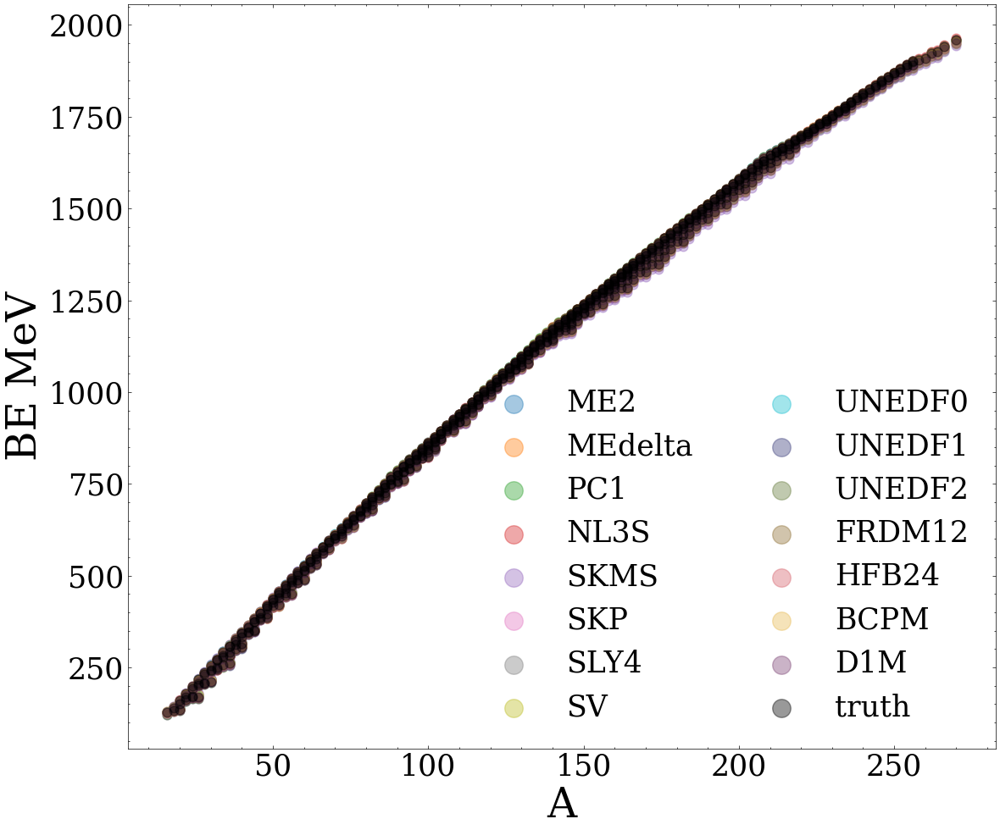

In [394]:
#Plot the binding energy with respect to the mass number

plt.rc("xtick", labelsize = 25)
plt.rc("ytick", labelsize = 25)

fig, ax = plt.subplots(figsize = (12,10), dpi = 100)

for i in range(len(key_list)):
    ax.scatter(models_output["A"], models_output[key_list[i]], color = colors[i], label = key_list[i], marker = markers[0], s= 60 , alpha = 0.4)

ax.scatter(models_output["A"], models_output["truth"], color = "black", alpha = 0.4, marker = markers[0], s = 60, label = "truth")

plt.xlabel("A", fontsize = 35)
plt.ylabel("BE MeV", fontsize = 35)
plt.tight_layout()
plt.legend(markerscale = 2, fontsize = 25, ncol = 2)

In [395]:
residuals = models_output['truth'].values[:,None] - models_output[key_list].values 
residuals_train = models_output_train['truth'].values[:,None] - models_output_train[key_list].values
residuals_validation = models_output_validation['truth'].values[:,None] - models_output_validation[key_list].values
residuals_test = models_output_test['truth'].values[:,None] - models_output_test[key_list].values

model_predictions=models_output[key_list].values
model_predictions_train=models_output_train[key_list].values
model_predictions_validation=models_output_validation[key_list].values
model_predictions_test=models_output_test[key_list].values

rmse_all = np.sqrt(np.mean(residuals**2, axis = 0))
rmse_train = np.sqrt(np.mean(residuals_train**2, axis = 0))
rmse_validation = np.sqrt(np.mean(residuals_validation**2, axis = 0))
rmse_test = np.sqrt(np.mean(residuals_test**2, axis = 0))

#### In the above code, the .values argument helps you transfrom from the Pandas series into an array. In our speicfic example, models_output['truth'].values will give you an array of size (n,), and models_output[key_list].values gives you an array of size (n,len(keylist)). The .[:, None] helps transform our array into size (n,1). NumPy broadcasting rules allow the subtraction of arrays with compatible shapes. Here, models_output['truth'].values[:, None] has shape (n, 1) and models_output[key_list].values has shape (n, 10). The (n, 1) array will be broadcast (repeated) across the columns to match the shape (n, 10)

In [396]:
models_summary = {}
models_summary["rmse_all"] = rmse_all
models_summary["rmse_train"] = rmse_train
models_summary["rmse_validation"] = rmse_validation
models_summary["rmse_test"] = rmse_test

models_summary = pd.DataFrame(models_summary, index = key_list)
models_summary

,rmse_all,rmse_train,rmse_validation,rmse_test
ME2,2.384449,2.472793,2.476089,2.250345
MEdelta,2.316343,2.455282,2.191281,2.179378
PC1,2.026546,1.938838,1.771511,2.185832
NL3S,2.841010,2.180150,2.153837,3.588086
SKMS,7.416662,4.914565,6.337776,9.745115
SKP,3.721933,3.062883,3.501502,4.414797
SLY4,5.344093,4.525944,4.841938,6.273489
SV,3.418812,2.966932,2.988416,3.975236
UNEDF0,1.558200,1.470986,2.024397,1.508496
UNEDF1,1.922609,1.824113,1.825458,2.055661


## Principal Component Analysis and Singular Value Decomposition

In [397]:
predictions_mean = np.mean(model_predictions, axis = 1) #We are taking the mean of each row, representing the mean of all models for 1 data point
predictions_mean_train = np.mean(model_predictions_train, axis = 1)
predictions_mean_validation = np.mean(model_predictions_validation, axis = 1)
predictions_mean_test = np.mean(model_predictions_test, axis = 1)


In [398]:
# By construction, we will examine SVD on the matrix of deviation from the mean
# For some reaon I do not fully understand, we only use the training data
model_predictions.shape

(629, 15)

In [399]:
model_predictions_processed_train = model_predictions_train - predictions_mean_train[:,None] # This is the first way using None argument
model_predictions_processed_train = model_predictions_train - predictions_mean_train.reshape((300,1)) # This is the second way using reshape argument
model_predictions_processed_train = model_predictions_train - predictions_mean_train[:, np.newaxis] # This is the third way using newaxis argument

model_predictions_processed_train

array([[-0.28639387,  2.00160613,  0.43060613, ..., -1.39197187,
        -0.01644987,  1.00441213],
       [-1.02527687,  0.81072313,  0.24172313, ..., -3.08621887,
        -0.03577387, -0.18075987],
       [-1.83816127, -0.26916127,  0.15283873, ..., -1.13446727,
        -0.02056827, -1.15744327],
       ...,
       [ 0.757566  ,  0.104566  ,  3.269566  , ...,  3.111221  ,
         0.572255  , -2.327187  ],
       [ 2.76588373,  0.24388373,  3.36788373, ...,  2.59460073,
         0.02178473, -3.29296027],
       [ 1.89481707,  0.31581707,  3.27181707, ...,  3.11680607,
         0.18090607, -2.94169493]])

### Decomposing the matrix

In [400]:
U, S, Vt = np.linalg.svd(model_predictions_processed_train)

In [401]:
S.shape

(15,)

In [402]:
pd.DataFrame(Vt)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
0,0.086127,0.065715,0.321272,0.243352,-0.505745,-0.198514,-0.408508,-0.188598,0.079425,0.228552,0.248229,0.212003,0.202196,-0.038003,-0.347504
1,-0.318099,-0.168958,0.141645,-0.247326,0.282619,0.313123,0.170539,-0.036086,0.290194,-0.031293,0.007075,0.193093,0.218326,-0.209257,-0.605596
2,0.118926,-0.058610,0.174307,0.032628,0.428062,-0.194073,-0.526221,-0.066179,0.113140,-0.403155,-0.351208,0.266792,0.220626,0.111399,0.133564
3,0.043573,0.591849,0.407298,0.104128,-0.072620,0.127999,0.243404,-0.115225,-0.300226,-0.315635,-0.318074,-0.049710,-0.148292,0.045357,-0.243826
4,-0.011050,-0.166438,0.521856,-0.090875,0.406663,-0.096330,-0.161483,-0.079799,-0.134747,0.118025,0.400410,-0.322433,-0.424609,0.079487,-0.038676
5,0.207107,-0.447296,0.193392,0.428638,-0.175842,-0.042595,0.278437,-0.004374,0.478316,-0.201961,-0.245871,-0.168469,-0.254456,0.004419,-0.049443
6,0.116469,-0.178636,0.065804,0.095770,0.176246,-0.553513,0.482382,-0.158123,-0.337377,-0.023975,0.113734,0.299460,0.189819,-0.304275,0.016215
7,-0.143909,-0.455766,0.387039,-0.226506,-0.325806,0.323798,0.059414,0.024067,-0.350654,-0.009875,-0.135783,0.284169,0.070814,0.207072,0.291927
8,0.153914,0.094665,0.281522,-0.521587,-0.118145,-0.271994,0.130066,-0.042645,0.259655,0.201574,-0.239616,-0.426163,0.380297,-0.013713,0.132172
9,-0.219884,0.255324,0.117669,-0.268644,-0.131618,-0.119095,0.039287,-0.152380,0.411342,-0.073391,0.092439,0.413349,-0.438581,-0.275222,0.349405


### Let's see how the singular values compare with each other

[1.15088463e+02 7.06105464e+01 3.49465867e+01 3.08576152e+01
 2.43479098e+01 2.02889104e+01 1.75444350e+01 1.03669358e+01
 9.05002605e+00 7.98073598e+00 6.20909530e+00 4.83721023e+00
 4.01760123e+00 2.65659635e+00 8.60613577e-12]


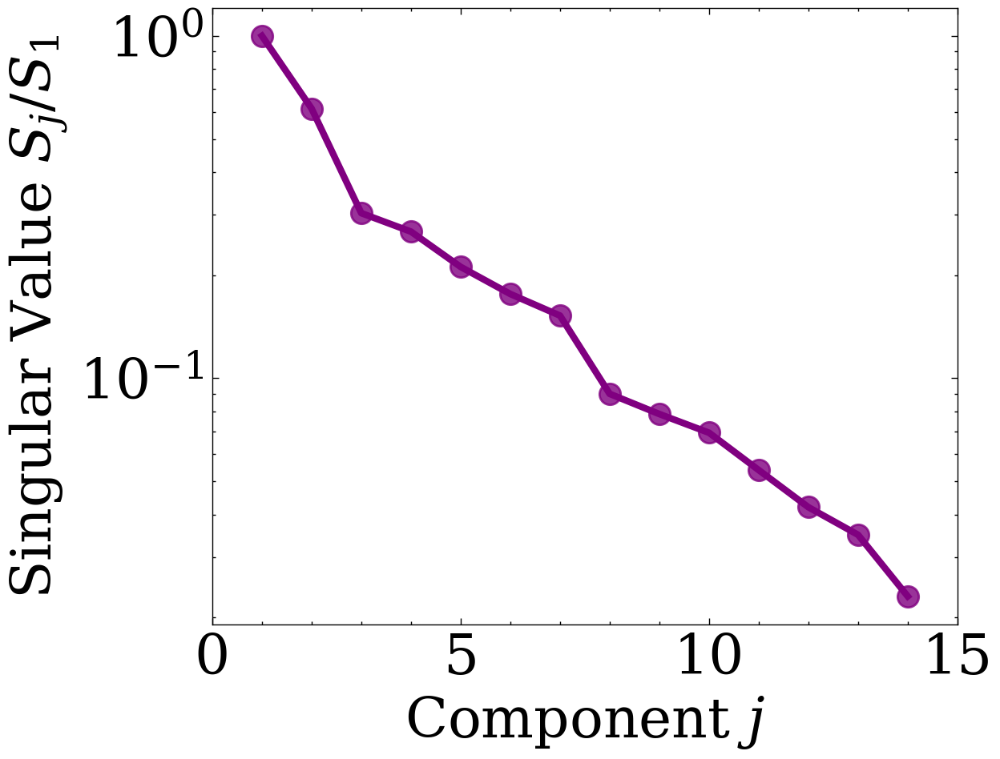

In [403]:
print(S)

plt.rc("xtick", labelsize = 25)
plt.rc("ytick", labelsize = 25)
plt.rcParams['text.usetex'] = False
fig, ax = plt.subplots(figsize = (6,5), dpi = 200)

ax.scatter(np.arange(1, S.size ), S[:-1]/S[0], color = "purple", alpha = 0.8, s = 90, marker = 'o')
ax.plot(np.arange(1, S.size ), S[:-1]/S[0], color = "purple", linewidth = 3)

ax.set_xticks([0,5,10,15])
plt.xlabel("Component $j$", fontsize = 25)
plt.ylabel("Singular Value $S_j/S_1$", fontsize = 25)
plt.yscale("log")
plt.show()

### The next step is to experiment with the number of principal components that we keep

In [404]:
components_kept = 5

In [405]:
S_hat = S[:components_kept]
# For some reasons I do not fully understand, we will consider the case that Vt_hat with no scaling at all to be
Vt_hat = np.array([Vt[i]/S[i] for i in range(components_kept)]) #Vt[i] will give you the (i+1)th row of our matrix
U_hat = U[:,:components_kept]

#The S needs to be absorved somewhere, either on the U or the V. We chosed the V, but we might want to have normalized Vs for plotting:
Vt_hat_normalized = Vt[:components_kept,:]
Vt_hat_normalized.shape

(5, 15)

In [406]:
num_components = components_kept + 1

### From what I read online and ChatGPT, the predictions of the k_th principal components are the products of the k_th coliumn of U with its respective sigular values (the k_th singular value). For some reason, in our case, we are only using the k_th column of the U matrix and not multiplying the sigular values. Please read the cell below carefully and see how do we do it 

In [407]:
#Creating principal components that are for training. These should be equivalent to \hat U, and if they are not there is something wrong


models_PC_train = {}

models_PC_train["PC_0"] = predictions_mean_train

for i in range(components_kept):
    models_PC_train["PC_" + str(i+1)] = np.dot(Vt_hat[i], model_predictions_train.T)

models_PC_train["N"] = models_output_train["N"]
models_PC_train["Z"] = models_output_train["Z"]
models_PC_train["A"] = models_output_train["N"] + models_output_train["Z"]

models_PC_training = pd.DataFrame(models_PC_train)

In [408]:
models_PC_training

,PC_0,PC_1,PC_2,PC_3,PC_4,PC_5,N,Z,A
0,127.024394,-0.042760,0.006274,0.081795,0.178644,-0.103193,8,8,16
1,141.181277,-0.057478,0.037589,0.062529,0.158771,-0.046489,10,8,18
2,153.062161,-0.063220,0.066787,0.091021,0.133902,-0.035948,12,8,20
6,133.803002,-0.059656,0.043952,0.043799,0.118011,-0.032431,8,10,18
7,157.416721,-0.025480,0.084163,0.115440,0.070387,-0.244479,10,10,20
...,...,...,...,...,...,...,...,...,...
583,1787.147393,0.096702,-0.006527,0.082672,-0.062402,-0.016155,144,92,236
584,1798.310414,0.094185,-0.001296,0.107485,-0.071165,-0.003951,146,92,238
585,1808.940434,0.094317,-0.000166,0.138123,-0.070085,0.006262,148,92,240
590,1785.307116,0.119545,-0.029262,0.039936,-0.036123,-0.043630,142,94,236


In [409]:
# We will do the same for validation

models_PC_validation = {}

models_PC_validation["PC_0"] = predictions_mean_validation

for i in range(components_kept):
    models_PC_validation["PC_" + str(i+1)] = np.dot(Vt_hat[i], model_predictions_validation.T)

models_PC_validation["N"] = models_output_validation["N"]
models_PC_validation["Z"] = models_output_validation["Z"]
models_PC_validation["A"] = models_PC_validation["N"] + models_PC_validation["Z"]

models_PC_validation = pd.DataFrame(models_PC_validation)

In [410]:
# We will do the same for test

models_PC_testing = {}

models_PC_testing["PC_0"] = predictions_mean_test

for i in range(components_kept):
    models_PC_testing["PC_" + str(i+1)] = np.dot(Vt_hat[i], model_predictions_test.T)

models_PC_testing["N"] = models_output_test["N"]
models_PC_testing["Z"] = models_output_test["Z"]
models_PC_testing["A"] = models_PC_testing["N"] + models_PC_testing["Z"]

models_PC_testing = pd.DataFrame(models_PC_testing)

In [411]:
models_PC = {}

models_PC["PC_0"] = predictions_mean

for i in range(components_kept):
    models_PC["PC_" + str(i+1)] = np.dot(Vt_hat[i], model_predictions.T)

models_PC["N"] = models_output["N"]
models_PC["Z"] = models_output["Z"]
models_PC["A"] = models_PC["N"] + models_PC["Z"]

models_PC = pd.DataFrame(models_PC)

### I do not understand what these graphs mean yet, right now it gives me comfort thinking of them as weights of each models (not normalized yet) into the principal components

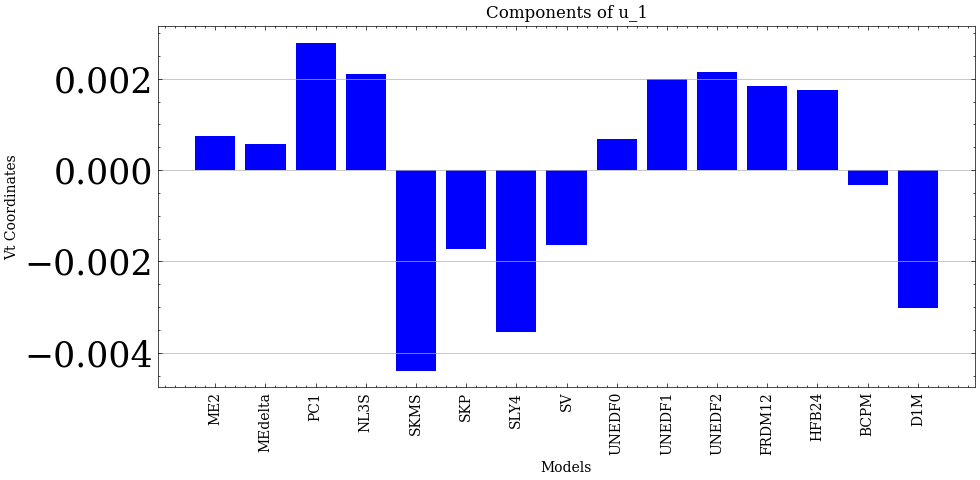

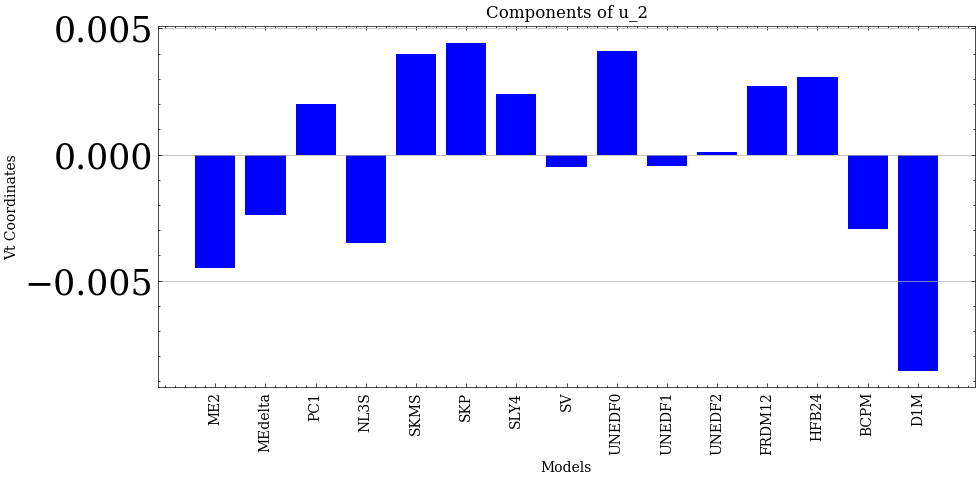

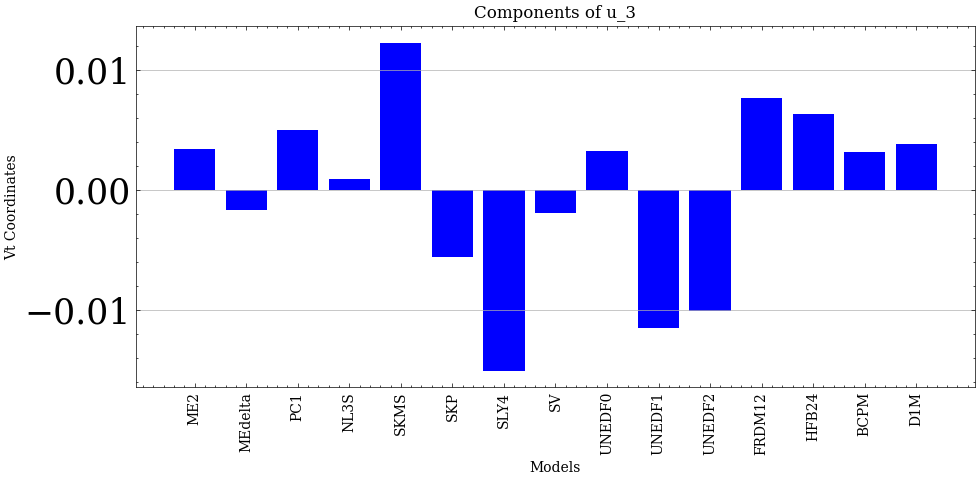

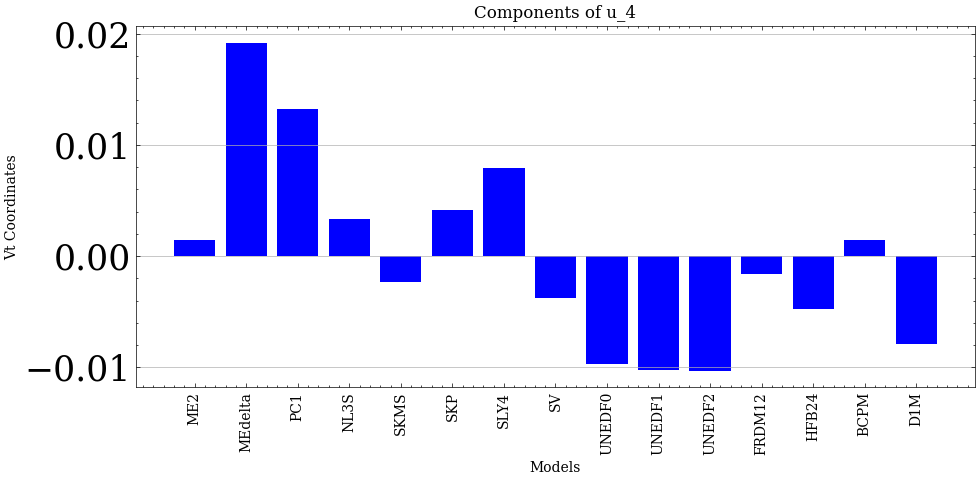

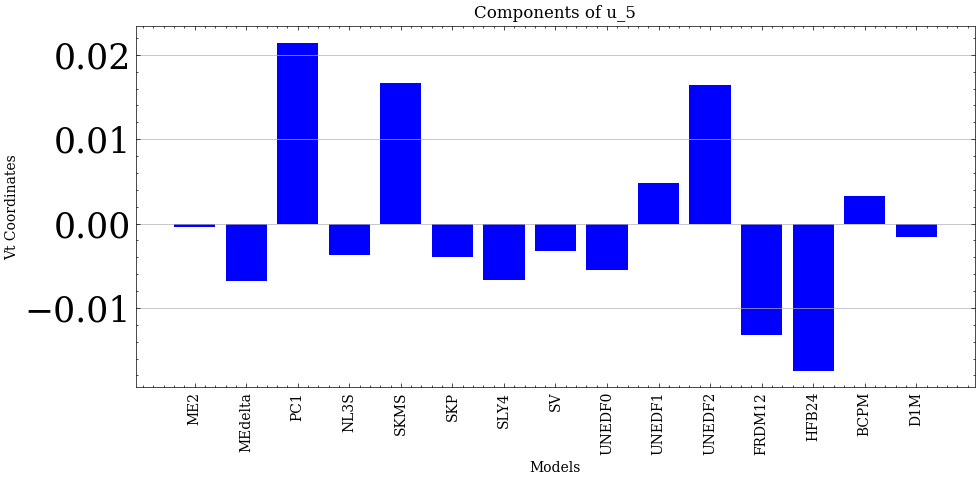

In [412]:
for i in range(components_kept):
    plot_bars(Vt_hat[i], key_list, title = f"Components of u_{i+1}", color = "blue")

### We are going to skip the part of plotting the projections of each model on the PCs as I do not fully understand the meaning of the coordinates of vectors in Vt 

## Calibration section: learning weight distributions from data

In [413]:
pd.DataFrame(models_PC_train)

,PC_0,PC_1,PC_2,PC_3,PC_4,PC_5,N,Z,A
0,127.024394,-0.042760,0.006274,0.081795,0.178644,-0.103193,8,8,16
1,141.181277,-0.057478,0.037589,0.062529,0.158771,-0.046489,10,8,18
2,153.062161,-0.063220,0.066787,0.091021,0.133902,-0.035948,12,8,20
6,133.803002,-0.059656,0.043952,0.043799,0.118011,-0.032431,8,10,18
7,157.416721,-0.025480,0.084163,0.115440,0.070387,-0.244479,10,10,20
...,...,...,...,...,...,...,...,...,...
583,1787.147393,0.096702,-0.006527,0.082672,-0.062402,-0.016155,144,92,236
584,1798.310414,0.094185,-0.001296,0.107485,-0.071165,-0.003951,146,92,238
585,1808.940434,0.094317,-0.000166,0.138123,-0.070085,0.006262,148,92,240
590,1785.307116,0.119545,-0.029262,0.039936,-0.036123,-0.043630,142,94,236


In [414]:
X = np.copy(U_hat)

y = np.copy(models_output_train["truth"].tolist() - predictions_mean_train)


In [415]:
X.shape

(300, 5)

In [416]:
U_hat.shape

(300, 5)

In [417]:
# We will first create a matrix X that contains our prediciton for the first few principal components and apply a result of linear regression
# to create the supermodel
X_train = []

for i in range(num_components):
    X_train.append(models_PC_train["PC_" + str(i)].tolist())

X_train = np.array(X_train)
X_train.shape

(6, 300)

In [418]:
X_validation = []

for i in range(num_components):
    X_validation.append(models_PC_validation["PC_" + str(i)].tolist())

X_validation = np.array(X_validation)

In [419]:
X_testing = []

for i in range(num_components):
    X_testing.append(models_PC_testing["PC_" + str(i)].tolist())

X_testing = np.array(X_testing)

In [420]:
X_full = []

for i in range(num_components):
    X_full.append(models_PC["PC_" + str(i)].tolist())

X_full = np.array(X_full)

In [421]:
X_full.shape

(6, 629)

### In the code section below, we will calculate the optimal parameters using the result of the least squared method in linear regression. There are some places I still do not understand such as how to calculate the covariance matrix.

For further consideration, please take a quick look into these 2 Wiki pages:
+ [Linear regression](https://en.wikipedia.org/wiki/Linear_regression#Estimation_methods)
+ [Bayesian linear regression](https://en.wikipedia.org/wiki/Linear_regression#Estimation_methods)

In [422]:
X_T_X = X.T.dot(X)
X_T_X_inv = np.linalg.inv(X_T_X)
X_T_X.shape
#In this line we will be calculating the optimal parameters(or coefficients of models) using least squared method

beta = X_T_X_inv.dot(X.T).dot(y) # Note that this is still an array of size 1 x n

beta_full = np.array([1] + beta.tolist()) #This includes the value 1, which is the prediction mean into our parameters

supermodel_train  = X_train.T.dot(beta_full)
supermodel_validation = X_validation.T.dot(beta_full)
supermodel_test = X_testing.T.dot(beta_full)
super_model_full = X_full.T.dot(beta_full)

# We will then construct the covariance matrix (which I do not really understand)
residuals = y - supermodel_train + predictions_mean_train

# This is the formula to calculate the variance
sigma_squared = np.sum(residuals**2)/len(residuals)

#The covariance matrix is calcuated as:
cov_matrix = sigma_squared * X_T_X_inv

samples = np.random.multivariate_normal(beta, cov_matrix, size = 500000)

In [423]:
len(beta)

5

In [424]:
sigma_squared

0.21214655587962228

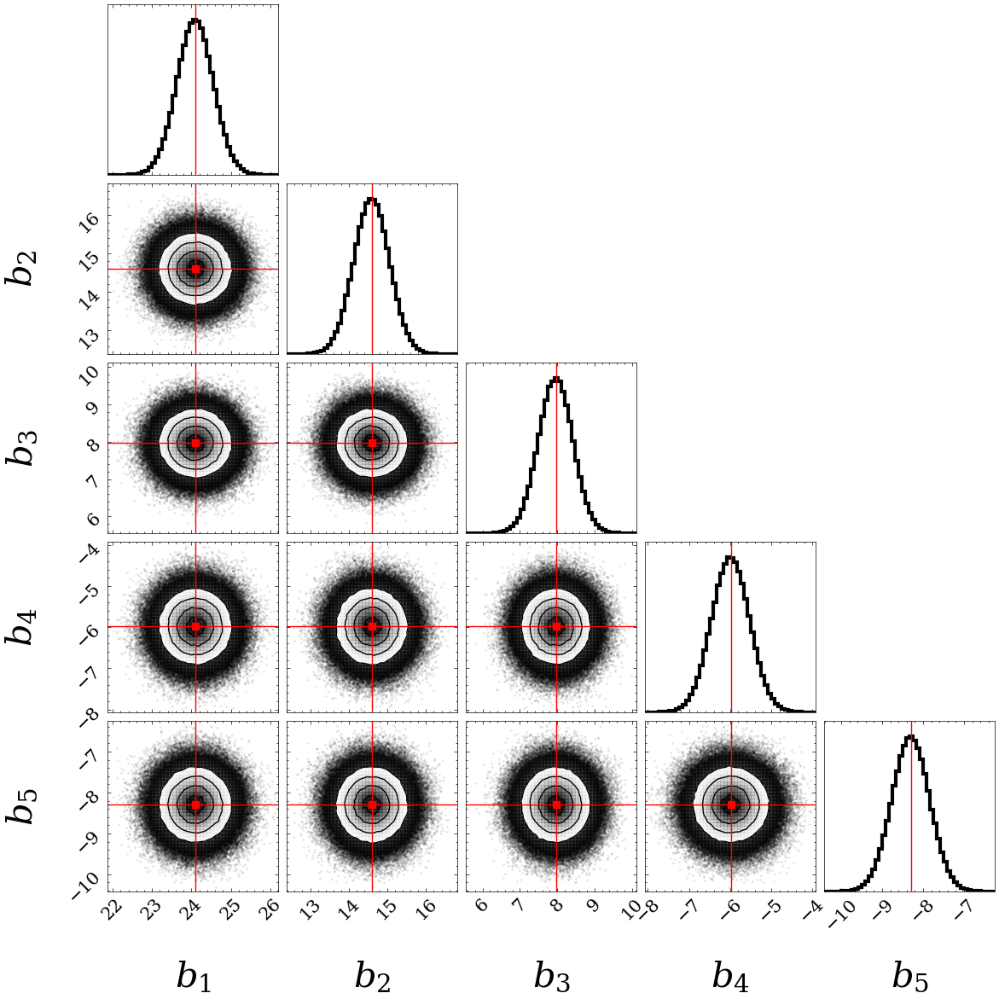

In [425]:
plt.rc("xtick", labelsize=15)
plt.rc("ytick", labelsize=15)
figure = corner.corner(samples,bins=50, dpi=300, hist_kwargs={"linewidth": 3},
                       labels=[f'$b_{i}$' for i in range(1, len(beta) + 1)], truths=beta,truth_color="r",
                       label_kwargs={"fontsize": 30},labelpad=0.1)


plt.show()

In [426]:
nu0_chosen=10
sigma20_chosen=0.5

In [427]:
def gibbs_sampler(y, X, iterations,prior_info):
    #Make sure that "y" has the correct structure. If data is being centered, it should have the mean already substracted
    b_mean_prior, b_mean_cov, nu0, sigma20  =  prior_info
    #From A_First_Course_in_Bayesian_Statistical_Methods (page ~ 159), 
    #nu0 represent the effective prior samples and sigma2_0 represents the expected prior variance
    
    b_mean_cov_inv=np.linalg.inv(b_mean_cov)
    n = len(y) # We are still taking mass and radius to be the same size
    
    X_T_X=X.T.dot(X)
    X_T_X_inv = np.linalg.inv(X_T_X)

    b_data = X_T_X_inv.dot(X.T).dot(y)

    
    
    supermodel=X.dot(b_data)
    

    residuals = y - supermodel 

    
    
    sigma2 = np.sum(residuals**2) / len(residuals) 
    cov_matrix = sigma2 * X_T_X_inv
    
    samples = []
    
    for i in range(iterations):
        # Sample from the conditional posterior of bs given sigma2 and data

        
        cov_matrix = np.linalg.inv(X_T_X/sigma2
                                   + b_mean_cov_inv)
        
        mean_vector = cov_matrix.dot(        b_mean_cov_inv.dot(b_mean_prior)+ X.T.dot(y)/sigma2  )
        
        
        b_current = np.random.multivariate_normal(mean_vector, cov_matrix)

        
        
        
        # Sample from the conditional posterior of sigma2 given bs and data
        supermodel=X.dot(b_current)
        
        residuals = y - supermodel 
        
        
        shape_post = (nu0 + n)/2.
        scale_post = (nu0*sigma20 + np.sum(residuals**2))/2.0
        # sigma2 = 1 / np.random.gamma(shape_post, 1/scale_post)
        sigma2 = 1 / np.random.default_rng().gamma(shape_post, 1/scale_post)
        
        
        samples.append(np.append(b_current,np.sqrt(sigma2)))
    


    return np.array(samples)

In [428]:
samples_global = gibbs_sampler(y,X, 200000,[np.full(components_kept,0),np.abs(np.diag(S[:components_kept]**2)), nu0_chosen, sigma20_chosen])

In [429]:
samples_global.shape

(200000, 6)

In [430]:
X_train[1:].T.shape

(300, 5)

In [431]:
label = [f'$b_{i}$' for i in range(1, components_kept +1)]
label.append(f'$\sigma$')

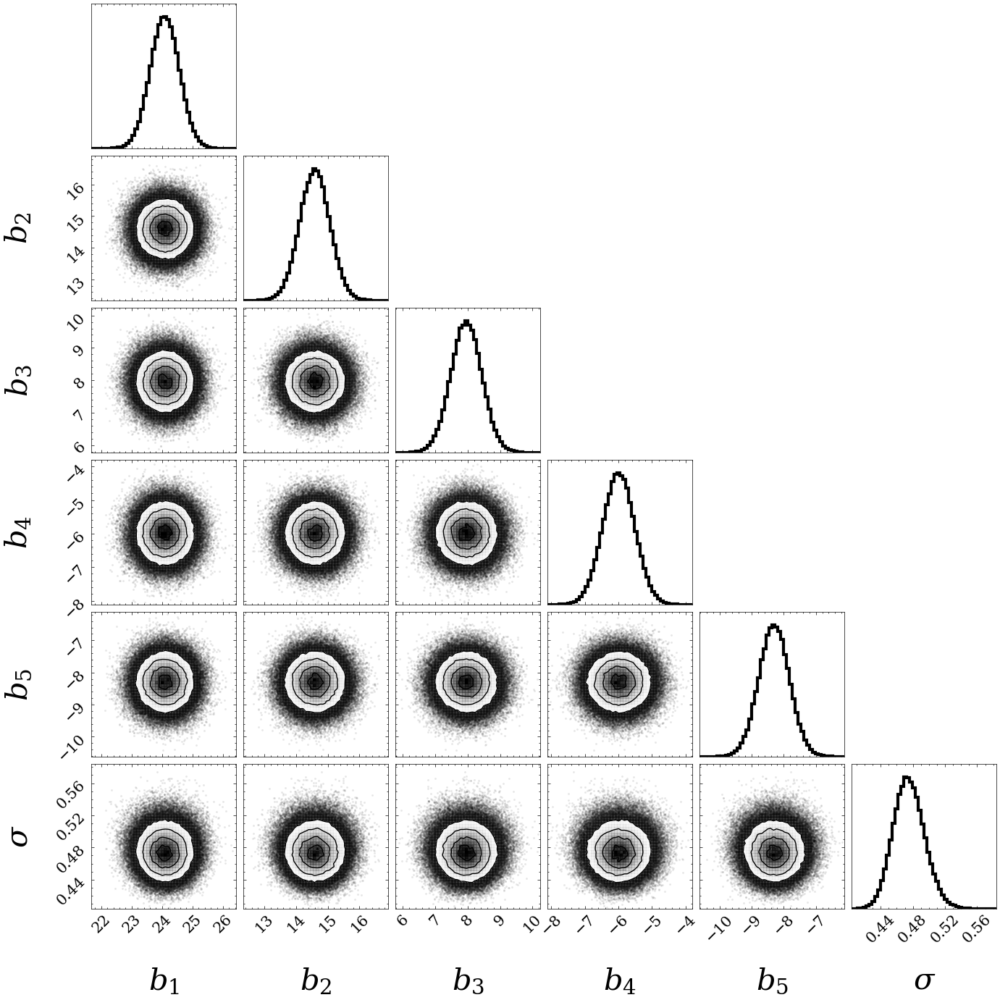

In [432]:
plt.rc("xtick", labelsize=15)
plt.rc("ytick", labelsize=15)
figure = corner.corner(samples_global,bins=50, dpi=300, hist_kwargs={"linewidth": 3},
                       labels=label, 
                       # truths=beta,truth_color="r",
                       label_kwargs={"fontsize": 30},labelpad=0.1)


plt.show()

In [433]:
# X_full is a matrix of size 6 x 629 that contains data from the 6 components
X_full_filtered_global = []
for i in range(len(X_full)):
    X_full_filtered_global.append(X_full[i][filtered_models_output.index])
X_full_filtered_global = np.array(X_full_filtered_global)

In [434]:
X_full_filtered_global.shape

(6, 18)

In [435]:
np.random.seed(142857)
# We will now try to see our predictions from the parameters obtained from the gibbs_sampling function

rng = np.random.default_rng()
# We now have a list that contains all the parameters sampled from our gibbs function. Let's try extract 100000 data points from that and
# calculate the predictions of our models based on these parameters
    
samples_random_global = rng.choice(samples_global, 100000, replace = False)

In [436]:
samples_random_global.shape

(100000, 6)

In [437]:
# Now, we want to calculate our predictions by multiplying the matrix of parameters with our X_full_filtered_global, which will result in 100000 x 18
# matrix with each row representing a prediction.
params_random_full_global = np.array([  np.insert(samples_random_global[i][:-1], 0, 1)  for i in range(len(samples_random_global))  ])

yvals_random = params_random_full_global.dot(X_full_filtered_global)

In [438]:
# Now we would want to add to our noise sampled from the gibbs function into our predictions
rndm_m_global = np.array([yvals_random[i] + np.random.multivariate_normal( np.full(len(yvals_random[i]), 0), np.diag(np.full(len(yvals_random[i]), samples_random_global[i][-1]**2)) ) \
                          for i in range(len(yvals_random)) ])


In [439]:
lower_global = np.percentile(rndm_m_global, 2.5, axis = 0)
median_global = np.percentile(rndm_m_global, 50, axis = 0)
upper_global = np.percentile(rndm_m_global, 97.5, axis = 0)

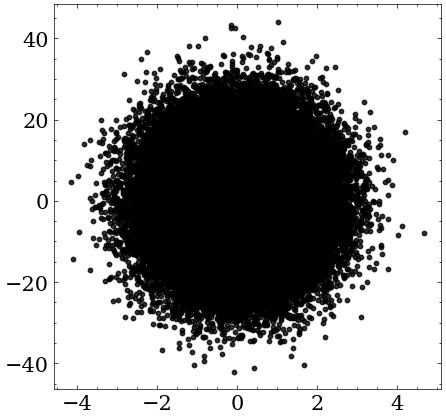

In [440]:
mean = [0, 0]

# # 2x2 covariance matrix
# cov = [[1, 0.5], [0.5, 1]]
# cov = [[1, 0], [0, 1]]
# cov = [[1, 1], [1, 1]]
cov = [[1, 0], [0, 100]]

# Draw 5 samples from the multivariate normal distribution
samples = np.random.multivariate_normal(mean, cov, size=100000)

fig,ax = plt.subplots(figsize = (5,5))

ax.scatter(samples[:,0], samples[:,1], color = "black", alpha = 0.8, marker = "o", s = 10)

# plt.rc("xtick", labelsize=15)
# plt.rc("ytick", labelsize=15)

# figure = corner.corner(samples,bins=50, dpi=300, hist_kwargs={"linewidth": 3},
#                        labels=[f'$b_{i}$' for i in range(1, len(beta) + 1)], truths=beta,truth_color="r",
#                        label_kwargs={"fontsize": 30},labelpad=0.1)


# plt.show()

(array([2.000e+00, 1.000e+00, 1.000e+00, 1.000e+00, 1.000e+00, 7.000e+00,
        5.000e+00, 7.000e+00, 1.300e+01, 1.800e+01, 2.300e+01, 2.500e+01,
        4.300e+01, 4.600e+01, 3.700e+01, 8.300e+01, 9.900e+01, 1.030e+02,
        1.450e+02, 1.990e+02, 2.290e+02, 2.860e+02, 3.460e+02, 4.010e+02,
        5.020e+02, 5.760e+02, 7.200e+02, 7.950e+02, 9.460e+02, 1.045e+03,
        1.286e+03, 1.334e+03, 1.551e+03, 1.802e+03, 1.888e+03, 2.146e+03,
        2.297e+03, 2.452e+03, 2.616e+03, 2.815e+03, 2.966e+03, 3.124e+03,
        3.275e+03, 3.282e+03, 3.264e+03, 3.628e+03, 3.472e+03, 3.607e+03,
        3.450e+03, 3.404e+03, 3.291e+03, 3.307e+03, 3.083e+03, 2.914e+03,
        2.775e+03, 2.691e+03, 2.522e+03, 2.326e+03, 2.246e+03, 1.823e+03,
        1.669e+03, 1.633e+03, 1.347e+03, 1.198e+03, 1.049e+03, 9.930e+02,
        8.230e+02, 6.860e+02, 5.880e+02, 4.920e+02, 4.080e+02, 3.340e+02,
        3.060e+02, 2.580e+02, 1.670e+02, 1.560e+02, 1.130e+02, 9.700e+01,
        8.100e+01, 6.300e+01, 4.700e+0

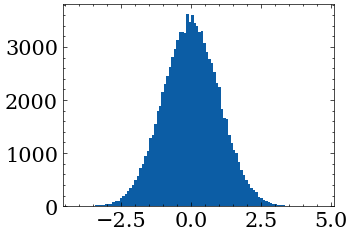

In [441]:
plt.hist(samples[:,0],bins = 100)

## Combined forecasts $f^{\dagger} (\vec{x}) = \displaystyle \sum_{j=1}^n b_j \phi_j(\vec{x})  $ where $\phi_j(\vec{x})$ is the $j_{th}$ principal components

## Our principal components' weights has the type $b_j \to c_j^0 + c_j^ZZ + c_j^NN$ with the first 2 principal components

In [442]:
pd.DataFrame(models_PC)


,PC_0,PC_1,PC_2,PC_3,PC_4,PC_5,N,Z,A
0,127.024394,-0.042760,0.006274,0.081795,0.178644,-0.103193,8,8,16
1,141.181277,-0.057478,0.037589,0.062529,0.158771,-0.046489,10,8,18
2,153.062161,-0.063220,0.066787,0.091021,0.133902,-0.035948,12,8,20
3,162.968811,-0.074180,0.086597,0.099869,0.124418,0.030800,14,8,22
4,169.851023,-0.081620,0.090201,0.103433,0.139662,0.105827,16,8,24
...,...,...,...,...,...,...,...,...,...
624,1905.962450,0.164369,-0.063620,0.016150,0.024505,-0.119953,154,106,260
625,1920.213691,0.161626,-0.059449,0.037248,0.015661,-0.111482,156,106,262
626,1923.533419,0.169143,-0.062506,0.019631,0.029227,-0.135008,156,108,264
627,1938.294854,0.163609,-0.057470,0.039258,0.012507,-0.121986,158,108,266


In [443]:
models_PC_train_local = {}
models_PC_train_local["PC_0"] = models_PC_train["PC_0"]
for i in range(components_kept):
    models_PC_train_local["PC_" + str(i+1)] = models_PC_train["PC_" + str(i+1)]
for i in range(components_kept):
    models_PC_train_local["PC_" + str(i+1) + "_Z"] = models_PC_train["PC_" + str(i+1)] * models_PC_train["Z"]
for i in range(components_kept):
    models_PC_train_local["PC_" + str(i+1) + "_N"] = models_PC_train["PC_" + str(i+1)] * models_PC_train["N"]
models_PC_train_local["Z"] = models_PC_train["Z"]
models_PC_train_local["N"] = models_PC_train["N"]
# models_PC_train_local_NZ = {}
# for i in range(components_kept):
#     models_PC_train_local_NZ["PC_" + str(i+1) + "_Z"] = models_PC_train["PC_" + str(i+1)] * models_PC_train["Z"]
#     models_PC_train_local_NZ["PC_" + str(i+1) + "_N"] = models_PC_train["PC_" + str(i+1)] * models_PC_train["N"]
# # I am going to also extract the columns of PC x Z for further analysis
# models_PC_train_local = pd.DataFrame(models_PC_train_local)
# models_PC_train_local_NZ = pd.DataFrame(models_PC_train_local_NZ)



In [444]:
pd.DataFrame(models_PC_train_local)

,PC_0,PC_1,PC_2,PC_3,PC_4,PC_5,PC_1_Z,PC_2_Z,PC_3_Z,PC_4_Z,PC_5_Z,PC_1_N,PC_2_N,PC_3_N,PC_4_N,PC_5_N,Z,N
0,127.024394,-0.042760,0.006274,0.081795,0.178644,-0.103193,-0.342080,0.050194,0.654359,1.429153,-0.825548,-0.342080,0.050194,0.654359,1.429153,-0.825548,8,8
1,141.181277,-0.057478,0.037589,0.062529,0.158771,-0.046489,-0.459820,0.300710,0.500232,1.270169,-0.371912,-0.574776,0.375887,0.625291,1.587712,-0.464891,8,10
2,153.062161,-0.063220,0.066787,0.091021,0.133902,-0.035948,-0.505757,0.534299,0.728168,1.071214,-0.287588,-0.758636,0.801448,1.092252,1.606822,-0.431382,8,12
6,133.803002,-0.059656,0.043952,0.043799,0.118011,-0.032431,-0.596564,0.439524,0.437991,1.180106,-0.324310,-0.477251,0.351619,0.350392,0.944085,-0.259448,10,8
7,157.416721,-0.025480,0.084163,0.115440,0.070387,-0.244479,-0.254801,0.841632,1.154395,0.703872,-2.444790,-0.254801,0.841632,1.154395,0.703872,-2.444790,10,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
583,1787.147393,0.096702,-0.006527,0.082672,-0.062402,-0.016155,8.896548,-0.600461,7.605814,-5.741008,-1.486286,13.925031,-0.939852,11.904753,-8.985925,-2.326361,92,144
584,1798.310414,0.094185,-0.001296,0.107485,-0.071165,-0.003951,8.665004,-0.119254,9.888666,-6.547207,-0.363505,13.750984,-0.189250,15.692882,-10.390133,-0.576866,92,146
585,1808.940434,0.094317,-0.000166,0.138123,-0.070085,0.006262,8.677126,-0.015227,12.707297,-6.447801,0.576118,13.958854,-0.024496,20.442174,-10.372549,0.926799,92,148
590,1785.307116,0.119545,-0.029262,0.039936,-0.036123,-0.043630,11.237231,-2.750624,3.753950,-3.395571,-4.101226,16.975392,-4.155198,5.670861,-5.129479,-6.195469,94,142


In [445]:
models_PC_validation_local = {}
models_PC_validation_local["PC_0"] = models_PC_validation["PC_0"]
for i in range(components_kept):
    models_PC_validation_local["PC_" + str(i+1)] = models_PC_validation["PC_" + str(i+1)]
for i in range(components_kept):
    models_PC_validation_local["PC_" + str(i+1) + "_Z"] = models_PC_validation["PC_" + str(i+1)] * models_PC_validation["Z"]
for i in range(components_kept):
    models_PC_validation_local["PC_" + str(i+1) + "_N"] = models_PC_validation["PC_" + str(i+1)] * models_PC_validation["N"]
models_PC_validation_local["Z"] = models_PC_validation["Z"]
models_PC_validation_local["N"] = models_PC_validation["N"]

In [446]:
models_PC_test_local = {}
models_PC_test_local["PC_0"] = models_PC_testing["PC_0"]
for i in range(components_kept):
    models_PC_test_local["PC_" + str(i+1)] = models_PC_testing["PC_" + str(i+1)]
for i in range(components_kept):
    models_PC_test_local["PC_" + str(i+1) + "_Z"] = models_PC_testing["PC_" + str(i+1)] * models_PC_testing["Z"]
for i in range(components_kept):
    models_PC_test_local["PC_" + str(i+1) + "_N"] = models_PC_testing["PC_" + str(i+1)] * models_PC_testing["N"]
models_PC_test_local["Z"] = models_PC_testing["Z"]
models_PC_test_local["N"] = models_PC_testing["N"]

In [447]:
models_PC_local = {}
models_PC_local["PC_0"] = models_PC["PC_0"]
for i in range(components_kept):
    models_PC_local["PC_" + str(i+1)] = models_PC["PC_" + str(i+1)]
for i in range(components_kept):
    models_PC_local["PC_" + str(i+1) + "_Z"] = models_PC["PC_" + str(i+1)] * models_PC["Z"]
for i in range(components_kept):
    models_PC_local["PC_" + str(i+1) + "_N"] = models_PC["PC_" + str(i+1)] * models_PC["N"]
models_PC_local["Z"] = models_PC["Z"]
models_PC_local["N"] = models_PC["N"]

In [448]:
pd.DataFrame(models_PC_local)

,PC_0,PC_1,PC_2,PC_3,PC_4,PC_5,PC_1_Z,PC_2_Z,PC_3_Z,PC_4_Z,PC_5_Z,PC_1_N,PC_2_N,PC_3_N,PC_4_N,PC_5_N,Z,N
0,127.024394,-0.042760,0.006274,0.081795,0.178644,-0.103193,-0.342080,0.050194,0.654359,1.429153,-0.825548,-0.342080,0.050194,0.654359,1.429153,-0.825548,8,8
1,141.181277,-0.057478,0.037589,0.062529,0.158771,-0.046489,-0.459820,0.300710,0.500232,1.270169,-0.371912,-0.574776,0.375887,0.625291,1.587712,-0.464891,8,10
2,153.062161,-0.063220,0.066787,0.091021,0.133902,-0.035948,-0.505757,0.534299,0.728168,1.071214,-0.287588,-0.758636,0.801448,1.092252,1.606822,-0.431382,8,12
3,162.968811,-0.074180,0.086597,0.099869,0.124418,0.030800,-0.593441,0.692772,0.798955,0.995344,0.246399,-1.038522,1.212352,1.398172,1.741852,0.431199,8,14
4,169.851023,-0.081620,0.090201,0.103433,0.139662,0.105827,-0.652964,0.721607,0.827463,1.117295,0.846617,-1.305928,1.443214,1.654926,2.234589,1.693234,8,16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
624,1905.962450,0.164369,-0.063620,0.016150,0.024505,-0.119953,17.423099,-6.743773,1.711927,2.597577,-12.715028,25.312804,-9.797557,2.487139,3.773838,-18.472777,106,154
625,1920.213691,0.161626,-0.059449,0.037248,0.015661,-0.111482,17.132394,-6.301598,3.948336,1.660078,-11.817114,25.213712,-9.274050,5.810759,2.443133,-17.391224,106,156
626,1923.533419,0.169143,-0.062506,0.019631,0.029227,-0.135008,18.267497,-6.750643,2.120176,3.156472,-14.580820,26.386385,-9.750929,3.062477,4.559349,-21.061185,108,156
627,1938.294854,0.163609,-0.057470,0.039258,0.012507,-0.121986,17.669726,-6.206798,4.239897,1.350775,-13.174461,25.850155,-9.080315,6.202812,1.976134,-19.273748,108,158


In [449]:
X_full_local = pd.DataFrame(models_PC_local).iloc[:,0:-2].values

In [450]:
# We want to create an array that contains every columns of models_PC_train_local except for the mean column

X_train_centered_local = pd.DataFrame(models_PC_train_local).iloc[:,1:-2].values # We select everything except the first column and turn it into an array of shape (300,9)
y = np.copy(models_output_train["truth"].tolist() - predictions_mean_train)

In [451]:
X_train_local = pd.DataFrame(models_PC_train_local).iloc[:,0:-2].values
X_validation_local = pd.DataFrame(models_PC_validation_local).iloc[:,0:-2].values
X_test_local = pd.DataFrame(models_PC_test_local).iloc[:,0:-2].values


In [452]:
X_train_centered_local.shape

(300, 15)

In [453]:
# #Let's first test how this new dependence affect our parameters

# #Here I am using the least squared estimation method for our new dataset X_local
# X_T_X_local = X_local.T.dot(X_local)
# X_T_X_local_inv = np.linalg.inv(X_T_X_local)

# beta_local =  X_T_X_local_inv.dot(X_local.T).dot(y)

# beta_local_full = np.insert(beta_local, 0, 1)

# supermodel_local = pd.DataFrame(models_PC_train_local).iloc[:,:-2].values.dot(beta_local_full)

# residuals = y + predictions_mean_train - supermodel_local

# sigma_squared_local = np.sum(residuals**2)/len(y)
# cov_matrix_local = sigma_squared_local * X_T_X_local_inv

# samples_local = np.random.multivariate_normal(beta_local, cov_matrix_local, size = 500000)

In [454]:
# beta_local

In [455]:
# sigma_squared_local

In [456]:
# plt.rc("xtick", labelsize=15)
# plt.rc("ytick", labelsize=15)
# figure = corner.corner(samples_local,bins=50, dpi=300, hist_kwargs={"linewidth": 3},
#                        labels=[f'$c_{i}^{j}$' for i in range(1, components_kept + 1 ) for j in range(0, 3) ], truths=beta_local,truth_color="r",
#                        label_kwargs={"fontsize": 30},labelpad=0.1)


# plt.show()


## Unconstrained approach with unknown variance (MC sampling)

In [457]:
nu0_chosen=10
sigma20_chosen=0.5

In [458]:
deviation_list = S[:components_kept].tolist()
deviation_list.extend([2 for i in range(2*components_kept)])

In [459]:
S[:6]

array([115.08846293,  70.61054644,  34.94658673,  30.85761523,
        24.34790975,  20.28891035])

In [460]:
samples_local=gibbs_sampler(y, X_train_centered_local, 200000,[np.full(components_kept*3,0),np.abs(np.diag(np.array(deviation_list)**2)), nu0_chosen, sigma20_chosen])

In [461]:
labels_MCMC_local=[f'$c_{i}^{j}$' for j in range(0, 3)  for i in range(1, components_kept + 1 )]
labels_MCMC_local.append(f'$\sigma$')

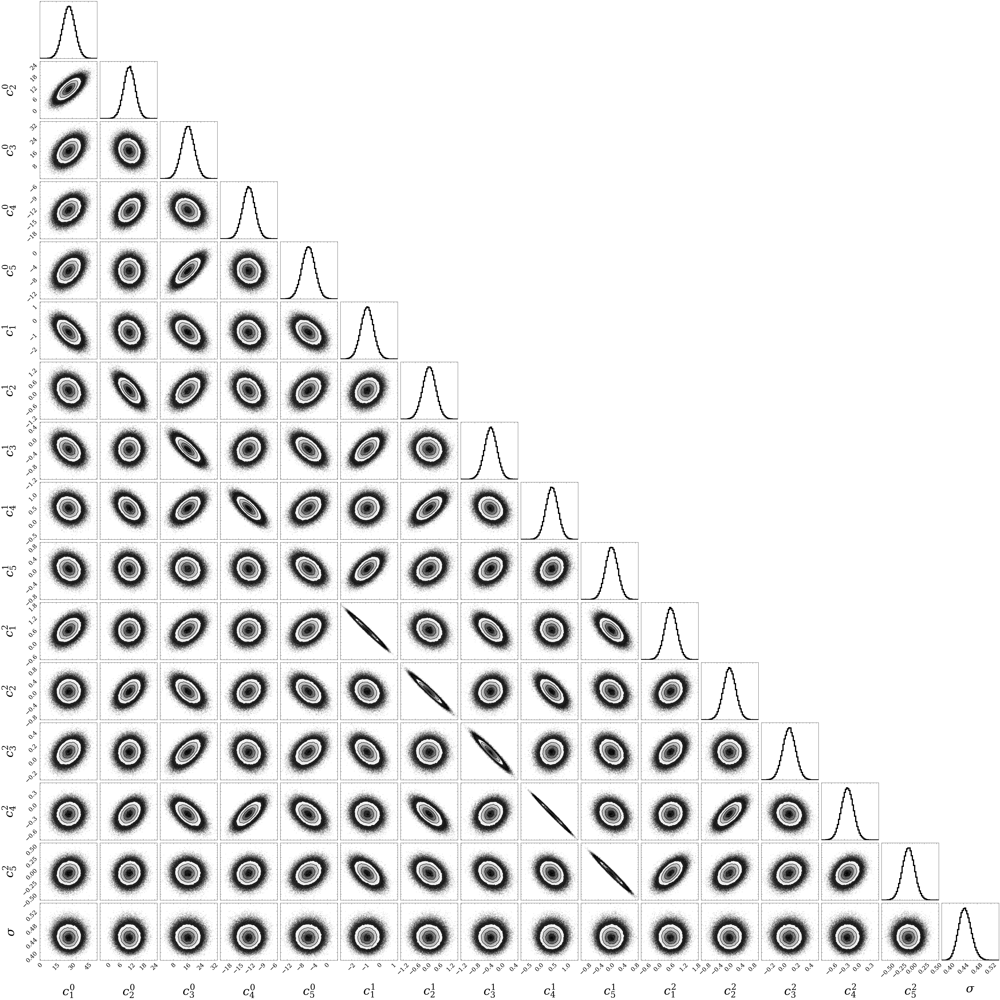

In [462]:
plt.rc("xtick", labelsize=15)
plt.rc("ytick", labelsize=15)

figure = corner.corner(samples_local,bins=50, dpi=300, hist_kwargs={"linewidth": 3},
                       labels=labels_MCMC_local, 
                    #    truths=np.append(beta,np.sqrt(sigma_squared)),
                    #    truth_color="r",
                       label_kwargs={"fontsize": 30},labelpad=0.1)



# ndim=len(res_gibbs_local[0])

# # Access the axes
# axes = np.array(figure.axes).reshape((ndim, ndim))

# ax=axes[2,0]           
# ax.locator_params(nbins=3, axis='x')            
            
plt.show()


In [463]:
samples_local.shape

(200000, 16)

In [464]:
samples_local.T[0:-1].shape

(15, 200000)

### Before applying the simplex contraints to our gibbs sampling algorithm, we first need to find a way to quantify the weights of our original model in our combined forecasts. In our above analysis, we have found the list of parameters that made up $bj = c_j^0 + c_j^1Z + c_j^2N$. Our combined model now can be expressed as:
$$\Large f^{t} = \displaystyle \sum_{k=1}^{m} c_k^{(0)} \phi_k +  \sum_{k=1}^{m} c_k^{(1)} (Z \times \phi_k) +  \sum_{k=1}^{m} c_k^{(2)} (N \times \phi_k)$$

### For $m$ is the number of PCs that we kept. Our goal is to find the weights $w_i(\vec{x}) = w_i^{(0)} + w_i^{(1)}\vec{Z} + w_i^{(2)}\vec{N}$. That means our combined models can be characterized by:
$$ \Large f^{t} = \displaystyle \sum_{i=1}^{n} w_i^{(0)} f_i +  \sum_{i=1}^{m} w_i^{(1)} (Z \times f_i) +  \sum_{i=1}^{n} w_i^{(2)} (N \times \phi_k)   $$

### We have a formula that relates the $k_th$ principal components to our original models by: $ \phi_k = \displaystyle \sum_{i=1}^{n} a_{i}^{(k)}f_i$. We need to do the same for $Z\times \phi_k$ and $N \times \phi_k $ with respect to $Z \times f_i$ and $N \times f_i$. 


In [465]:
# # First, we need to create data sets that contains N x f and Z x f where f is our observations that has been subtracted from the mean


# models_name_list = models_output_train.keys()[3:-1]
# models_output_train_Z = {}
# for model in models_name_list:
#     models_output_train_Z[model + str("_Z")] = (models_output_train[model] - predictions_mean_train) * models_output_train["Z"]

# models_output_train_Z_df = pd.DataFrame(models_output_train_Z)
# models_output_train_Z = models_output_train_Z_df.values

In [466]:
# models_output_train_N = {}
# for model in models_name_list:
#     models_output_train_N[model + str("_N")] = (models_output_train[model] - predictions_mean_train) * models_output_train["N"]

# models_output_train_N_df = pd.DataFrame(models_output_train_N)
# models_output_train_N = models_output_train_Z_df.values

In [467]:
# params_Z = OLS_params_calculate("Z", models_PC_train_local, models_output_train_Z, components_kept)
# params_N = OLS_params_calculate("N", models_PC_train_local, models_output_train_N, components_kept)

In [468]:
# c_0 = res_gibbs_local[:,[0,3]]
# c_1 = res_gibbs_local[:,[1,4]]
# c_2 = res_gibbs_local[:,[2,5]]

In [469]:
# weight_matrix = c_0.dot(Vt_hat)
# weight_matrix_Z = c_1.dot(Vt_hat)
# weight_matrix_N = c_2.dot(Vt_hat)

In [470]:
# In this cell we are going to extract our matrix of the local PCs with a spcific proton number provided by the filtered_models_output

X_full_filtered_local = []
for i in range(len(X_full_local.T)):
    X_full_filtered_local.append(X_full_local.T[i][filtered_models_output.index])
X_full_filtered_local = np.array(X_full_filtered_local)
X_full_filtered_local.shape

(16, 18)

In [471]:
np.random.seed(142857)
# We will now try to see our predictions from the parameters obtained from the gibbs_sampling function

rng = np.random.default_rng()
# We now have a list that contains all the parameters sampled from our gibbs function. Let's try extract 100000 data points from that and
# calculate the predictions of our models based on these parameters
    
samples_random_local = rng.choice(samples_local, 100000, replace = False)

In [472]:
params_random_full_local = np.array([  np.insert(samples_random_local[i][:-1], 0, 1)  for i in range(len(samples_random_local))  ])

yvals_random_local = params_random_full_local.dot(X_full_filtered_local)

In [473]:
rndm_m_local = np.array([yvals_random_local[i] + np.random.multivariate_normal( np.full(len(yvals_random_local[i]), 0),\
                        np.diag(np.full(len(yvals_random_local[i]), samples_random_local[i][-1]**2)) ) \
                        for i in range(len(yvals_random_local)) ])

In [474]:
yvals_random_local

array([[ 825.07274992,  849.64198538,  872.65951715, ..., 1090.19277784,
        1101.81268405, 1108.8954333 ],
       [ 825.48092527,  849.91342245,  872.87598206, ..., 1090.38605944,
        1102.10923595, 1109.44865591],
       [ 825.14870888,  849.58264332,  872.59109366, ..., 1090.43031879,
        1102.19187887, 1109.65161467],
       ...,
       [ 825.02597659,  849.62089309,  872.66961785, ..., 1090.79155593,
        1102.62467729, 1109.89558573],
       [ 825.45951956,  849.86079044,  872.76632241, ..., 1090.19787157,
        1101.86138929, 1109.23519214],
       [ 824.81981415,  849.60689397,  872.70338499, ..., 1090.68068382,
        1102.62771481, 1109.77577304]])

In [475]:
lower_local = np.percentile(rndm_m_local, 2.5, axis = 0)
median_local = np.percentile(rndm_m_local, 50, axis = 0)
upper_local = np.percentile(rndm_m_local, 97.5, axis = 0)

In [476]:
upper_local

array([ 826.35122596,  850.75826847,  873.68422351,  895.28727592,
        915.81732434,  935.53070319,  954.44031405,  972.51166048,
        989.80361543, 1006.3243196 , 1022.17666086, 1037.29545934,
       1051.77578982, 1065.54463109, 1078.92731571, 1091.32005776,
       1103.13244231, 1110.46485956])

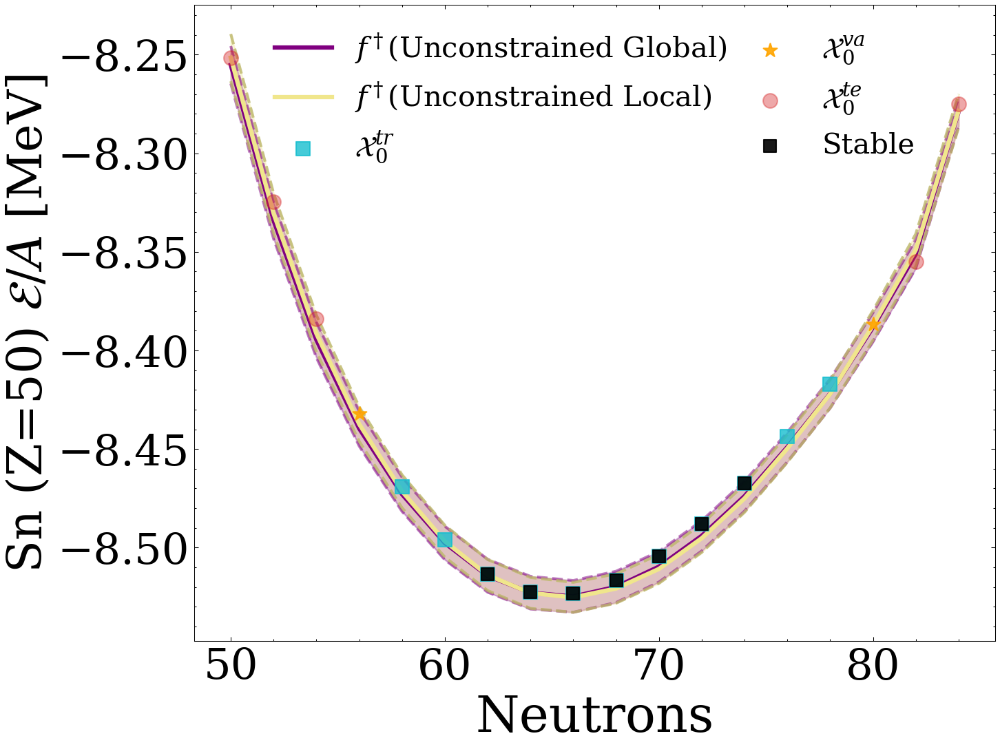

In [478]:
plt.rc("xtick", labelsize=30)
plt.rc("ytick", labelsize=30)

fig, ax = plt.subplots(figsize=(10,8), dpi=150)

plt.plot(filtered_models_output["N"], -median_global/filtered_models_output['A'], color="purple", label='$f^\dagger$(Unconstrained Global)',linewidth=3)

plt.plot(filtered_models_output["N"], -lower_global/filtered_models_output['A'], color="purple",linestyle="dashed",linewidth=2,alpha=0.5)
plt.plot(filtered_models_output["N"], -upper_global/filtered_models_output['A'], color="purple",linestyle="dashed",linewidth=2,alpha=0.5)

plt.fill_between(filtered_models_output["N"], -lower_global/filtered_models_output['A'], -upper_global/filtered_models_output['A'], color="purple",alpha=0.3)

color_local= "khaki"


plt.plot(filtered_models_output["N"], -median_local/filtered_models_output['A'], color=color_local, label='$f^\dagger$(Unconstrained Local)',linewidth=3)

# plt.plot(filtered_models_output["N"], lower, color=color_simplex,linestyle="dashed",linewidth=3,alpha=0.8)
# plt.plot(filtered_models_output["N"], upper, color=color_simplex,linestyle="dashed",linewidth=3,alpha=0.8)


plt.plot(filtered_models_output["N"], -lower_local/filtered_models_output['A'], color="darkkhaki",linestyle="dashed",linewidth=2,alpha=0.8)
plt.plot(filtered_models_output["N"], -upper_local/filtered_models_output['A'], color="darkkhaki",linestyle="dashed",linewidth=2,alpha=0.8)

plt.fill_between(filtered_models_output["N"], -lower_local/filtered_models_output['A'], -upper_local/filtered_models_output['A'], color=color_local,alpha=0.3)

ax.scatter(x = filtered_models_output_train["N"], y = -filtered_models_output_train['truth']/filtered_models_output_train["A"], label = "$\mathcal{X}_0^{tr}$",  alpha = alpha_trainig,color=color_trainig,s=100,marker=marker_trainig,zorder=2)

ax.scatter(x = filtered_models_output_validation["N"], y = -filtered_models_output_validation['truth']/filtered_models_output_validation["A"], label = "$\mathcal{X}_0^{va}$", alpha=alpha_validation ,color=color_validation,s=100,marker=marker_validation,zorder=2)

ax.scatter(x = filtered_models_output_test["N"], y = -filtered_models_output_test['truth']/filtered_models_output_test["A"], label = "$\mathcal{X}_0^{te}$", alpha = alpha_testing,color=color_testing,s=100,marker=marker_testing,zorder=2)

ax.scatter(x = filtered_models_output_stable["N"], y =- filtered_models_output_stable['truth']/filtered_models_output_stable["A"], label = "Stable", alpha = 0.9,color='k',s=80,marker="s",zorder=2)





plt.xlabel("Neutrons",fontsize=35)
plt.ylabel("Sn (Z=50) $ {\cal E}/A$ [MeV]",fontsize=33)
# plt.ylabel(Selected_element_name+ " BE/A MeV",fontsize=25)
 
plt.legend(fontsize=20,markerscale=1,ncol=2,columnspacing=0.5)

# plt.savefig('Plots/Model Forecasts Comparison in Unconstrained Case.png')
plt.show()


## Constrained approach (simplex, MCMC plus sigma sampling)

In [479]:
bias0=np.full(len(model_predictions_train.T),1/len(model_predictions_train.T))
#This term will be added to the \omegas when obtaining them from the \betas to account for centering the data


In [480]:
def gibbs_sampler_simplex(y, X, iterations,prior_info,burn=10000,stepsize=0.001):
    # if centering_data == False:
    #     print("Only available for centering data")
    #     return 
    #Make sure that "y" has the correct structure. If data is being centered, it should have the mean already substracted
#     b_mean_prior, b_mean_cov, nu0, sigma20  =  prior_info
    
    nu0, sigma20  =  prior_info   #Since our prior is only in \sigma, we are letting the \betas be free beyond the simplex
    
    #From A_First_Course_in_Bayesian_Statistical_Methods (page ~ 159), nu0 represent the effective prior samples and sigma2_0 represents the expected prior variance
    
    cov_matrix_step=np.diag(S_hat**2*stepsize**2)
    
    n = len(y)
    
    #Initializing the starting point at the average of all the models
    b_current = np.full(len(X),0)

    
    
    supermodel_current=X.T.dot(b_current)
    

    residuals_current = y - supermodel_current 

    
  
    log_likelihood_current= -np.sum(residuals_current**2)
    
    
    sigma2 = -log_likelihood_current/ len(residuals_current) 

    
    
    samples = []
    acceptance=0
    
    for i in range(burn):
        # Sample from the conditional posterior of bs given sigma2 and data       
        b_proposed =  np.random.multivariate_normal(b_current, cov_matrix_step)
        
        omegas_proposed=np.dot(b_proposed,Vt_hat) + bias0

        
            #Comment this line and uncomment the next if you want to check MCMC without the simplex  
        if  np.any(omegas_proposed < 0):
            pass
        
#         if 1>2:
#             pass
        
        else:
            
            supermodel_proposed=X.T.dot(b_proposed)
    
            residuals_proposed = y - supermodel_proposed 

            log_likelihood_proposed= -np.sum(residuals_proposed**2)
            
#           Calculate the acceptance probability
            acceptance_prob = min(1, np.exp(   (+log_likelihood_proposed - log_likelihood_current)/sigma2   ))

            # Accept or reject the proposal
            if np.random.uniform() < acceptance_prob:
                b_current = np.copy(b_proposed)
                log_likelihood_current=log_likelihood_proposed

        shape_post = (nu0 + n)/2.
        
        
#         scale_post = (nu0*sigma20 - log_likelihood_current/len(residuals_current))/2.0
        
        scale_post = (nu0*sigma20 - log_likelihood_current)/2.0

        sigma2 = 1 / np.random.default_rng().gamma(shape_post, 1/scale_post)
        
        
#         samples.append(np.append(b_current,np.sqrt(sigma2)))
        
        
  

    for i in range(iterations):
        # Sample from the conditional posterior of bs given sigma2 and data       
        b_proposed =  np.random.multivariate_normal(b_current, cov_matrix_step)
        
        omegas_proposed=np.dot(b_proposed,Vt_hat) + bias0

    #Comment this line and uncomment the next if you want to check MCMC without the simplex    
        if  np.any(omegas_proposed < 0):
            pass
        
#         if 1>2:
#             pass
        else:
            supermodel_proposed=X.T.dot(b_proposed)
    
            residuals_proposed = y - supermodel_proposed 

            log_likelihood_proposed= -np.sum(residuals_proposed**2)
            
#           Calculate the acceptance probability
            acceptance_prob = min(1, np.exp(   (+log_likelihood_proposed - log_likelihood_current)/sigma2   ))

            # Accept or reject the proposal
            if np.random.uniform() < acceptance_prob:
                b_current = np.copy(b_proposed)
                log_likelihood_current=log_likelihood_proposed
                acceptance=acceptance+1

        shape_post = (nu0 + n)/2.
        
        scale_post = (nu0*sigma20 - log_likelihood_current)/2.0

        sigma2 = 1 / np.random.default_rng().gamma(shape_post, 1/scale_post)
        
        
        samples.append(np.append(b_current,np.sqrt(sigma2)))        
        
        
        
        
        
        
    

    print("percentage accepted:", round(acceptance/iterations*100))
    return np.array(samples)

In [481]:
%%time
samples_simplex_global=gibbs_sampler_simplex(y, X.T, 1000000,[nu0_chosen, sigma20_chosen],burn=300000,stepsize=0.00045)

percentage accepted: 26
CPU times: total: 4min 8s
Wall time: 5min 37s


In [482]:
label_global = [f'$b_{i}$' for i in range(1, components_kept+1)]
label_global.append(f'$\sigma$')

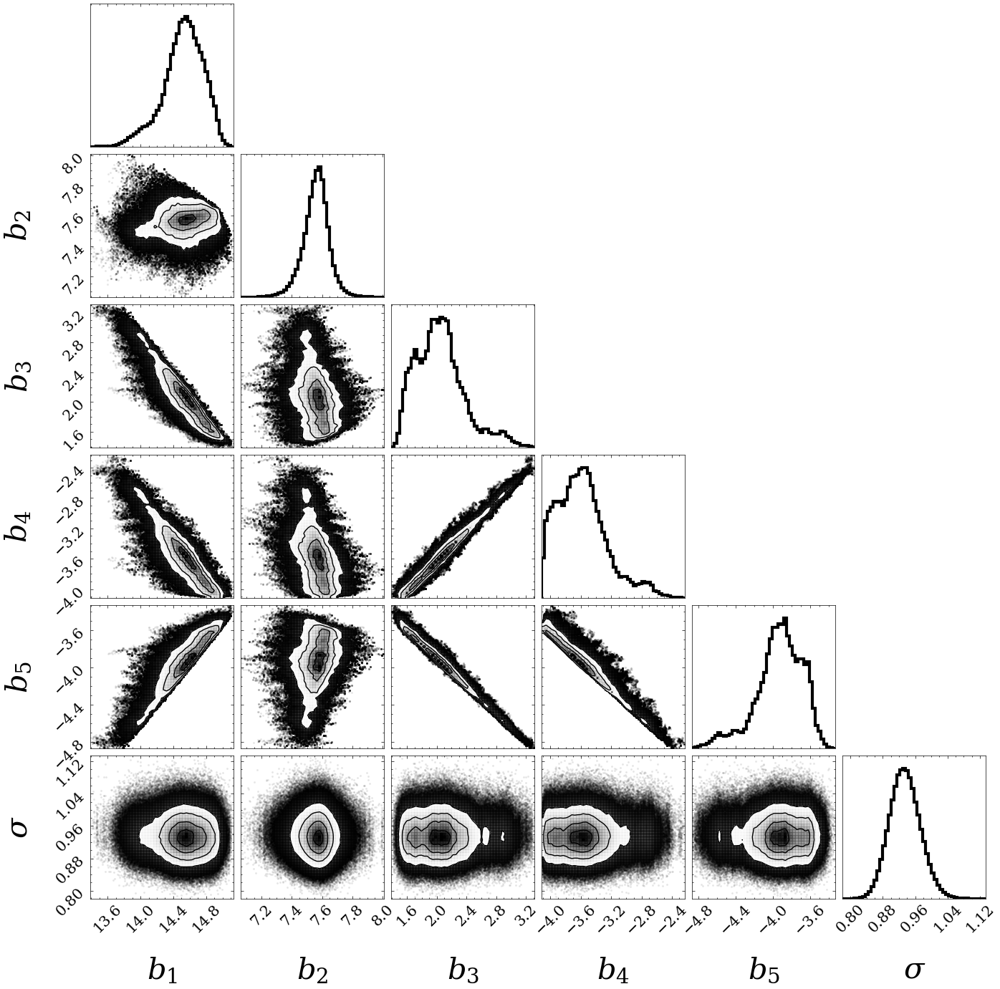

In [483]:
plt.rc("xtick", labelsize=15)
plt.rc("ytick", labelsize=15)

figure = corner.corner(samples_simplex_global,bins=50, dpi=300, hist_kwargs={"linewidth": 3},
                       labels=label_global, 
                    #    truths=np.append(beta,np.sqrt(sigma_squared)),
                    #    truth_color="r",
                       label_kwargs={"fontsize": 30},labelpad=0.1)
plt.show()

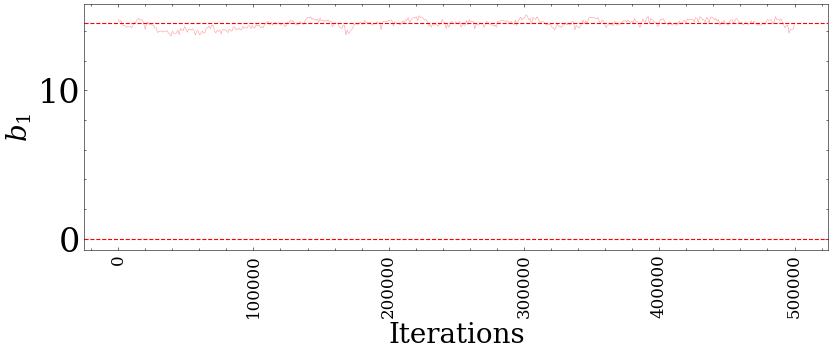

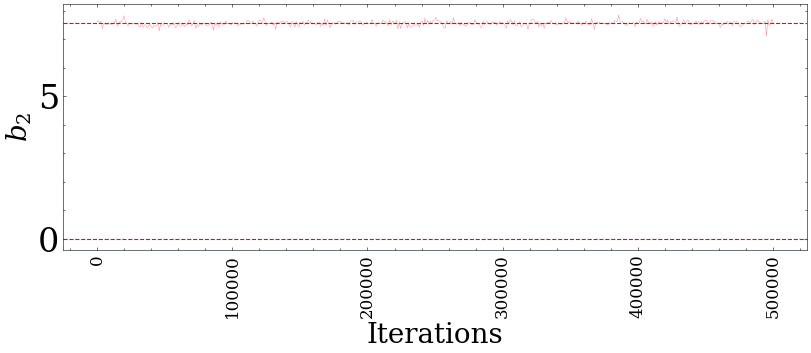

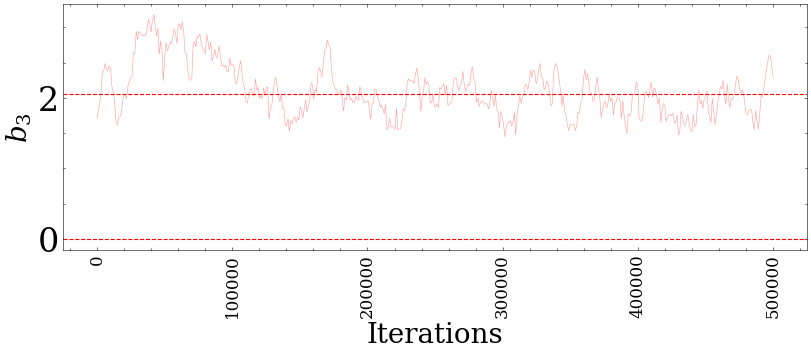

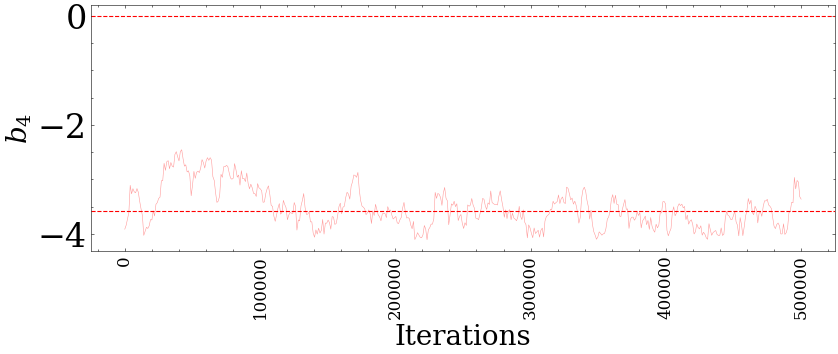

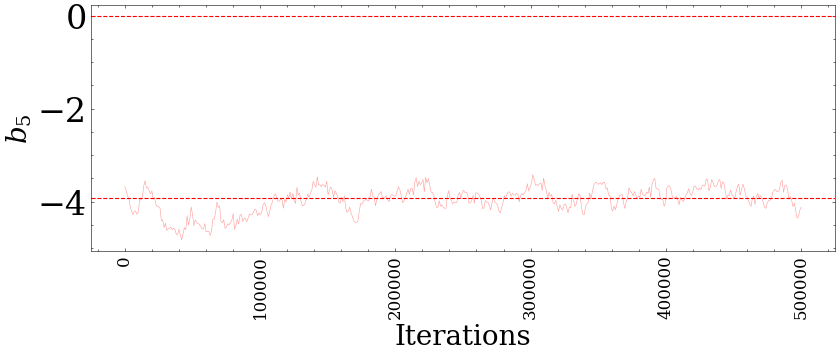

In [484]:
for i in range(components_kept):
    first_param = []
    for j in range(500):
        first_param.append(samples_simplex_global.T[i][j*1000])
    len(first_param)
    x = np.linspace(0,500001, 500)
    
    plt.rc('xtick', labelsize = 15)
    plt.rc('ytick', labelsize = 30)
    
    fig,ax = plt.subplots(figsize = (12,4), dpi = 80)
    ax.plot(x, first_param, linewidth = 0.5, color = 'r', alpha = 0.4)
    
    plt.xlabel('Iterations', fontsize = 25)
    # plt.ylabel(f'$c_1^0$', fontsize = 25)
    plt.xticks(rotation = 90)
    plt.axhline(y = np.mean(samples_simplex_global.T[i]), color = 'r', linestyle = 'dashed')
    plt.axhline(y = 0, color = 'r', linestyle = 'dashed')
    plt.ylabel(label_global[i], fontsize = 25)
    # plt.ylim(-1,1)
    plt.show()

In [485]:
np.random.seed(142857)
# We will now try to see our predictions from the parameters obtained from the gibbs_sampling function

rng = np.random.default_rng()
# We now have a list that contains all the parameters sampled from our gibbs function. Let's try extract 100000 data points from that and
# calculate the predictions of our models based on these parameters
    
samples_random_simplex_global = rng.choice(samples_simplex_global, 200000, replace = False)

In [486]:
params_random_full_simplex_global = np.array([  np.insert(samples_random_simplex_global[i][:-1], 0, 1)  for i in range(len(samples_random_simplex_global))  ])

yvals_random_simplex_global = params_random_full_simplex_global.dot(X_full_filtered_global)

In [487]:
rndm_m_simplex_global = np.array([yvals_random_simplex_global[i] + np.random.multivariate_normal( np.full(len(yvals_random_simplex_global[i]), 0),\
                        np.diag(np.full(len(yvals_random_simplex_global[i]), samples_random_simplex_global[i][-1]**2)) ) \
                        for i in range(len(yvals_random_simplex_global)) ])

In [488]:
lower_simplex_global = np.percentile(rndm_m_simplex_global, 2.5, axis = 0)
median_simplex_global = np.percentile(rndm_m_simplex_global, 50, axis = 0)
upper_simplex_global = np.percentile(rndm_m_simplex_global, 97.5, axis = 0)

In [489]:
S[:15]

array([1.15088463e+02, 7.06105464e+01, 3.49465867e+01, 3.08576152e+01,
       2.43479098e+01, 2.02889104e+01, 1.75444350e+01, 1.03669358e+01,
       9.05002605e+00, 7.98073598e+00, 6.20909530e+00, 4.83721023e+00,
       4.01760123e+00, 2.65659635e+00, 8.60613577e-12])

In [490]:
deviation_list = S[:components_kept].tolist()
deviation_list.extend([2 for i in range(2*components_kept)])

In [491]:
len(deviation_list)

15

In [492]:
Vt_hat_matrix = np.array([Vt[i]/S[i] for i in range(components_kept)])
Vt_hat_triple_matrix = np.vstack([Vt_hat_matrix] * 3 )

In [493]:
stepsize_list = [0.00045 for i in range(components_kept)]
stepsize_list.extend([0.002 for i in range(components_kept)])
stepsize_list.extend([0.002 for i in range(components_kept)])
stepsize_matrix = np.diag(stepsize_list)


In [494]:
def gibbs_sampler_simplex_local(y, X, iterations,prior_info,stepsize_matrix, burn=10000):
    #Make sure that "y" has the correct structure. If data is being centered, it should have the mean already substracted
#     b_mean_prior, b_mean_cov, nu0, sigma20  =  prior_info
    
    nu0, sigma20, Vt_hat_triple_matrix,deviation_list  =  prior_info   #Since our prior is only in \sigma, we are letting the \betas be free beyond the simplex
    
    #From A_First_Course_in_Bayesian_Statistical_Methods (page ~ 159), nu0 represent the effective prior samples and sigma2_0 represents the expected prior variance
    
    cov_matrix_step=np.diag((np.array(deviation_list).dot(stepsize_matrix))**2)
    
    n = len(y)
    
    #Initializing the starting point at the average of all the models
    b_current = np.full(len(X.T),0)

    
    
    supermodel_current=X.dot(b_current)
    

    residuals_current = y - supermodel_current 

    
  
    log_likelihood_current= -np.sum(residuals_current**2)
    
    
    sigma2 = -log_likelihood_current/ len(residuals_current) 

    
    
    samples = []
    acceptance=0
    
    for i in range(burn):
        # Sample from the conditional posterior of bs given sigma2 and data       
        b_proposed =  np.random.multivariate_normal(b_current, cov_matrix_step)
        
        omegas_proposed=np.dot(b_proposed, Vt_hat_triple_matrix) + bias0

        
            #Comment this line and uncomment the next if you want to check MCMC without the simplex  
        if  np.any(omegas_proposed < 0):
            pass
        
#         if 1>2:
#             pass
        
        else:
            
            supermodel_proposed=X.dot(b_proposed)
    
            residuals_proposed = y - supermodel_proposed 

            log_likelihood_proposed= -np.sum(residuals_proposed**2)
            
#           Calculate the acceptance probability
            acceptance_prob = min(1, np.exp(   (+log_likelihood_proposed - log_likelihood_current)/sigma2   ))

            # Accept or reject the proposal
            if np.random.uniform() < acceptance_prob:
                b_current = np.copy(b_proposed)
                log_likelihood_current=log_likelihood_proposed

        shape_post = (nu0 + n)/2.
        
        
#         scale_post = (nu0*sigma20 - log_likelihood_current/len(residuals_current))/2.0
        
        scale_post = (nu0*sigma20 - log_likelihood_current)/2.0

        sigma2 = 1 / np.random.default_rng().gamma(shape_post, 1/scale_post)
        
        
#         samples.append(np.append(b_current,np.sqrt(sigma2)))
        
        
  

    for i in range(iterations):
        # Sample from the conditional posterior of bs given sigma2 and data       
        b_proposed =  np.random.multivariate_normal(b_current, cov_matrix_step)
        
        omegas_proposed=np.dot(b_proposed,Vt_hat_triple_matrix) + bias0

    #Comment this line and uncomment the next if you want to check MCMC without the simplex    
        if  np.any(omegas_proposed < 0):
            pass
        
#         if 1>2:
#             pass
        else:
            supermodel_proposed=X.dot(b_proposed)
    
            residuals_proposed = y - supermodel_proposed 

            log_likelihood_proposed= -np.sum(residuals_proposed**2)
            
#           Calculate the acceptance probability
            acceptance_prob = min(1, np.exp(   (+log_likelihood_proposed - log_likelihood_current)/sigma2   ))

            # Accept or reject the proposal
            if np.random.uniform() < acceptance_prob:
                b_current = np.copy(b_proposed)
                log_likelihood_current=log_likelihood_proposed
                acceptance=acceptance+1

        shape_post = (nu0 + n)/2.
        
        scale_post = (nu0*sigma20 - log_likelihood_current)/2.0

        sigma2 = 1 / np.random.default_rng().gamma(shape_post, 1/scale_post)
        
        
        samples.append(np.append(b_current,np.sqrt(sigma2)))        
        
        
        
        
        
        
    

    print("percentage accepted:", round(acceptance/iterations*100))
    return np.array(samples)

In [495]:
nu0_chosen = 10
sigma20_chosen = 0.5

In [496]:
%%time
samples_simplex_local=gibbs_sampler_simplex_local(y, X_train_centered_local, 500000,[nu0_chosen, sigma20_chosen,Vt_hat_triple_matrix, deviation_list],stepsize_matrix,burn=300000)

percentage accepted: 24
CPU times: total: 2min 50s
Wall time: 3min 41s


In [497]:
samples_simplex_local.shape

(500000, 16)

In [498]:
labels_MCMC_local=[f'$c_{i}^{j}$' for j in range(0, 3)  for i in range(1, components_kept + 1)]
labels_MCMC_local.append(f'$\sigma$')

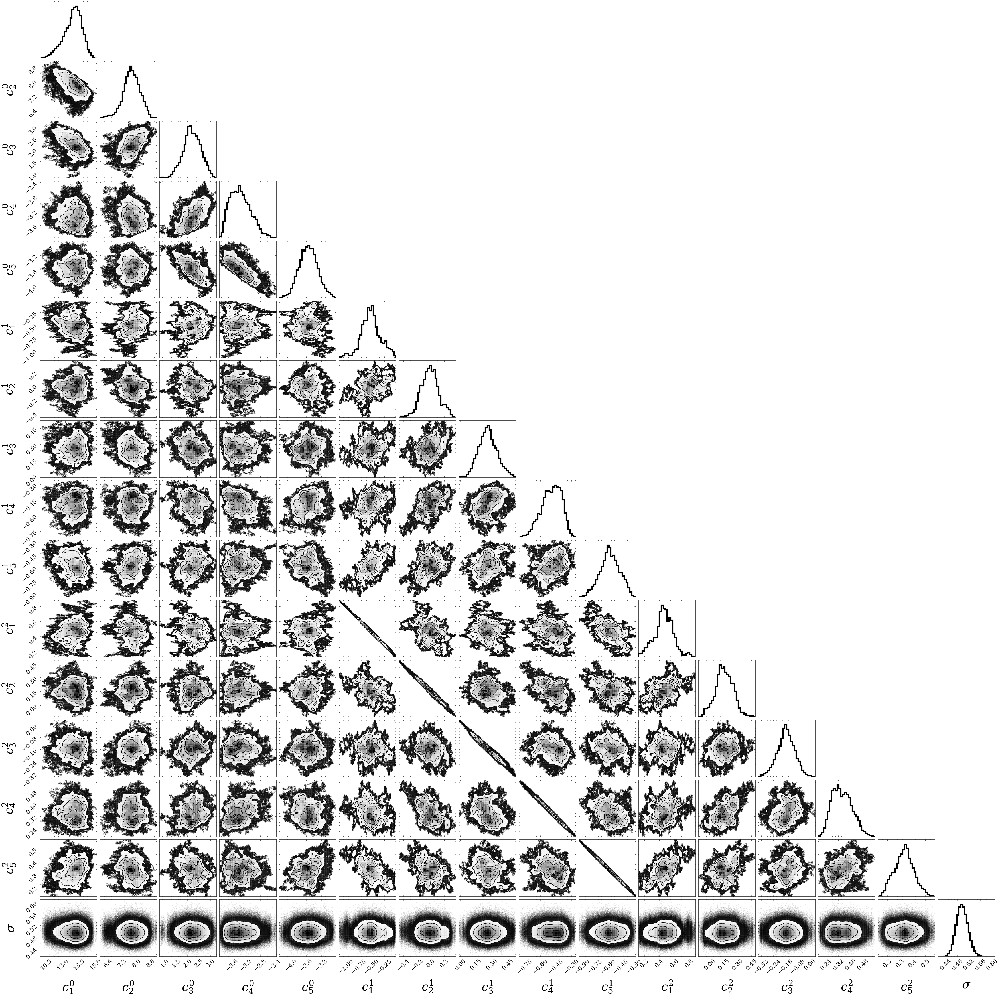

In [499]:
plt.rc("xtick", labelsize=15)
plt.rc("ytick", labelsize=15)

figure = corner.corner(samples_simplex_local,bins=30, dpi=300, hist_kwargs={"linewidth": 3},
                       labels=labels_MCMC_local, 
                    #    truths=np.append(beta,np.sqrt(sigma_squared)),
                    #    truth_color="r",
                       label_kwargs={"fontsize": 30},labelpad=0.1)



# ndim=len(res_gibbs_local[0])

# # Access the axes
# axes = np.array(figure.axes).reshape((ndim, ndim))

# ax=axes[2,0]           
# ax.locator_params(nbins=3, axis='x')            
            
plt.show()


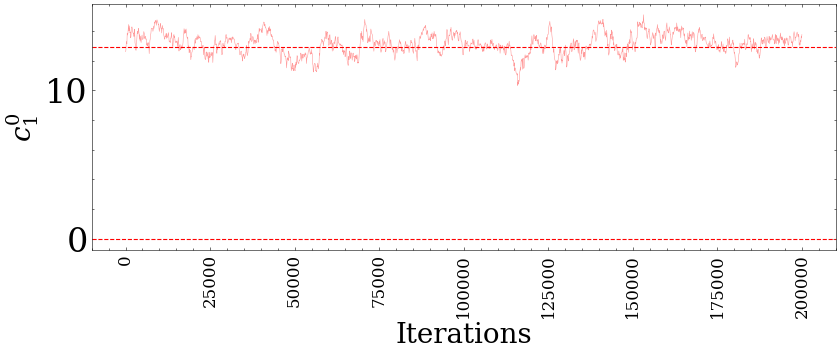

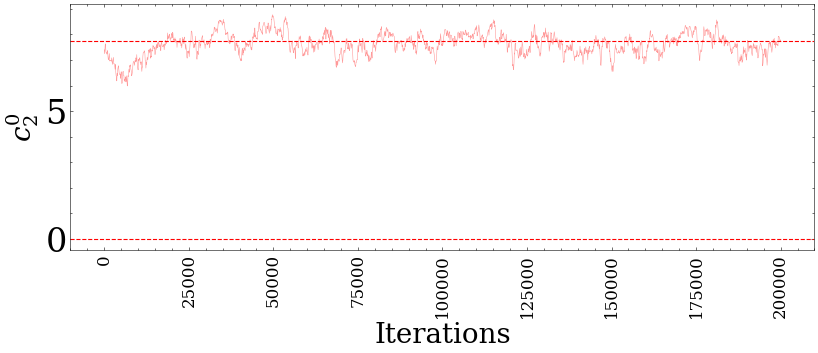

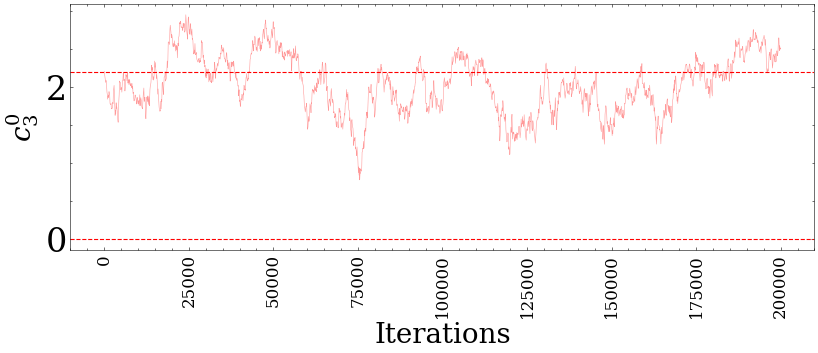

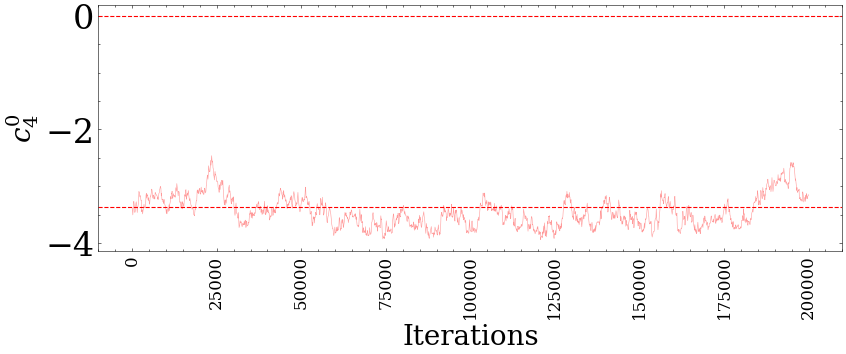

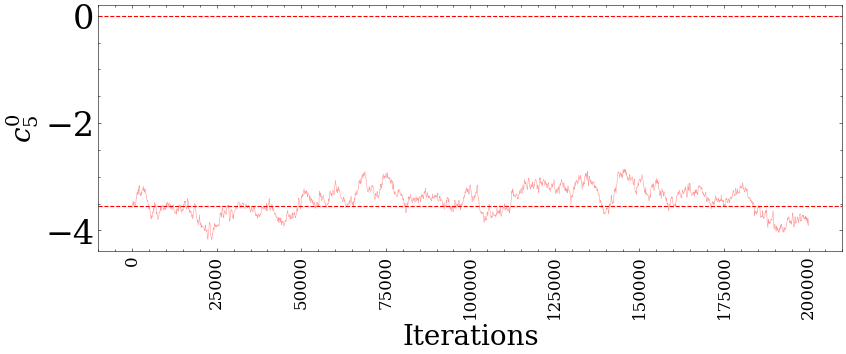

...

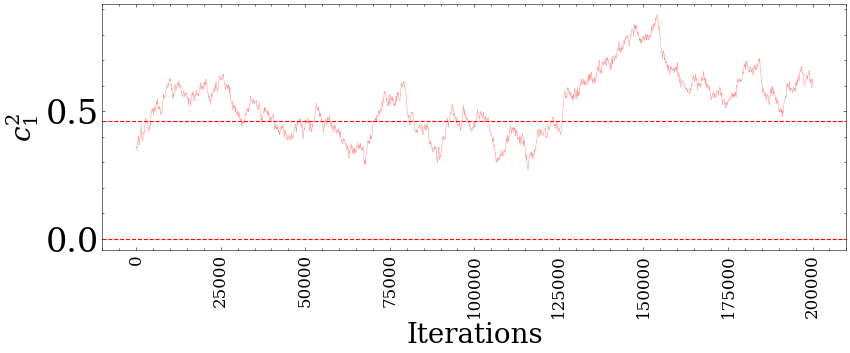

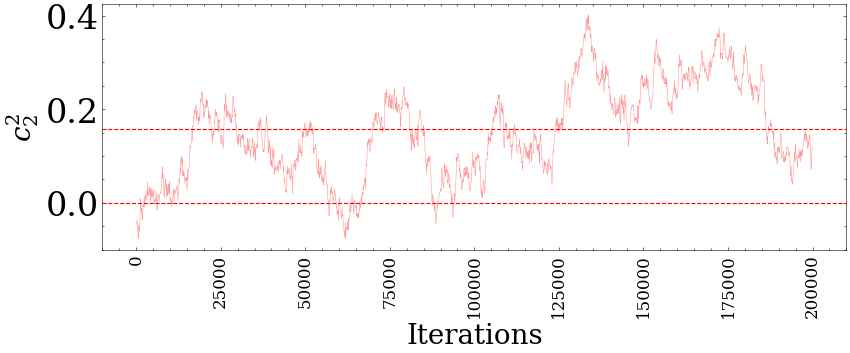

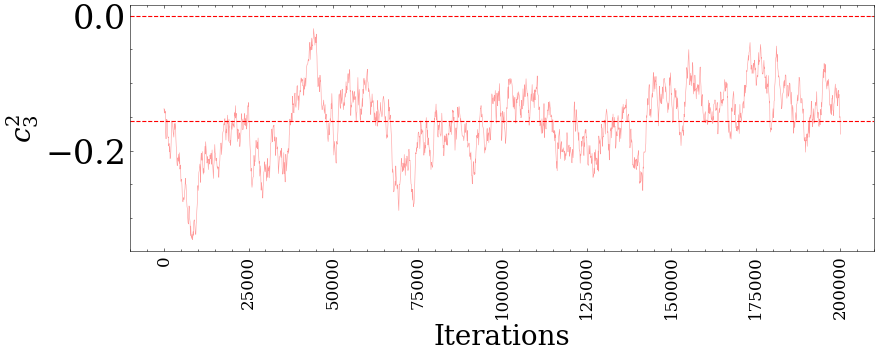

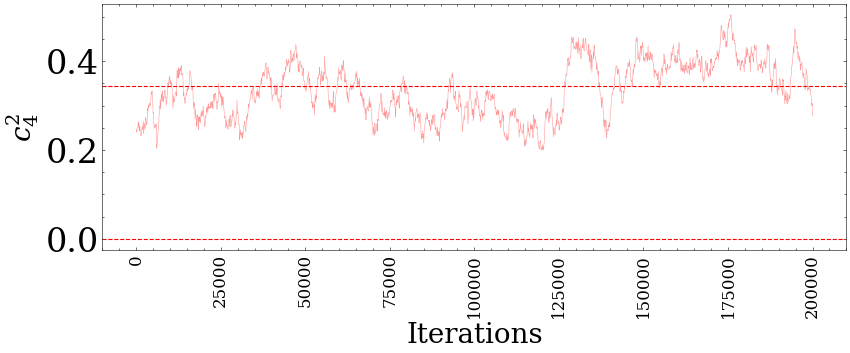

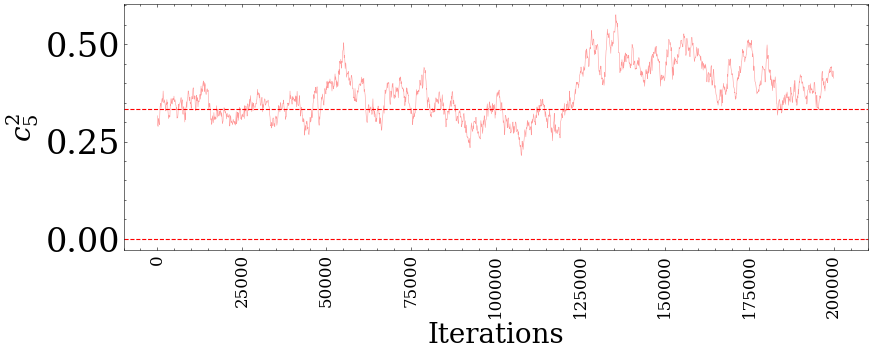

In [500]:
for i in range(3*components_kept):
    first_param = []
    for j in range(2000):
        first_param.append(samples_simplex_local.T[i][j*100])
    len(first_param)
    x = np.linspace(0,200001, 2000)
    
    plt.rc('xtick', labelsize = 15)
    plt.rc('ytick', labelsize = 30)
    
    fig,ax = plt.subplots(figsize = (12,4), dpi = 80)
    ax.plot(x, first_param, linewidth = 0.5, color = 'r', alpha = 0.4)
    
    plt.xlabel('Iterations', fontsize = 25)
    # plt.ylabel(f'$c_1^0$', fontsize = 25)
    plt.xticks(rotation = 90)
    plt.axhline(y = np.mean(samples_simplex_local.T[i]), color = 'r', linestyle = 'dashed')
    plt.axhline(y = 0, color = 'r', linestyle = 'dashed')
    plt.ylabel(labels_MCMC_local[i], fontsize = 25)
    # plt.ylim(-1,1)
    plt.show()

In [142]:
# This shows that our parameters are changing too abrubtly

In [501]:
np.random.seed(142857)
# We will now try to see our predictions from the parameters obtained from the gibbs_sampling function

rng = np.random.default_rng()
# We now have a list that contains all the parameters sampled from our gibbs function. Let's try extract 100000 data points from that and
# calculate the predictions of our models based on these parameters
    
samples_random_simplex_local = rng.choice(samples_simplex_local, 200000, replace = False)

In [502]:
samples_simplex_local[:,-1]

array([0.52897581, 0.51429577, 0.51259429, ..., 0.45045638, 0.50561745,
       0.46981183])

In [503]:
samples_simplex_global[:,-1]

array([0.9596068 , 0.90783735, 0.92983612, ..., 0.9255715 , 0.95670513,
       0.9379162 ])

In [504]:
params_random_full_simplex_local = np.array([  np.insert(samples_random_simplex_local[i][:-1], 0, 1)  for i in range(len(samples_random_simplex_local))  ])

yvals_random_simplex_local = params_random_full_simplex_local.dot(X_full_filtered_local)

In [505]:
filtered_models_output

,N,Z,A,ME2,MEdelta,PC1,NL3S,SKMS,SKP,SLY4,SV,UNEDF0,UNEDF1,UNEDF2,FRDM12,HFB24,BCPM,D1M,truth
240,50,50,100,825.941,822.052,826.926,828.530,826.288242,822.691386,828.611583,824.726244,826.912170,828.830587,829.853181,825.52,824.885137,823.496576,822.968432,825.162600
241,52,50,102,848.659,846.196,849.814,851.207,849.364428,847.781508,851.605589,848.943443,851.417385,852.516320,853.344606,850.23,849.067773,846.791661,845.646524,849.091993
242,54,50,104,870.666,869.126,871.759,873.135,871.383529,871.023119,873.167295,871.236657,874.244098,874.546832,875.381538,872.84,872.200409,869.065886,867.415059,871.926786
243,56,50,106,891.969,891.217,893.213,894.343,892.190570,892.942648,893.767401,892.399488,895.584326,895.511521,896.210348,894.41,893.713045,890.480655,888.405181,893.796060
244,58,50,108,912.716,912.408,914.077,914.826,911.582569,913.579282,913.499580,912.620544,915.727306,915.682848,915.839110,914.78,914.315681,911.281193,908.688814,914.654948
245,60,50,110,932.674,932.575,934.246,934.568,930.135328,933.197027,932.670884,932.051589,935.014543,934.973849,934.785166,934.59,934.058316,931.323345,928.295250,934.569625
246,62,50,112,952.012,951.805,953.690,953.532,948.361300,952.039737,951.230248,950.784548,953.622055,953.510473,953.085434,953.49,953.000952,950.673809,947.226378,953.525317
247,64,50,114,970.364,970.102,972.308,971.678,966.282253,970.160814,969.054331,968.793607,971.551835,971.249964,970.970799,971.47,971.073588,969.321409,965.470068,971.572649
248,66,50,116,988.071,987.348,990.025,988.990,983.758860,987.617816,986.193294,986.150392,988.821770,988.311787,988.017985,988.60,988.436224,987.002771,983.022213,988.681526
249,68,50,118,1004.653,1003.724,1006.883,1005.503,1000.771672,1004.358485,1002.927549,1002.858717,1005.495934,1004.626641,1004.059960,1004.84,1005.008860,1004.373072,999.910286,1004.951024


In [506]:
rndm_m_simplex_local = np.array([yvals_random_simplex_local[i] + np.random.multivariate_normal( np.full(len(yvals_random_simplex_local[i]), 0),\
                        np.diag(np.full(len(yvals_random_simplex_local[i]), samples_random_simplex_local[i][-1]**2)) ) \
                        for i in range(len(yvals_random_simplex_local)) ])

In [507]:
rndm_m_simplex_local[0]

array([ 825.08941369,  850.44859158,  873.2462881 ,  893.79400448,
        914.84793855,  934.46933906,  953.85962305,  971.89925388,
        988.39421687, 1004.99533717, 1021.34267624, 1036.55608321,
       1051.36819997, 1065.07732639, 1077.87537823, 1091.42854202,
       1103.31575021, 1109.37254454])

In [508]:
lower_simplex_local = np.percentile(rndm_m_simplex_local, 2.5, axis = 0)
median_simplex_local = np.percentile(rndm_m_simplex_local, 50, axis = 0)
upper_simplex_local = np.percentile(rndm_m_simplex_local, 97.5, axis = 0)


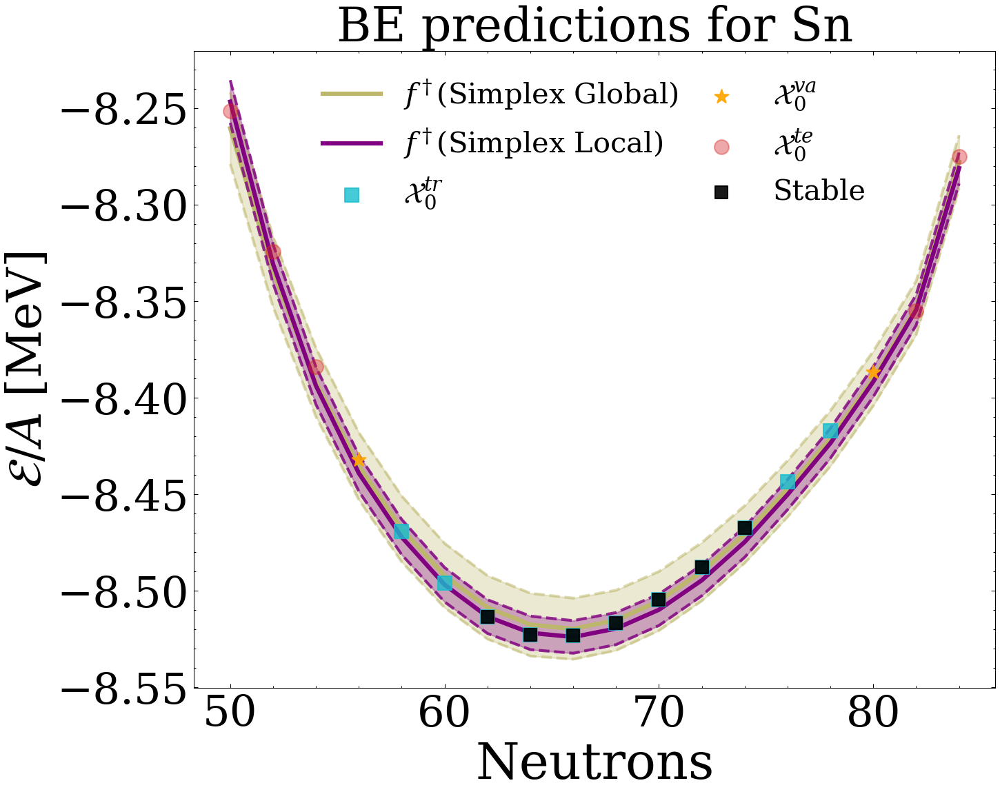

In [509]:
plt.rc("xtick", labelsize=30)
plt.rc("ytick", labelsize=30)

fig, ax = plt.subplots(figsize=(10,8), dpi=150)

plt.plot(filtered_models_output["N"], -median_simplex_global/filtered_models_output['A'], color="darkkhaki", label='$f^\dagger$(Simplex Global)',linewidth=3)

plt.plot(filtered_models_output["N"], -lower_simplex_global/filtered_models_output['A'], color="darkkhaki",linestyle="dashed",linewidth=2,alpha=0.5)
plt.plot(filtered_models_output["N"], -upper_simplex_global/filtered_models_output['A'], color="darkkhaki",linestyle="dashed",linewidth=2,alpha=0.5)

plt.fill_between(filtered_models_output["N"], -lower_simplex_global/filtered_models_output['A'], -upper_simplex_global/filtered_models_output['A'], color="darkkhaki",alpha=0.3)

color_local= "khaki"


plt.plot(filtered_models_output["N"], -median_simplex_local/filtered_models_output['A'], color='purple', label='$f^\dagger$(Simplex Local)',linewidth=3)

# plt.plot(filtered_models_output["N"], lower, color=color_simplex,linestyle="dashed",linewidth=3,alpha=0.8)
# plt.plot(filtered_models_output["N"], upper, color=color_simplex,linestyle="dashed",linewidth=3,alpha=0.8)


plt.plot(filtered_models_output["N"], -lower_simplex_local/filtered_models_output['A'], color="purple",linestyle="dashed",linewidth=2,alpha=0.8)
plt.plot(filtered_models_output["N"], -upper_simplex_local/filtered_models_output['A'], color="purple",linestyle="dashed",linewidth=2,alpha=0.8)

plt.fill_between(filtered_models_output["N"], -lower_simplex_local/filtered_models_output['A'], -upper_simplex_local/filtered_models_output['A'], color='purple',alpha=0.3)

ax.scatter(x = filtered_models_output_train["N"], y = -filtered_models_output_train['truth']/filtered_models_output_train["A"], label = "$\mathcal{X}_0^{tr}$",  alpha = alpha_trainig,color=color_trainig,s=100,marker=marker_trainig,zorder=2)

ax.scatter(x = filtered_models_output_validation["N"], y = -filtered_models_output_validation['truth']/filtered_models_output_validation["A"], label = "$\mathcal{X}_0^{va}$", alpha=alpha_validation ,color=color_validation,s=100,marker=marker_validation,zorder=2)

ax.scatter(x = filtered_models_output_test["N"], y = -filtered_models_output_test['truth']/filtered_models_output_test["A"], label = "$\mathcal{X}_0^{te}$", alpha = alpha_testing,color=color_testing,s=100,marker=marker_testing,zorder=2)

ax.scatter(x = filtered_models_output_stable["N"], y =- filtered_models_output_stable['truth']/filtered_models_output_stable["A"], label = "Stable", alpha = 0.9,color='k',s=80,marker="s",zorder=2)





plt.xlabel("Neutrons",fontsize=35)
plt.ylabel("$ {\cal E}/A$ [MeV]",fontsize=33)
plt.title('BE predictions for Sn', fontsize = 33)
# plt.ylabel(Selected_element_name+ " BE/A MeV",fontsize=25)
 
plt.legend(fontsize=20,markerscale=1,ncol=2,columnspacing=0.5)

# plt.savefig('Plots/Model Forecasts Comparison in Simplex Case for Z = 50.png')
plt.show()


## Let's try to see if there is any difference when we change the nuclei of interest

### Z = 60. Note that we have changed the Z range and filtered_models_output in the cell below

In [510]:
Z_range=(60,60)
N_range=(0,300)


filtered_models_output = models_output[(models_output['Z'] >= Z_range[0]) & (models_output['Z'] <= Z_range[1]) & 
                     (models_output['N'] >= N_range[0]) & (models_output['N'] <= N_range[1])]  

filtered_models_output_train = models_output_train[(models_output_train['Z'] >= Z_range[0]) & (models_output_train['Z'] <= Z_range[1]) & 
                     (models_output_train['N'] >= N_range[0]) & (models_output_train['N'] <= N_range[1])]

filtered_models_output_test = models_output_test[(models_output_test['Z'] >= Z_range[0]) & (models_output_test['Z'] <= Z_range[1]) & 
                     (models_output_test['N'] >= N_range[0]) & (models_output_test['N'] <= N_range[1])]

filtered_models_output_validation = models_output_validation[(models_output_validation['Z'] >= Z_range[0]) & (models_output_validation['Z'] <= Z_range[1]) & 
                     (models_output_validation['N'] >= N_range[0]) & (models_output_validation['N'] <= N_range[1])]


stable_selected_isotope=[]

for i in range(len(stable_coordinates)):
    if stable_coordinates[i][1]==Selected_element:
        stable_selected_isotope.append(stable_coordinates[i])

stable_selected_isotope=np.array(stable_selected_isotope)

# df[df['Column1'].isin(values_array)]

filtered_models_output_stable = models_output_train[(models_output_train['Z'] >= Z_range[0]) & (models_output_train['Z'] <= Z_range[1]) & 
                     (models_output_train['N'].isin(stable_selected_isotope.T[0]))]

In [511]:
X_full_filtered_local_60 = []
for i in range(len(X_full_local.T)):
    X_full_filtered_local_60.append(X_full_local.T[i][filtered_models_output.index])
X_full_filtered_local_60 = np.array(X_full_filtered_local_60)
X_full_filtered_local_60.shape

(16, 16)

In [512]:
yvals_random_simplex_local_60 = params_random_full_simplex_local.dot(X_full_filtered_local_60)

rndm_m_simplex_local_60 = np.array([yvals_random_simplex_local_60[i] + np.random.multivariate_normal( np.full(len(yvals_random_simplex_local_60[i]), 0),\
                        np.diag(np.full(len(yvals_random_simplex_local_60[i]), samples_random_simplex_local[i][-1]**2)) ) \
                        for i in range(len(yvals_random_simplex_local_60)) ])

In [513]:
lower_simplex_local_60 = np.percentile(rndm_m_simplex_local_60, 2.5, axis = 0)
median_simplex_local_60 = np.percentile(rndm_m_simplex_local_60, 50, axis = 0)
upper_simplex_local_60 = np.percentile(rndm_m_simplex_local_60, 97.5, axis = 0)

In [514]:
X_full_filtered_global_60 = []
for i in range(len(X_full)):
    X_full_filtered_global_60.append(X_full[i][filtered_models_output.index])
X_full_filtered_global_60 = np.array(X_full_filtered_global_60)
X_full_filtered_global_60.shape

(6, 16)

In [515]:
yvals_random_simplex_global_60 = params_random_full_simplex_global.dot(X_full_filtered_global_60)

rndm_m_simplex_global_60 = np.array([yvals_random_simplex_global_60[i] + np.random.multivariate_normal( np.full(len(yvals_random_simplex_global_60[i]), 0),\
                        np.diag(np.full(len(yvals_random_simplex_global_60[i]), samples_random_simplex_global[i][-1]**2)) ) \
                        for i in range(len(yvals_random_simplex_global_60)) ])

In [516]:
lower_simplex_global_60 = np.percentile(rndm_m_simplex_global_60, 2.5, axis = 0)
median_simplex_global_60 = np.percentile(rndm_m_simplex_global_60, 50, axis = 0)
upper_simplex_global_60 = np.percentile(rndm_m_simplex_global_60, 97.5, axis = 0)

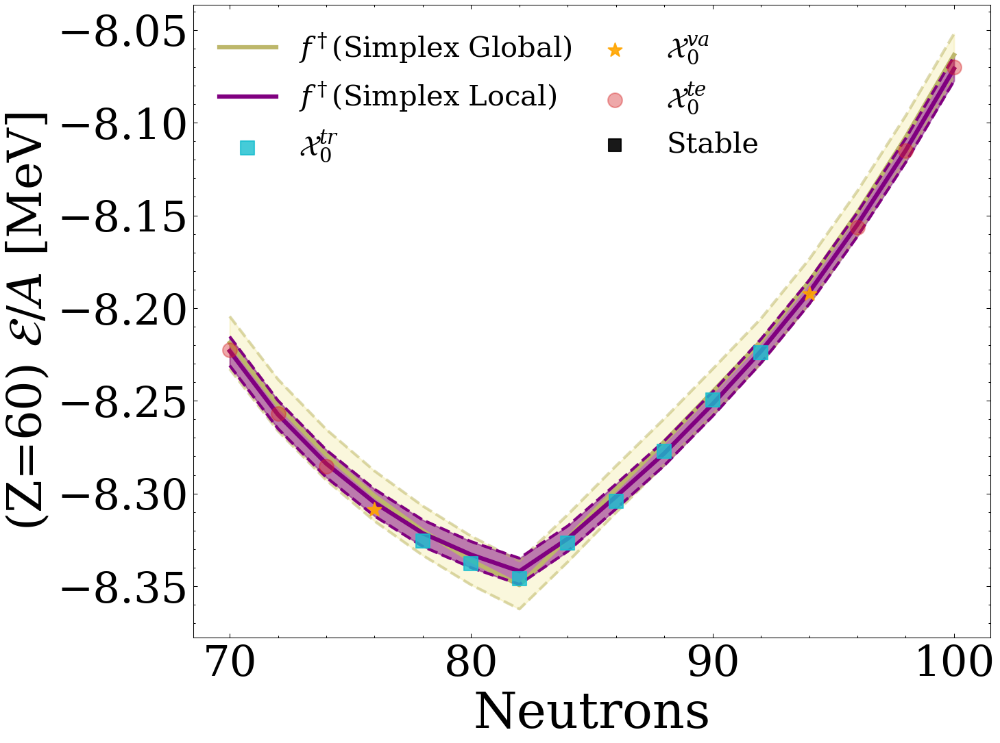

In [517]:
plt.rc("xtick", labelsize=30)
plt.rc("ytick", labelsize=30)

fig, ax = plt.subplots(figsize=(10,8), dpi=150)

plt.plot(filtered_models_output["N"], -median_simplex_global_60/filtered_models_output['A'], color="darkkhaki", label='$f^\dagger$(Simplex Global)',linewidth=3)

plt.plot(filtered_models_output["N"], -lower_simplex_global_60/filtered_models_output['A'], color="darkkhaki",linestyle="dashed",linewidth=2,alpha=0.5)
plt.plot(filtered_models_output["N"], -upper_simplex_global_60/filtered_models_output['A'], color="darkkhaki",linestyle="dashed",linewidth=2,alpha=0.5)

plt.fill_between(filtered_models_output["N"], -lower_simplex_global_60/filtered_models_output['A'], -upper_simplex_global_60/filtered_models_output['A'], color="khaki",alpha=0.3)

color_local= "khaki"


plt.plot(filtered_models_output["N"], -median_simplex_local_60/filtered_models_output['A'], color='purple', label='$f^\dagger$(Simplex Local)',linewidth=3)

# plt.plot(filtered_models_output["N"], lower, color=color_simplex,linestyle="dashed",linewidth=3,alpha=0.8)
# plt.plot(filtered_models_output["N"], upper, color=color_simplex,linestyle="dashed",linewidth=3,alpha=0.8)


plt.plot(filtered_models_output["N"], -lower_simplex_local_60/filtered_models_output['A'], color="purple",linestyle="dashed",linewidth=2,alpha=1)
plt.plot(filtered_models_output["N"], -upper_simplex_local_60/filtered_models_output['A'], color="purple",linestyle="dashed",linewidth=2,alpha=1)

plt.fill_between(filtered_models_output["N"], -lower_simplex_local_60/filtered_models_output['A'], -upper_simplex_local_60/filtered_models_output['A'], color='purple',alpha=0.5)

ax.scatter(x = filtered_models_output_train["N"], y = -filtered_models_output_train['truth']/filtered_models_output_train["A"], label = "$\mathcal{X}_0^{tr}$",  alpha = alpha_trainig,color=color_trainig,s=100,marker=marker_trainig,zorder=2)

ax.scatter(x = filtered_models_output_validation["N"], y = -filtered_models_output_validation['truth']/filtered_models_output_validation["A"], label = "$\mathcal{X}_0^{va}$", alpha=alpha_validation ,color=color_validation,s=100,marker=marker_validation,zorder=2)

ax.scatter(x = filtered_models_output_test["N"], y = -filtered_models_output_test['truth']/filtered_models_output_test["A"], label = "$\mathcal{X}_0^{te}$", alpha = alpha_testing,color=color_testing,s=100,marker=marker_testing,zorder=2)

ax.scatter(x = filtered_models_output_stable["N"], y =- filtered_models_output_stable['truth']/filtered_models_output_stable["A"], label = "Stable", alpha = 0.9,color='k',s=80,marker="s",zorder=2)





plt.xlabel("Neutrons",fontsize=35)
plt.ylabel("(Z=60) $ {\cal E}/A$ [MeV]",fontsize=33)
# plt.ylabel(Selected_element_name+ " BE/A MeV",fontsize=25)
 
plt.legend(fontsize=20,markerscale=1,ncol=2,columnspacing=0.5)

# plt.savefig('Plots/Model Forecasts Comparison in Simplex Case for Z = 60.png')
plt.show()


### Z = 80. Note that we have changed the Z range and filtered_models_output in the cell below

In [557]:
Z_range=(80,80)
N_range=(0,300)


filtered_models_output = models_output[(models_output['Z'] >= Z_range[0]) & (models_output['Z'] <= Z_range[1]) & 
                     (models_output['N'] >= N_range[0]) & (models_output['N'] <= N_range[1])]  

filtered_models_output_train = models_output_train[(models_output_train['Z'] >= Z_range[0]) & (models_output_train['Z'] <= Z_range[1]) & 
                     (models_output_train['N'] >= N_range[0]) & (models_output_train['N'] <= N_range[1])]

filtered_models_output_test = models_output_test[(models_output_test['Z'] >= Z_range[0]) & (models_output_test['Z'] <= Z_range[1]) & 
                     (models_output_test['N'] >= N_range[0]) & (models_output_test['N'] <= N_range[1])]

filtered_models_output_validation = models_output_validation[(models_output_validation['Z'] >= Z_range[0]) & (models_output_validation['Z'] <= Z_range[1]) & 
                     (models_output_validation['N'] >= N_range[0]) & (models_output_validation['N'] <= N_range[1])]


stable_selected_isotope=[]

for i in range(len(stable_coordinates)):
    if stable_coordinates[i][1]==Selected_element:
        stable_selected_isotope.append(stable_coordinates[i])

stable_selected_isotope=np.array(stable_selected_isotope)

# df[df['Column1'].isin(values_array)]

filtered_models_output_stable = models_output_train[(models_output_train['Z'] >= Z_range[0]) & (models_output_train['Z'] <= Z_range[1]) & 
                     (models_output_train['N'].isin(stable_selected_isotope.T[0]))]

In [558]:
X_full_filtered_local_80 = []
for i in range(len(X_full_local.T)):
    X_full_filtered_local_80.append(X_full_local.T[i][filtered_models_output.index])
X_full_filtered_local_80 = np.array(X_full_filtered_local_80)
X_full_filtered_local_80.shape

(16, 18)

In [559]:
yvals_random_simplex_local_80 = params_random_full_simplex_local.dot(X_full_filtered_local_80)

rndm_m_simplex_local_80 = np.array([yvals_random_simplex_local_80[i] + np.random.multivariate_normal( np.full(len(yvals_random_simplex_local_80[i]), 0),\
                        np.diag(np.full(len(yvals_random_simplex_local_80[i]), samples_random_simplex_local[i][-1]**2)) ) \
                        for i in range(len(yvals_random_simplex_local_80)) ])

In [560]:
lower_simplex_local_80 = np.percentile(rndm_m_simplex_local_80, 2.5, axis = 0)
median_simplex_local_80 = np.percentile(rndm_m_simplex_local_80, 50, axis = 0)
upper_simplex_local_80 = np.percentile(rndm_m_simplex_local_80, 97.5, axis = 0)

In [561]:
X_full_filtered_global_80 = []
for i in range(len(X_full)):
    X_full_filtered_global_80.append(X_full[i][filtered_models_output.index])
X_full_filtered_global_80 = np.array(X_full_filtered_global_80)
X_full_filtered_global_80.shape

(6, 18)

In [562]:
yvals_random_simplex_global_80 = params_random_full_simplex_global.dot(X_full_filtered_global_80)

rndm_m_simplex_global_80 = np.array([yvals_random_simplex_global_80[i] + np.random.multivariate_normal( np.full(len(yvals_random_simplex_global_80[i]), 0),\
                        np.diag(np.full(len(yvals_random_simplex_global_80[i]), samples_random_simplex_global[i][-1]**2)) ) \
                        for i in range(len(yvals_random_simplex_global_80)) ])

In [563]:
lower_simplex_global_80 = np.percentile(rndm_m_simplex_global_80, 2.5, axis = 0)
median_simplex_global_80 = np.percentile(rndm_m_simplex_global_80, 50, axis = 0)
upper_simplex_global_80 = np.percentile(rndm_m_simplex_global_80, 97.5, axis = 0)

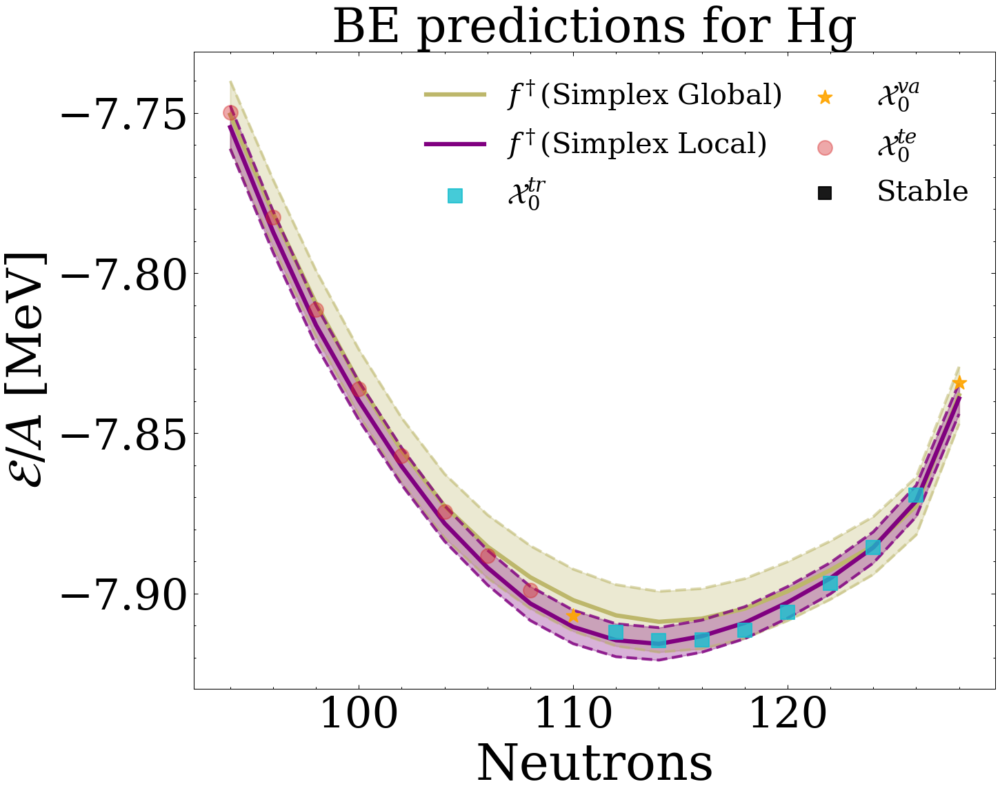

In [564]:
plt.rc("xtick", labelsize=30)
plt.rc("ytick", labelsize=30)

fig, ax = plt.subplots(figsize=(10,8), dpi=150)

plt.plot(filtered_models_output["N"], -median_simplex_global_80/filtered_models_output['A'], color="darkkhaki", label='$f^\dagger$(Simplex Global)',linewidth=3)

plt.plot(filtered_models_output["N"], -lower_simplex_global_80/filtered_models_output['A'], color="darkkhaki",linestyle="dashed",linewidth=2,alpha=0.5)
plt.plot(filtered_models_output["N"], -upper_simplex_global_80/filtered_models_output['A'], color="darkkhaki",linestyle="dashed",linewidth=2,alpha=0.5)

plt.fill_between(filtered_models_output["N"], -lower_simplex_global_80/filtered_models_output['A'], -upper_simplex_global_80/filtered_models_output['A'], color="darkkhaki",alpha=0.3)

color_local= "khaki"


plt.plot(filtered_models_output["N"], -median_simplex_local_80/filtered_models_output['A'], color='purple', label='$f^\dagger$(Simplex Local)',linewidth=3)

# plt.plot(filtered_models_output["N"], lower, color=color_simplex,linestyle="dashed",linewidth=3,alpha=0.8)
# plt.plot(filtered_models_output["N"], upper, color=color_simplex,linestyle="dashed",linewidth=3,alpha=0.8)


plt.plot(filtered_models_output["N"], -lower_simplex_local_80/filtered_models_output['A'], color="purple",linestyle="dashed",linewidth=2,alpha=0.8)
plt.plot(filtered_models_output["N"], -upper_simplex_local_80/filtered_models_output['A'], color="purple",linestyle="dashed",linewidth=2,alpha=0.8)

plt.fill_between(filtered_models_output["N"], -lower_simplex_local_80/filtered_models_output['A'], -upper_simplex_local_80/filtered_models_output['A'], color='purple',alpha=0.3)

ax.scatter(x = filtered_models_output_train["N"], y = -filtered_models_output_train['truth']/filtered_models_output_train["A"], label = "$\mathcal{X}_0^{tr}$",  alpha = alpha_trainig,color=color_trainig,s=100,marker=marker_trainig,zorder=2)

ax.scatter(x = filtered_models_output_validation["N"], y = -filtered_models_output_validation['truth']/filtered_models_output_validation["A"], label = "$\mathcal{X}_0^{va}$", alpha=alpha_validation ,color=color_validation,s=100,marker=marker_validation,zorder=2)

ax.scatter(x = filtered_models_output_test["N"], y = -filtered_models_output_test['truth']/filtered_models_output_test["A"], label = "$\mathcal{X}_0^{te}$", alpha = alpha_testing,color=color_testing,s=100,marker=marker_testing,zorder=2)

ax.scatter(x = filtered_models_output_stable["N"], y =- filtered_models_output_stable['truth']/filtered_models_output_stable["A"], label = "Stable", alpha = 0.9,color='k',s=80,marker="s",zorder=2)





plt.xlabel("Neutrons",fontsize=35)
plt.ylabel("$ {\cal E}/A$ [MeV]",fontsize=33)
# plt.ylabel(Selected_element_name+ " BE/A MeV",fontsize=25)
plt.title('BE predictions for Hg', fontsize = 33)
plt.legend(fontsize=20,markerscale=1,ncol=2,columnspacing=0.5)

plt.savefig('Plots/Model Forecasts Comparison in Simplex Case for Z = 80.png')
plt.show()


### Z = 90. Note that we have changed the Z range and filtered_models_output in the cell below

In [565]:
Z_range=(90,90)
N_range=(0,300)


filtered_models_output = models_output[(models_output['Z'] >= Z_range[0]) & (models_output['Z'] <= Z_range[1]) & 
                     (models_output['N'] >= N_range[0]) & (models_output['N'] <= N_range[1])]  

filtered_models_output_train = models_output_train[(models_output_train['Z'] >= Z_range[0]) & (models_output_train['Z'] <= Z_range[1]) & 
                     (models_output_train['N'] >= N_range[0]) & (models_output_train['N'] <= N_range[1])]

filtered_models_output_test = models_output_test[(models_output_test['Z'] >= Z_range[0]) & (models_output_test['Z'] <= Z_range[1]) & 
                     (models_output_test['N'] >= N_range[0]) & (models_output_test['N'] <= N_range[1])]

filtered_models_output_validation = models_output_validation[(models_output_validation['Z'] >= Z_range[0]) & (models_output_validation['Z'] <= Z_range[1]) & 
                     (models_output_validation['N'] >= N_range[0]) & (models_output_validation['N'] <= N_range[1])]


stable_selected_isotope=[]

for i in range(len(stable_coordinates)):
    if stable_coordinates[i][1]==Selected_element:
        stable_selected_isotope.append(stable_coordinates[i])

stable_selected_isotope=np.array(stable_selected_isotope)

# df[df['Column1'].isin(values_array)]

filtered_models_output_stable = models_output_train[(models_output_train['Z'] >= Z_range[0]) & (models_output_train['Z'] <= Z_range[1]) & 
                     (models_output_train['N'].isin(stable_selected_isotope.T[0]))]

In [566]:
X_full_filtered_local_90 = []
for i in range(len(X_full_local.T)):
    X_full_filtered_local_90.append(X_full_local.T[i][filtered_models_output.index])
X_full_filtered_local_90 = np.array(X_full_filtered_local_90)
X_full_filtered_local_90.shape

(16, 14)

In [567]:
yvals_random_simplex_local_90 = params_random_full_simplex_local.dot(X_full_filtered_local_90)

rndm_m_simplex_local_90 = np.array([yvals_random_simplex_local_90[i] + np.random.multivariate_normal( np.full(len(yvals_random_simplex_local_90[i]), 0),\
                        np.diag(np.full(len(yvals_random_simplex_local_90[i]), samples_random_simplex_local[i][-1]**2)) ) \
                        for i in range(len(yvals_random_simplex_local_90)) ])

In [568]:
lower_simplex_local_90 = np.percentile(rndm_m_simplex_local_90, 2.5, axis = 0)
median_simplex_local_90 = np.percentile(rndm_m_simplex_local_90, 50, axis = 0)
upper_simplex_local_90 = np.percentile(rndm_m_simplex_local_90, 97.5, axis = 0)

In [569]:
X_full_filtered_global_90 = []
for i in range(len(X_full)):
    X_full_filtered_global_90.append(X_full[i][filtered_models_output.index])
X_full_filtered_global_90 = np.array(X_full_filtered_global_90)
X_full_filtered_global_90.shape

(6, 14)

In [570]:
yvals_random_simplex_global_90 = params_random_full_simplex_global.dot(X_full_filtered_global_90)

rndm_m_simplex_global_90 = np.array([yvals_random_simplex_global_90[i] + np.random.multivariate_normal( np.full(len(yvals_random_simplex_global_90[i]), 0),\
                        np.diag(np.full(len(yvals_random_simplex_global_90[i]), samples_random_simplex_global[i][-1]**2)) ) \
                        for i in range(len(yvals_random_simplex_global_90)) ])

In [571]:
lower_simplex_global_90 = np.percentile(rndm_m_simplex_global_90, 2.5, axis = 0)
median_simplex_global_90 = np.percentile(rndm_m_simplex_global_90, 50, axis = 0)
upper_simplex_global_90 = np.percentile(rndm_m_simplex_global_90, 97.5, axis = 0)

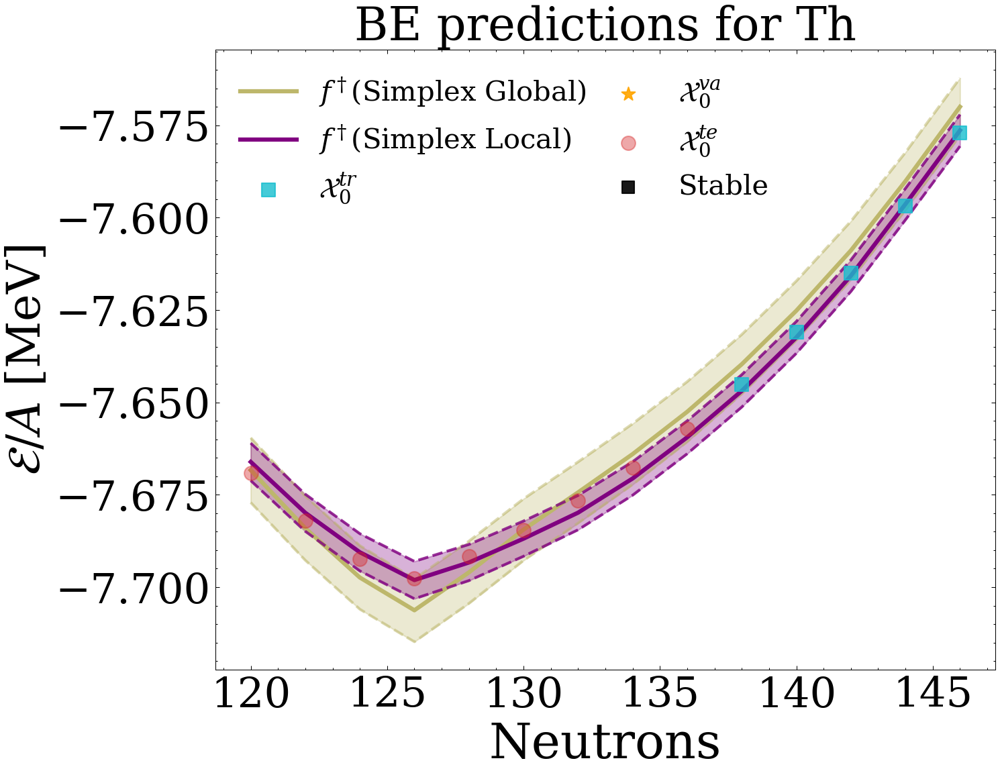

In [572]:
plt.rc("xtick", labelsize=30)
plt.rc("ytick", labelsize=30)

fig, ax = plt.subplots(figsize=(10,8), dpi=150)

plt.plot(filtered_models_output["N"], -median_simplex_global_90/filtered_models_output['A'], color="darkkhaki", label='$f^\dagger$(Simplex Global)',linewidth=3)

plt.plot(filtered_models_output["N"], -lower_simplex_global_90/filtered_models_output['A'], color="darkkhaki",linestyle="dashed",linewidth=2,alpha=0.5)
plt.plot(filtered_models_output["N"], -upper_simplex_global_90/filtered_models_output['A'], color="darkkhaki",linestyle="dashed",linewidth=2,alpha=0.5)

plt.fill_between(filtered_models_output["N"], -lower_simplex_global_90/filtered_models_output['A'], -upper_simplex_global_90/filtered_models_output['A'], color="darkkhaki",alpha=0.3)

color_local= "khaki"


plt.plot(filtered_models_output["N"], -median_simplex_local_90/filtered_models_output['A'], color='purple', label='$f^\dagger$(Simplex Local)',linewidth=3)

# plt.plot(filtered_models_output["N"], lower, color=color_simplex,linestyle="dashed",linewidth=3,alpha=0.8)
# plt.plot(filtered_models_output["N"], upper, color=color_simplex,linestyle="dashed",linewidth=3,alpha=0.8)


plt.plot(filtered_models_output["N"], -lower_simplex_local_90/filtered_models_output['A'], color="purple",linestyle="dashed",linewidth=2,alpha=0.8)
plt.plot(filtered_models_output["N"], -upper_simplex_local_90/filtered_models_output['A'], color="purple",linestyle="dashed",linewidth=2,alpha=0.8)

plt.fill_between(filtered_models_output["N"], -lower_simplex_local_90/filtered_models_output['A'], -upper_simplex_local_90/filtered_models_output['A'], color='purple',alpha=0.3)

ax.scatter(x = filtered_models_output_train["N"], y = -filtered_models_output_train['truth']/filtered_models_output_train["A"], label = "$\mathcal{X}_0^{tr}$",  alpha = alpha_trainig,color=color_trainig,s=100,marker=marker_trainig,zorder=2)

ax.scatter(x = filtered_models_output_validation["N"], y = -filtered_models_output_validation['truth']/filtered_models_output_validation["A"], label = "$\mathcal{X}_0^{va}$", alpha=alpha_validation ,color=color_validation,s=100,marker=marker_validation,zorder=2)

ax.scatter(x = filtered_models_output_test["N"], y = -filtered_models_output_test['truth']/filtered_models_output_test["A"], label = "$\mathcal{X}_0^{te}$", alpha = alpha_testing,color=color_testing,s=100,marker=marker_testing,zorder=2)

ax.scatter(x = filtered_models_output_stable["N"], y =- filtered_models_output_stable['truth']/filtered_models_output_stable["A"], label = "Stable", alpha = 0.9,color='k',s=80,marker="s",zorder=2)





plt.xlabel("Neutrons",fontsize=35)
plt.ylabel("$ {\cal E}/A$ [MeV]",fontsize=33)
plt.title('BE predictions for Th', fontsize = 33)
# plt.ylabel(Selected_element_name+ " BE/A MeV",fontsize=25)
 
plt.legend(fontsize=20,markerscale=1,ncol=2,columnspacing=0.5)

plt.savefig('Plots/Model Forecasts Comparison in Simplex Case for Z = 90.png')
plt.show()


### Z = 30. Note that we have changed the Z range and filtered_models_output in the cell below

In [534]:
Z_range=(30,30)
N_range=(0,300)


filtered_models_output = models_output[(models_output['Z'] >= Z_range[0]) & (models_output['Z'] <= Z_range[1]) & 
                     (models_output['N'] >= N_range[0]) & (models_output['N'] <= N_range[1])]  

filtered_models_output_train = models_output_train[(models_output_train['Z'] >= Z_range[0]) & (models_output_train['Z'] <= Z_range[1]) & 
                     (models_output_train['N'] >= N_range[0]) & (models_output_train['N'] <= N_range[1])]

filtered_models_output_test = models_output_test[(models_output_test['Z'] >= Z_range[0]) & (models_output_test['Z'] <= Z_range[1]) & 
                     (models_output_test['N'] >= N_range[0]) & (models_output_test['N'] <= N_range[1])]

filtered_models_output_validation = models_output_validation[(models_output_validation['Z'] >= Z_range[0]) & (models_output_validation['Z'] <= Z_range[1]) & 
                     (models_output_validation['N'] >= N_range[0]) & (models_output_validation['N'] <= N_range[1])]


stable_selected_isotope=[]

for i in range(len(stable_coordinates)):
    if stable_coordinates[i][1]==Selected_element:
        stable_selected_isotope.append(stable_coordinates[i])

stable_selected_isotope=np.array(stable_selected_isotope)

# df[df['Column1'].isin(values_array)]

filtered_models_output_stable = models_output_train[(models_output_train['Z'] >= Z_range[0]) & (models_output_train['Z'] <= Z_range[1]) & 
                     (models_output_train['N'].isin(stable_selected_isotope.T[0]))]

In [535]:
X_full_filtered_local_30 = []
for i in range(len(X_full_local.T)):
    X_full_filtered_local_30.append(X_full_local.T[i][filtered_models_output.index])
X_full_filtered_local_30 = np.array(X_full_filtered_local_30)
X_full_filtered_local_30.shape

(16, 13)

In [536]:
yvals_random_simplex_local_30 = params_random_full_simplex_local.dot(X_full_filtered_local_30)

rndm_m_simplex_local_30 = np.array([yvals_random_simplex_local_30[i] + np.random.multivariate_normal( np.full(len(yvals_random_simplex_local_30[i]), 0),\
                        np.diag(np.full(len(yvals_random_simplex_local_30[i]), samples_random_simplex_local[i][-1]**2)) ) \
                        for i in range(len(yvals_random_simplex_local_30)) ])

In [537]:
lower_simplex_local_30 = np.percentile(rndm_m_simplex_local_30, 2.5, axis = 0)
median_simplex_local_30 = np.percentile(rndm_m_simplex_local_30, 50, axis = 0)
upper_simplex_local_30 = np.percentile(rndm_m_simplex_local_30, 97.5, axis = 0)

In [538]:
X_full_filtered_global_30 = []
for i in range(len(X_full)):
    X_full_filtered_global_30.append(X_full[i][filtered_models_output.index])
X_full_filtered_global_30 = np.array(X_full_filtered_global_30)
X_full_filtered_global_30.shape

(6, 13)

In [539]:
yvals_random_simplex_global_30 = params_random_full_simplex_global.dot(X_full_filtered_global_30)

rndm_m_simplex_global_30 = np.array([yvals_random_simplex_global_30[i] + np.random.multivariate_normal( np.full(len(yvals_random_simplex_global_30[i]), 0),\
                        np.diag(np.full(len(yvals_random_simplex_global_30[i]), samples_random_simplex_global[i][-1]**2)) ) \
                        for i in range(len(yvals_random_simplex_global_30)) ])

KeyboardInterrupt: 

In [ ]:
lower_simplex_global_30 = np.percentile(rndm_m_simplex_global_30, 2.5, axis = 0)
median_simplex_global_30 = np.percentile(rndm_m_simplex_global_30, 50, axis = 0)
upper_simplex_global_30 = np.percentile(rndm_m_simplex_global_30, 97.5, axis = 0)

In [ ]:
plt.rc("xtick", labelsize=30)
plt.rc("ytick", labelsize=30)

fig, ax = plt.subplots(figsize=(10,8), dpi=150)

plt.plot(filtered_models_output["N"], -median_simplex_global_30/filtered_models_output['A'], color="darkkhaki", label='$f^\dagger$(Simplex Global)',linewidth=3)

plt.plot(filtered_models_output["N"], -lower_simplex_global_30/filtered_models_output['A'], color="darkkhaki",linestyle="dashed",linewidth=2,alpha=0.5)
plt.plot(filtered_models_output["N"], -upper_simplex_global_30/filtered_models_output['A'], color="darkkhaki",linestyle="dashed",linewidth=2,alpha=0.5)

plt.fill_between(filtered_models_output["N"], -lower_simplex_global_30/filtered_models_output['A'], -upper_simplex_global_30/filtered_models_output['A'], color="darkkhaki",alpha=0.3)

color_local= "khaki"


plt.plot(filtered_models_output["N"], -median_simplex_local_30/filtered_models_output['A'], color='purple', label='$f^\dagger$(Simplex Local)',linewidth=3)

# plt.plot(filtered_models_output["N"], lower, color=color_simplex,linestyle="dashed",linewidth=3,alpha=0.8)
# plt.plot(filtered_models_output["N"], upper, color=color_simplex,linestyle="dashed",linewidth=3,alpha=0.8)


plt.plot(filtered_models_output["N"], -lower_simplex_local_30/filtered_models_output['A'], color="purple",linestyle="dashed",linewidth=2,alpha=0.8)
plt.plot(filtered_models_output["N"], -upper_simplex_local_30/filtered_models_output['A'], color="purple",linestyle="dashed",linewidth=2,alpha=0.8)

plt.fill_between(filtered_models_output["N"], -lower_simplex_local_30/filtered_models_output['A'], -upper_simplex_local_30/filtered_models_output['A'], color='purple',alpha=0.3)

ax.scatter(x = filtered_models_output_train["N"], y = -filtered_models_output_train['truth']/filtered_models_output_train["A"], label = "$\mathcal{X}_0^{tr}$",  alpha = alpha_trainig,color=color_trainig,s=100,marker=marker_trainig,zorder=2)

ax.scatter(x = filtered_models_output_validation["N"], y = -filtered_models_output_validation['truth']/filtered_models_output_validation["A"], label = "$\mathcal{X}_0^{va}$", alpha=alpha_validation ,color=color_validation,s=100,marker=marker_validation,zorder=2)

ax.scatter(x = filtered_models_output_test["N"], y = -filtered_models_output_test['truth']/filtered_models_output_test["A"], label = "$\mathcal{X}_0^{te}$", alpha = alpha_testing,color=color_testing,s=100,marker=marker_testing,zorder=2)

ax.scatter(x = filtered_models_output_stable["N"], y =- filtered_models_output_stable['truth']/filtered_models_output_stable["A"], label = "Stable", alpha = 0.9,color='k',s=30,marker="s",zorder=2)





plt.xlabel("Neutrons",fontsize=35)
plt.ylabel("(Z=30) $ {\cal E}/A$ [MeV]",fontsize=33)
# plt.ylabel(Selected_element_name+ " BE/A MeV",fontsize=25)
 
plt.legend(fontsize=20,markerscale=1,ncol=2,columnspacing=0.5)

# plt.savefig('Plots/Model Forecasts Comparison in Simplex Case Z = 30.png')
plt.show()


# Computing coverage intervals and RMSE performance

## Unconstrained model

In [184]:
centering_data = True

In [185]:
%%time
np.random.seed(142857)

total_samples=5000

rndm_full_train_global = []
rndm_full_val_global = []
rndm_full_test_global = []


rndm_full_train_noiseless_global = []
rndm_full_val_noiseless_global = []
rndm_full_test_noiseless_global = []

theta_rand_selected_global=rng.choice(samples_global, min(100000,total_samples), replace=False)


for i in tqdm(range(len(theta_rand_selected_global))):

    if centering_data:
        yvals_rand_train_global= X_train.T.dot(np.insert(theta_rand_selected_global[i][0:-1], 0, 1))
        yvals_rand_val_global= X_validation.T.dot(np.insert(theta_rand_selected_global[i][0:-1], 0, 1))
        yvals_rand_test_global= X_testing.T.dot(np.insert(theta_rand_selected_global[i][0:-1], 0, 1))
    else:
        yvals_rand_train_global= X_train.T.dot(theta_rand_selected_global[i][0:-1])
        yvals_rand_val_global= X_validation.T.dot(theta_rand_selected_global[i][0:-1])
        yvals_rand_test_global= X_testing.T.dot(theta_rand_selected_global[i][0:-1])

        
        
    #Noiseless round (for calculating RMSE)
    rndm_full_train_noiseless_global.append(yvals_rand_train_global) 

    rndm_full_val_noiseless_global.append(yvals_rand_val_global) 
    rndm_full_test_noiseless_global.append(yvals_rand_test_global)           
        

        
        
        
        
        
    #Noise round       
    rndm_full_train_global.append(yvals_rand_train_global +
                   np.random.multivariate_normal(np.full(
                       len(yvals_rand_train_global)
                       ,0), np.diag(1.0 * np.full(len(yvals_rand_train_global),1.0 * theta_rand_selected_global[i][-1]**2 ) ))) 

    rndm_full_val_global.append(yvals_rand_val_global +
                np.random.multivariate_normal(np.full(
                    len(yvals_rand_val_global)
                    ,0), np.diag(1.0 * np.full(len(yvals_rand_val_global),1.0 * theta_rand_selected_global[i][-1]**2 ) ))) 
    rndm_full_test_global.append(yvals_rand_test_global +
                np.random.multivariate_normal(np.full(
                    len(yvals_rand_test_global)
                    ,0), np.diag(1.0 * np.full(len(yvals_rand_test_global),1.0 * theta_rand_selected_global[i][-1]**2 ) )))   


rndm_full_train_noiseless_global=np.array(rndm_full_train_noiseless_global)
rndm_full_val_noiseless_global=np.array(rndm_full_val_noiseless_global)
rndm_full_test_noiseless_global=np.array(rndm_full_test_noiseless_global)    
    
    
rndm_full_train_global=np.array(rndm_full_train_global)
rndm_full_val_global=np.array(rndm_full_val_global)
rndm_full_test_global=np.array(rndm_full_test_global)


100%|██████████| 5000/5000 [02:16<00:00, 36.68it/s]


CPU times: total: 13min 1s
Wall time: 2min 16s


In [186]:
rndm_full_train_global.shape

(5000, 300)

In [187]:
super_model_residuals_train_gibbs_global=np.mean(rndm_full_train_noiseless_global,axis=0)  -  models_output_train['truth'].tolist()
super_model_residuals_validation_gibbs_global= np.mean(rndm_full_val_noiseless_global,axis=0)-models_output_validation['truth'].tolist()
super_model_residuals_test_gibbs_global = np.mean(rndm_full_test_noiseless_global,axis=0)-models_output_test['truth'].tolist()

sigma_train_gibbs_global=np.sqrt(np.sum(super_model_residuals_train_gibbs_global**2) / len(super_model_residuals_train_gibbs_global) )
sigma_validation_gibbs_global=np.sqrt(np.sum(super_model_residuals_validation_gibbs_global**2) / len(super_model_residuals_validation_gibbs_global) )
sigma_test_gibbs_global=np.sqrt(np.sum(super_model_residuals_test_gibbs_global**2) / len(super_model_residuals_test_gibbs_global) )


sigma_all_gibbs_global=np.sqrt((sigma_train_gibbs_global**2*len(super_model_residuals_train_gibbs_global)+
        sigma_validation_gibbs_global**2*len(super_model_residuals_validation_gibbs_global)+
        sigma_test_gibbs_global**2*len(super_model_residuals_test_gibbs_global))/(len(super_model_residuals_train_gibbs_global)+
                                                                   len(super_model_residuals_validation_gibbs_global)+
                                                                   len(super_model_residuals_test_gibbs_global)))


In [188]:
sigma_train_gibbs_global,sigma_validation_gibbs_global,sigma_test_gibbs_global,sigma_all_gibbs_global

(0.3778116147722059,
 0.45869874360452767,
 0.4750221284863202,
 0.4294002192019082)

In [189]:
# %%time
np.random.seed(142857)

total_samples=5000

rndm_full_train_local = []
rndm_full_val_local = []
rndm_full_test_local = []


rndm_full_train_noiseless_local = []
rndm_full_val_noiseless_local = []
rndm_full_test_noiseless_local = []

theta_rand_selected_local=rng.choice(samples_local, min((total_samples),100000), replace=False)


for i in tqdm(range(len(theta_rand_selected_local))):

    if centering_data:
        yvals_rand_train_local= X_train_local.dot(np.insert(theta_rand_selected_local[i][0:-1], 0, 1))
        yvals_rand_val_local= X_validation_local.dot(np.insert(theta_rand_selected_local[i][0:-1], 0, 1))
        yvals_rand_test_local= X_test_local.dot(np.insert(theta_rand_selected_local[i][0:-1], 0, 1))
    else:
        yvals_rand_train_local= X_train_local.dot(theta_rand_selected_local[i][0:-1])
        yvals_rand_val_local= X_validation_local.dot(theta_rand_selected_local[i][0:-1])
        yvals_rand_test_local= X_test_local.dot(theta_rand_selected_local[i][0:-1])

        
        
    #Noiseless round (for calculating RMSE)
    rndm_full_train_noiseless_local.append(yvals_rand_train_local) 

    rndm_full_val_noiseless_local.append(yvals_rand_val_local) 
    rndm_full_test_noiseless_local.append(yvals_rand_test_local)           
        

        
        
        
        
        
    #Noise round       
    rndm_full_train_local.append(yvals_rand_train_local +
                   np.random.multivariate_normal(np.full(
                       len(yvals_rand_train_local)
                       ,0), np.diag(1.0 * np.full(len(yvals_rand_train_local),1.0 * theta_rand_selected_local[i][-1]**2 ) ))) 

    rndm_full_val_local.append(yvals_rand_val_local +
                np.random.multivariate_normal(np.full(
                    len(yvals_rand_val_local)
                    ,0), np.diag(1.0 * np.full(len(yvals_rand_val_local),1.0 * theta_rand_selected_local[i][-1]**2 ) ))) 
    rndm_full_test_local.append(yvals_rand_test_local +
                np.random.multivariate_normal(np.full(
                    len(yvals_rand_test_local)
                    ,0), np.diag(1.0 * np.full(len(yvals_rand_test_local),1.0 * theta_rand_selected_local[i][-1]**2 ) )))   


rndm_full_train_noiseless_local=np.array(rndm_full_train_noiseless_local)
rndm_full_val_noiseless_local=np.array(rndm_full_val_noiseless_local)
rndm_full_test_noiseless_local=np.array(rndm_full_test_noiseless_local)    
    
    
rndm_full_train_local=np.array(rndm_full_train_local)
rndm_full_val_local=np.array(rndm_full_val_local)
rndm_full_test_local=np.array(rndm_full_test_local)



    

100%|██████████| 5000/5000 [02:10<00:00, 38.19it/s]


In [190]:
len(rndm_full_train_local.T[0])

5000

In [191]:
super_model_residuals_train_gibbs_local=np.mean(rndm_full_train_noiseless_local,axis=0)  -  models_output_train['truth'].tolist()
super_model_residuals_validation_gibbs_local= np.mean(rndm_full_val_noiseless_local,axis=0)-models_output_validation['truth'].tolist()
super_model_residuals_test_gibbs_local = np.mean(rndm_full_test_noiseless_local,axis=0)-models_output_test['truth'].tolist()

sigma_train_gibbs_local=np.sqrt(np.sum(super_model_residuals_train_gibbs_local**2) / len(super_model_residuals_train_gibbs_local) )
sigma_validation_gibbs_local=np.sqrt(np.sum(super_model_residuals_validation_gibbs_local**2) / len(super_model_residuals_validation_gibbs_local) )
sigma_test_gibbs_local=np.sqrt(np.sum(super_model_residuals_test_gibbs_local**2) / len(super_model_residuals_test_gibbs_local) )


sigma_all_gibbs_local=np.sqrt((sigma_train_gibbs_local**2*len(super_model_residuals_train_gibbs_local)+
        sigma_validation_gibbs_local**2*len(super_model_residuals_validation_gibbs_local)+
        sigma_test_gibbs_local**2*len(super_model_residuals_test_gibbs_local))/(len(super_model_residuals_train_gibbs_local)+
                                                                   len(super_model_residuals_validation_gibbs_local)+
                                                                   len(super_model_residuals_test_gibbs_local)))

In [192]:
sigma_train_gibbs_local,sigma_validation_gibbs_local,sigma_test_gibbs_local,sigma_all_gibbs_local

(0.34290174670922663,
 0.5294287709450406,
 0.48330637528588083,
 0.4284039933126068)

## Simplex Model

In [193]:
%%time
np.random.seed(142857)

total_samples=5000

rndm_full_train_simplex_global = []
rndm_full_val_simplex_global = []
rndm_full_test_simplex_global = []


rndm_full_train_noiseless_simplex_global = []
rndm_full_val_noiseless_simplex_global = []
rndm_full_test_noiseless_simplex_global = []

theta_rand_selected_simplex_global=rng.choice(samples_simplex_global, min(100000,total_samples), replace=False)


for i in tqdm(range(len(theta_rand_selected_simplex_global))):

    if centering_data:
        yvals_rand_train_simplex_global= X_train.T.dot(np.insert(theta_rand_selected_simplex_global[i][0:-1], 0, 1))
        yvals_rand_val_simplex_global= X_validation.T.dot(np.insert(theta_rand_selected_simplex_global[i][0:-1], 0, 1))
        yvals_rand_test_simplex_global= X_testing.T.dot(np.insert(theta_rand_selected_simplex_global[i][0:-1], 0, 1))
    else:
        yvals_rand_train_simplex_global= X_train.T.dot(theta_rand_selected_simplex_global[i][0:-1])
        yvals_rand_val_simplex_global= X_validation.T.dot(theta_rand_selected_simplex_global[i][0:-1])
        yvals_rand_test_simplex_global= X_testing.T.dot(theta_rand_selected_simplex_global[i][0:-1])

        
        
    #Noiseless round (for calculating RMSE)
    rndm_full_train_noiseless_simplex_global.append(yvals_rand_train_simplex_global) 

    rndm_full_val_noiseless_simplex_global.append(yvals_rand_val_simplex_global) 
    rndm_full_test_noiseless_simplex_global.append(yvals_rand_test_simplex_global)           
        

        
        
        
        
        
    #Noise round       
    rndm_full_train_simplex_global.append(yvals_rand_train_simplex_global +
                   np.random.multivariate_normal(np.full(
                       len(yvals_rand_train_simplex_global)
                       ,0), np.diag(1.0 * np.full(len(yvals_rand_train_simplex_global),1.0 * theta_rand_selected_simplex_global[i][-1]**2 ) ))) 

    rndm_full_val_simplex_global.append(yvals_rand_val_simplex_global +
                np.random.multivariate_normal(np.full(
                    len(yvals_rand_val_simplex_global)
                    ,0), np.diag(1.0 * np.full(len(yvals_rand_val_simplex_global),1.0 * theta_rand_selected_simplex_global[i][-1]**2 ) ))) 
    rndm_full_test_simplex_global.append(yvals_rand_test_simplex_global +
                np.random.multivariate_normal(np.full(
                    len(yvals_rand_test_simplex_global)
                    ,0), np.diag(1.0 * np.full(len(yvals_rand_test_simplex_global),1.0 * theta_rand_selected_simplex_global[i][-1]**2 ) )))   


rndm_full_train_noiseless_simplex_global=np.array(rndm_full_train_noiseless_simplex_global)
rndm_full_val_noiseless_simplex_global=np.array(rndm_full_val_noiseless_simplex_global)
rndm_full_test_noiseless_simplex_global=np.array(rndm_full_test_noiseless_simplex_global)    
    
    
rndm_full_train_simplex_global=np.array(rndm_full_train_simplex_global)
rndm_full_val_simplex_global=np.array(rndm_full_val_simplex_global)
rndm_full_test_simplex_global=np.array(rndm_full_test_simplex_global)


100%|██████████| 5000/5000 [02:08<00:00, 38.85it/s]

CPU times: total: 15min 19s
Wall time: 2min 8s


In [194]:
super_model_residuals_train_gibbs_simplex_global=np.mean(rndm_full_train_noiseless_simplex_global,axis=0)  -  models_output_train['truth'].tolist()
super_model_residuals_validation_gibbs_simplex_global= np.mean(rndm_full_val_noiseless_simplex_global,axis=0)-models_output_validation['truth'].tolist()
super_model_residuals_test_gibbs_simplex_global = np.mean(rndm_full_test_noiseless_simplex_global,axis=0)-models_output_test['truth'].tolist()

sigma_train_gibbs_simplex_global=np.sqrt(np.sum(super_model_residuals_train_gibbs_simplex_global**2) / len(super_model_residuals_train_gibbs_simplex_global) )
sigma_validation_gibbs_simplex_global=np.sqrt(np.sum(super_model_residuals_validation_gibbs_simplex_global**2) / len(super_model_residuals_validation_gibbs_simplex_global) )
sigma_test_gibbs_simplex_global=np.sqrt(np.sum(super_model_residuals_test_gibbs_simplex_global**2) / len(super_model_residuals_test_gibbs_simplex_global) )


sigma_all_gibbs_simplex_global=np.sqrt((sigma_train_gibbs_simplex_global**2*len(super_model_residuals_train_gibbs_simplex_global)+
        sigma_validation_gibbs_simplex_global**2*len(super_model_residuals_validation_gibbs_simplex_global)+
        sigma_test_gibbs_simplex_global**2*len(super_model_residuals_test_gibbs_simplex_global))/(len(super_model_residuals_train_gibbs_simplex_global)+
                                                                   len(super_model_residuals_validation_gibbs_simplex_global)+
                                                                   len(super_model_residuals_test_gibbs_simplex_global)))


In [195]:
print(sigma_train_gibbs_simplex_global)
print(sigma_validation_gibbs_simplex_global)
print(sigma_test_gibbs_simplex_global)
print(sigma_all_gibbs_simplex_global)

0.7356358561670929
0.6870112492850964
0.7116962676264608
0.7205135481311917


In [196]:
# %%time
np.random.seed(142857)

total_samples=5000

rndm_full_train_simplex_local = []
rndm_full_val_simplex_local = []
rndm_full_test_simplex_local = []


rndm_full_train_noiseless_simplex_local = []
rndm_full_val_noiseless_simplex_local = []
rndm_full_test_noiseless_simplex_local = []

theta_rand_selected_simplex_local=rng.choice(samples_simplex_local, min(100000,total_samples), replace=False)


for i in tqdm(range(len(theta_rand_selected_simplex_local))):

    if centering_data:
        yvals_rand_train_simplex_local= X_train_local.dot(np.insert(theta_rand_selected_simplex_local[i][0:-1], 0, 1))
        yvals_rand_val_simplex_local= X_validation_local.dot(np.insert(theta_rand_selected_simplex_local[i][0:-1], 0, 1))
        yvals_rand_test_simplex_local= X_test_local.dot(np.insert(theta_rand_selected_simplex_local[i][0:-1], 0, 1))
    else:
        yvals_rand_train_simplex_local= X_train_local.dot(theta_rand_selected_simplex_local[i][0:-1])
        yvals_rand_val_simplex_local= X_validation_local.dot(theta_rand_selected_simplex_local[i][0:-1])
        yvals_rand_test_simplex_local= X_test_local.dot(theta_rand_selected_simplex_local[i][0:-1])

        
        
    #Noiseless round (for calculating RMSE)
    rndm_full_train_noiseless_simplex_local.append(yvals_rand_train_simplex_local) 

    rndm_full_val_noiseless_simplex_local.append(yvals_rand_val_simplex_local) 
    rndm_full_test_noiseless_simplex_local.append(yvals_rand_test_simplex_local)           
        

        
        
        
        
        
    #Noise round       
    rndm_full_train_simplex_local.append(yvals_rand_train_simplex_local +
                   np.random.multivariate_normal(np.full(
                       len(yvals_rand_train_simplex_local)
                       ,0), np.diag(1.0 * np.full(len(yvals_rand_train_simplex_local),1.0 * theta_rand_selected_simplex_local[i][-1]**2 ) ))) 

    rndm_full_val_simplex_local.append(yvals_rand_val_simplex_local +
                np.random.multivariate_normal(np.full(
                    len(yvals_rand_val_simplex_local)
                    ,0), np.diag(1.0 * np.full(len(yvals_rand_val_simplex_local),1.0 * theta_rand_selected_simplex_local[i][-1]**2 ) ))) 
    rndm_full_test_simplex_local.append(yvals_rand_test_simplex_local +
                np.random.multivariate_normal(np.full(
                    len(yvals_rand_test_simplex_local)
                    ,0), np.diag(1.0 * np.full(len(yvals_rand_test_simplex_local),1.0 * theta_rand_selected_simplex_local[i][-1]**2 ) )))   


rndm_full_train_noiseless_simplex_local=np.array(rndm_full_train_noiseless_simplex_local)
rndm_full_val_noiseless_simplex_local=np.array(rndm_full_val_noiseless_simplex_local)
rndm_full_test_noiseless_simplex_local=np.array(rndm_full_test_noiseless_simplex_local)    
    
    
rndm_full_train_simplex_local=np.array(rndm_full_train_simplex_local)
rndm_full_val_simplex_local=np.array(rndm_full_val_simplex_local)
rndm_full_test_simplex_local=np.array(rndm_full_test_simplex_local)


100%|██████████| 5000/5000 [02:12<00:00, 37.78it/s]


In [197]:
super_model_residuals_train_gibbs_simplex_local=np.mean(rndm_full_train_noiseless_simplex_local,axis=0)  -  models_output_train['truth'].tolist()
super_model_residuals_validation_gibbs_simplex_local= np.mean(rndm_full_val_noiseless_simplex_local,axis=0)-models_output_validation['truth'].tolist()
super_model_residuals_test_gibbs_simplex_local = np.mean(rndm_full_test_noiseless_simplex_local,axis=0)-models_output_test['truth'].tolist()

sigma_train_gibbs_simplex_local=np.sqrt(np.sum(super_model_residuals_train_gibbs_simplex_local**2) / len(super_model_residuals_train_gibbs_simplex_local) )
sigma_validation_gibbs_simplex_local=np.sqrt(np.sum(super_model_residuals_validation_gibbs_simplex_local**2) / len(super_model_residuals_validation_gibbs_simplex_local) )
sigma_test_gibbs_simplex_local=np.sqrt(np.sum(super_model_residuals_test_gibbs_simplex_local**2) / len(super_model_residuals_test_gibbs_simplex_local) )


sigma_all_gibbs_simplex_local=np.sqrt((sigma_train_gibbs_simplex_local**2*len(super_model_residuals_train_gibbs_simplex_local)+
        sigma_validation_gibbs_simplex_local**2*len(super_model_residuals_validation_gibbs_simplex_local)+
        sigma_test_gibbs_simplex_local**2*len(super_model_residuals_test_gibbs_simplex_local))/(len(super_model_residuals_train_gibbs_simplex_local)+
                                                                   len(super_model_residuals_validation_gibbs_simplex_local)+
                                                                   len(super_model_residuals_test_gibbs_simplex_local)))


In [198]:
print(sigma_train_gibbs_simplex_local)
print(sigma_validation_gibbs_simplex_local)
print(sigma_test_gibbs_simplex_local)
print(sigma_all_gibbs_simplex_local)

0.3905695251276222
0.559459725401478
0.5070192073004506
0.4620918965713574


## We will examine the coverage of our analysis

### Unconstrained

In [199]:
# UNCONSTRAINED RUN Define percentiles to create intervals (10% to 100%)
percentiles = np.arange(0, 101, 5)


data_total=len(rndm_full_train_global.T)
data_true=models_output_train["truth"].tolist()
M_evals=len(rndm_full_train_global)


coverage_train_global = []

for p in percentiles:
    count_covered = 0
    for i in range(data_total):
        # Sort model evaluations for the i-th data point
        sorted_evals = np.sort(rndm_full_train_global.T[i])
        
        # Find indices for lower and upper bounds of the credible interval
        lower_idx = int((0.5 - p / 200) * M_evals)
        upper_idx = int((0.5 + p / 200) * M_evals) - 1  # Adjusted to avoid out-of-bounds
        
        # Check if the true value y[i] is within this interval
        if sorted_evals[lower_idx] <= data_true[i] <= sorted_evals[upper_idx]:
            count_covered += 1
            
    # Calculate and store the coverage percentage
    coverage_train_global.append(count_covered / data_total * 100)
    
    
    
coverage_validation_global = []
data_total=len(rndm_full_val_global.T)
data_true=models_output_validation["truth"].tolist()
M_evals=len(rndm_full_val_global)


for p in percentiles:
    count_covered = 0
    for i in range(data_total):
        # Sort model evaluations for the i-th data point
        sorted_evals = np.sort(rndm_full_val_global.T[i])
        
        # Find indices for lower and upper bounds of the credible interval
        lower_idx = int((0.5 - p / 200) * M_evals)
        upper_idx = int((0.5 + p / 200) * M_evals) - 1  # Adjusted to avoid out-of-bounds
        
        # Check if the true value y[i] is within this interval
        if sorted_evals[lower_idx] <= data_true[i] <= sorted_evals[upper_idx]:
            count_covered += 1
            
    # Calculate and store the coverage percentage
    coverage_validation_global.append(count_covered / data_total * 100)

    
coverage_test_global = []
data_total=len(rndm_full_test_global.T)
data_true=models_output_test["truth"].tolist()
M_evals=len(rndm_full_test_global)
for p in percentiles:
    count_covered = 0
    for i in range(data_total):
        # Sort model evaluations for the i-th data point
        sorted_evals = np.sort(rndm_full_test_global.T[i])
        
        # Find indices for lower and upper bounds of the credible interval
        lower_idx = int((0.5 - p / 200) * M_evals)
        upper_idx = int((0.5 + p / 200) * M_evals) - 1  # Adjusted to avoid out-of-bounds
        
        # Check if the true value y[i] is within this interval
        if sorted_evals[lower_idx] <= data_true[i] <= sorted_evals[upper_idx]:
            count_covered += 1
            
    # Calculate and store the coverage percentage
    coverage_test_global.append(count_covered / data_total * 100)



In [200]:
# UNCONSTRAINED RUN Define percentiles to create intervals (10% to 100%)
percentiles = np.arange(0, 101, 5)


data_total=len(rndm_full_train_local.T)
data_true=models_output_train["truth"].tolist()
M_evals=len(rndm_full_train_local)


coverage_train_local = []

for p in percentiles:
    count_covered = 0
    for i in range(data_total):
        # Sort model evaluations for the i-th data point
        sorted_evals = np.sort(rndm_full_train_local.T[i])
        
        # Find indices for lower and upper bounds of the credible interval
        lower_idx = int((0.5 - p / 200) * M_evals)
        upper_idx = int((0.5 + p / 200) * M_evals) - 1  # Adjusted to avoid out-of-bounds
        
        # Check if the true value y[i] is within this interval
        if sorted_evals[lower_idx] <= data_true[i] <= sorted_evals[upper_idx]:
            count_covered += 1
            
    # Calculate and store the coverage percentage
    coverage_train_local.append(count_covered / data_total * 100)
    
    
    
coverage_validation_local = []
data_total=len(rndm_full_val_local.T)
data_true=models_output_validation["truth"].tolist()
M_evals=len(rndm_full_val_local)


for p in percentiles:
    count_covered = 0
    for i in range(data_total):
        # Sort model evaluations for the i-th data point
        sorted_evals = np.sort(rndm_full_val_local.T[i])
        
        # Find indices for lower and upper bounds of the credible interval
        lower_idx = int((0.5 - p / 200) * M_evals)
        upper_idx = int((0.5 + p / 200) * M_evals) - 1  # Adjusted to avoid out-of-bounds
        
        # Check if the true value y[i] is within this interval
        if sorted_evals[lower_idx] <= data_true[i] <= sorted_evals[upper_idx]:
            count_covered += 1
            
    # Calculate and store the coverage percentage
    coverage_validation_local.append(count_covered / data_total * 100)

    
coverage_test_local = []
data_total=len(rndm_full_test_local.T)
data_true=models_output_test["truth"].tolist()
M_evals=len(rndm_full_test_local)
for p in percentiles:
    count_covered = 0
    for i in range(data_total):
        # Sort model evaluations for the i-th data point
        sorted_evals = np.sort(rndm_full_test_local.T[i])
        
        # Find indices for lower and upper bounds of the credible interval
        lower_idx = int((0.5 - p / 200) * M_evals)
        upper_idx = int((0.5 + p / 200) * M_evals) - 1  # Adjusted to avoid out-of-bounds
        
        # Check if the true value y[i] is within this interval
        if sorted_evals[lower_idx] <= data_true[i] <= sorted_evals[upper_idx]:
            count_covered += 1
            
    # Calculate and store the coverage percentage
    coverage_test_local.append(count_covered / data_total * 100)



### Simplex

In [201]:
# UNCONSTRAINED RUN Define percentiles to create intervals (10% to 100%)
percentiles = np.arange(0, 101, 5)


data_total=len(rndm_full_train_simplex_global.T)
data_true=models_output_train["truth"].tolist()
M_evals=len(rndm_full_train_simplex_global)


coverage_train_simplex_global = []

for p in percentiles:
    count_covered = 0
    for i in range(data_total):
        # Sort model evaluations for the i-th data point
        sorted_evals = np.sort(rndm_full_train_simplex_global.T[i])
        
        # Find indices for lower and upper bounds of the credible interval
        lower_idx = int((0.5 - p / 200) * M_evals)
        upper_idx = int((0.5 + p / 200) * M_evals) - 1  # Adjusted to avoid out-of-bounds
        
        # Check if the true value y[i] is within this interval
        if sorted_evals[lower_idx] <= data_true[i] <= sorted_evals[upper_idx]:
            count_covered += 1
            
    # Calculate and store the coverage percentage
    coverage_train_simplex_global.append(count_covered / data_total * 100)
    
    
    
coverage_validation_simplex_global = []
data_total=len(rndm_full_val_simplex_global.T)
data_true=models_output_validation["truth"].tolist()
M_evals=len(rndm_full_val_simplex_global)


for p in percentiles:
    count_covered = 0
    for i in range(data_total):
        # Sort model evaluations for the i-th data point
        sorted_evals = np.sort(rndm_full_val_simplex_global.T[i])
        
        # Find indices for lower and upper bounds of the credible interval
        lower_idx = int((0.5 - p / 200) * M_evals)
        upper_idx = int((0.5 + p / 200) * M_evals) - 1  # Adjusted to avoid out-of-bounds
        
        # Check if the true value y[i] is within this interval
        if sorted_evals[lower_idx] <= data_true[i] <= sorted_evals[upper_idx]:
            count_covered += 1
            
    # Calculate and store the coverage percentage
    coverage_validation_simplex_global.append(count_covered / data_total * 100)

    
coverage_test_simplex_global = []
data_total=len(rndm_full_test_simplex_global.T)
data_true=models_output_test["truth"].tolist()
M_evals=len(rndm_full_test_simplex_global)
for p in percentiles:
    count_covered = 0
    for i in range(data_total):
        # Sort model evaluations for the i-th data point
        sorted_evals = np.sort(rndm_full_test_simplex_global.T[i])
        
        # Find indices for lower and upper bounds of the credible interval
        lower_idx = int((0.5 - p / 200) * M_evals)
        upper_idx = int((0.5 + p / 200) * M_evals) - 1  # Adjusted to avoid out-of-bounds
        
        # Check if the true value y[i] is within this interval
        if sorted_evals[lower_idx] <= data_true[i] <= sorted_evals[upper_idx]:
            count_covered += 1
            
    # Calculate and store the coverage percentage
    coverage_test_simplex_global.append(count_covered / data_total * 100)



In [202]:
# UNCONSTRAINED RUN Define percentiles to create intervals (10% to 100%)
percentiles = np.arange(0, 101, 5)


data_total=len(rndm_full_train_simplex_local.T)
data_true=models_output_train["truth"].tolist()
M_evals=len(rndm_full_train_simplex_local)


coverage_train_simplex_local = []

for p in percentiles:
    count_covered = 0
    for i in range(data_total):
        # Sort model evaluations for the i-th data point
        sorted_evals = np.sort(rndm_full_train_simplex_local.T[i])
        
        # Find indices for lower and upper bounds of the credible interval
        lower_idx = int((0.5 - p / 200) * M_evals)
        upper_idx = int((0.5 + p / 200) * M_evals) - 1  # Adjusted to avoid out-of-bounds
        
        # Check if the true value y[i] is within this interval
        if sorted_evals[lower_idx] <= data_true[i] <= sorted_evals[upper_idx]:
            count_covered += 1
            
    # Calculate and store the coverage percentage
    coverage_train_simplex_local.append(count_covered / data_total * 100)
    
    
    
coverage_validation_simplex_local = []
data_total=len(rndm_full_val_simplex_local.T)
data_true=models_output_validation["truth"].tolist()
M_evals=len(rndm_full_val_simplex_local)


for p in percentiles:
    count_covered = 0
    for i in range(data_total):
        # Sort model evaluations for the i-th data point
        sorted_evals = np.sort(rndm_full_val_simplex_local.T[i])
        
        # Find indices for lower and upper bounds of the credible interval
        lower_idx = int((0.5 - p / 200) * M_evals)
        upper_idx = int((0.5 + p / 200) * M_evals) - 1  # Adjusted to avoid out-of-bounds
        
        # Check if the true value y[i] is within this interval
        if sorted_evals[lower_idx] <= data_true[i] <= sorted_evals[upper_idx]:
            count_covered += 1
            
    # Calculate and store the coverage percentage
    coverage_validation_simplex_local.append(count_covered / data_total * 100)

    
coverage_test_simplex_local = []
data_total=len(rndm_full_test_simplex_local.T)
data_true=models_output_test["truth"].tolist()
M_evals=len(rndm_full_test_simplex_local)
for p in percentiles:
    count_covered = 0
    for i in range(data_total):
        # Sort model evaluations for the i-th data point
        sorted_evals = np.sort(rndm_full_test_simplex_local.T[i])
        
        # Find indices for lower and upper bounds of the credible interval
        lower_idx = int((0.5 - p / 200) * M_evals)
        upper_idx = int((0.5 + p / 200) * M_evals) - 1  # Adjusted to avoid out-of-bounds
        
        # Check if the true value y[i] is within this interval
        if sorted_evals[lower_idx] <= data_true[i] <= sorted_evals[upper_idx]:
            count_covered += 1
            
    # Calculate and store the coverage percentage
    coverage_test_simplex_local.append(count_covered / data_total * 100)



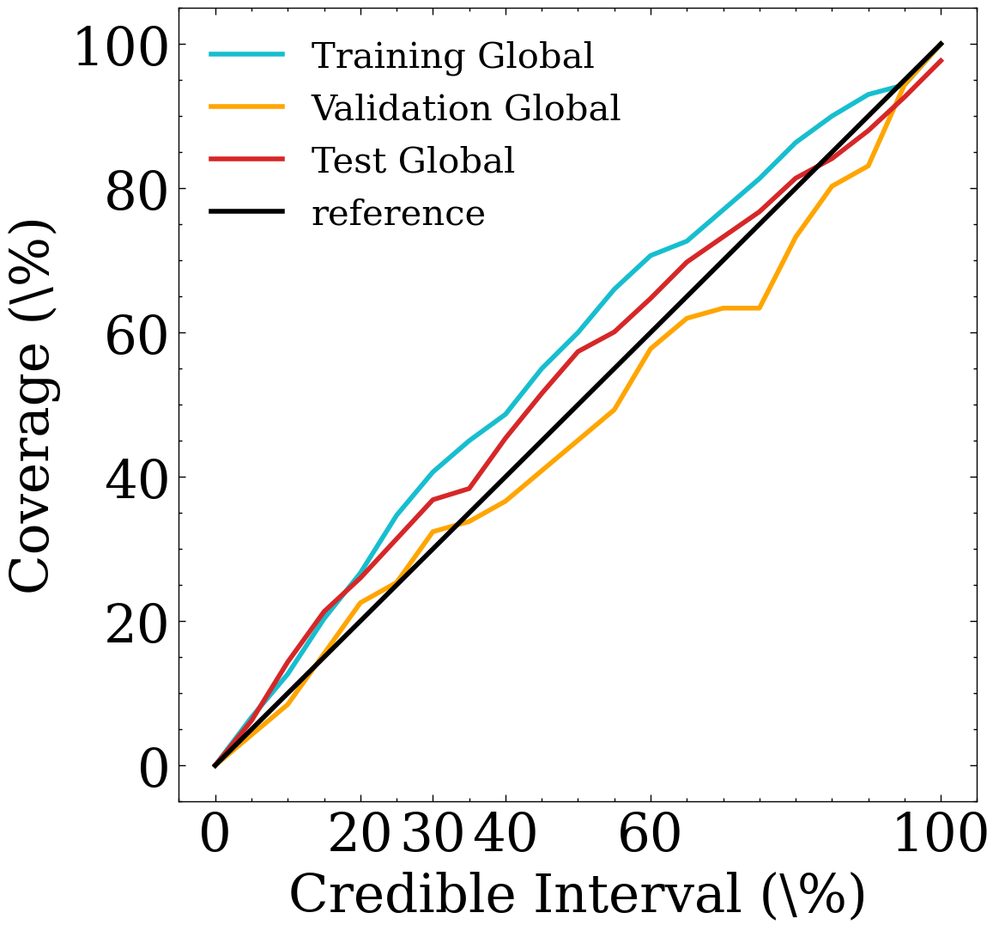

In [203]:
plt.rc("xtick", labelsize=22)
plt.rc("ytick", labelsize=22)
# Plotting the results
plt.figure(figsize=(6, 6),dpi=200)

width_line=2

plt.plot(percentiles, coverage_train_global, label='Training Global',color=color_trainig,linewidth=width_line)
plt.plot(percentiles, coverage_validation_global, label='Validation Global',color=color_validation,linewidth=width_line)
plt.plot(percentiles, coverage_test_global, label='Test Global',color=color_testing,linewidth=width_line)


# plt.plot(percentiles, coverage_train_simplex,linestyle='dashed', label='Training',color=color_trainig,linewidth=width_line)
# plt.plot(percentiles, coverage_validation_simplex, linestyle='dashed',label='Validation',color=color_validation,linewidth=width_line)
# plt.plot(percentiles, coverage_test_simplex,linestyle='dashed', label='Test',color=color_testing,linewidth=width_line)



plt.plot(percentiles, percentiles,label='reference',color='k',linewidth=width_line)
plt.xlabel('Credible Interval (\%)',fontsize=22)
plt.ylabel('Coverage (\%)',fontsize=22)

plt.xticks(ticks=[0, 20,40,60,30,100])

# plt.title('Coverage of Observed Data Points by Credible Intervals')
# plt.grid(True)
plt.legend(fontsize=15)
plt.savefig('Plots/Coverage Graph of unconstrained case.png')
plt.show()


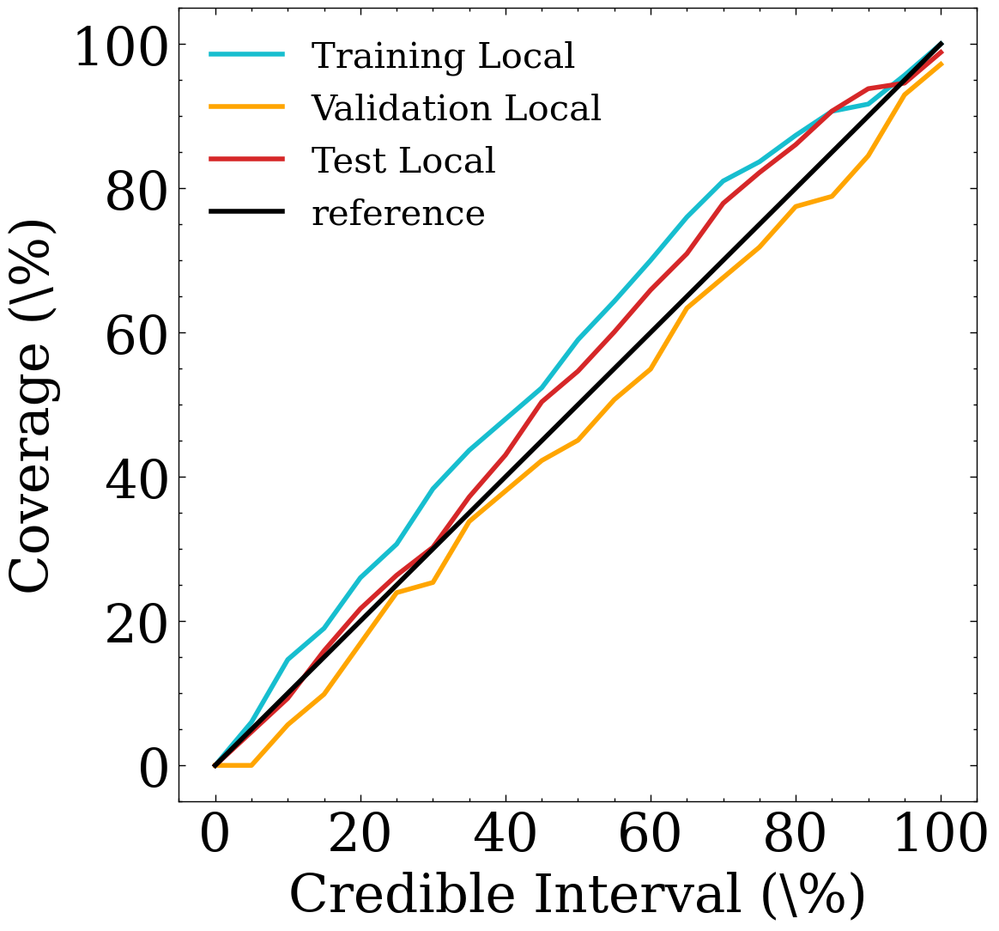

In [204]:
plt.rc("xtick", labelsize=22)
plt.rc("ytick", labelsize=22)
# Plotting the results
plt.figure(figsize=(6, 6),dpi=200)

width_line=2

plt.plot(percentiles, coverage_train_local, label='Training Local',color=color_trainig,linewidth=width_line)
plt.plot(percentiles, coverage_validation_local, label='Validation Local',color=color_validation,linewidth=width_line)
plt.plot(percentiles, coverage_test_local, label='Test Local',color=color_testing,linewidth=width_line)


# plt.plot(percentiles, coverage_train_simplex,linestyle='dashed', label='Training',color=color_trainig,linewidth=width_line)
# plt.plot(percentiles, coverage_validation_simplex, linestyle='dashed',label='Validation',color=color_validation,linewidth=width_line)
# plt.plot(percentiles, coverage_test_simplex,linestyle='dashed', label='Test',color=color_testing,linewidth=width_line)



plt.plot(percentiles, percentiles,label='reference',color='k',linewidth=width_line)
plt.xlabel('Credible Interval (\%)',fontsize=22)
plt.ylabel('Coverage (\%)',fontsize=22)

plt.xticks(ticks=[0, 20,40,60,80,100])

# plt.title('Coverage of Observed Data Points by Credible Intervals')
# plt.grid(True)
plt.legend(fontsize=15)
plt.savefig('Plots/Coverage Graph of unconstrained case.png')
plt.show()


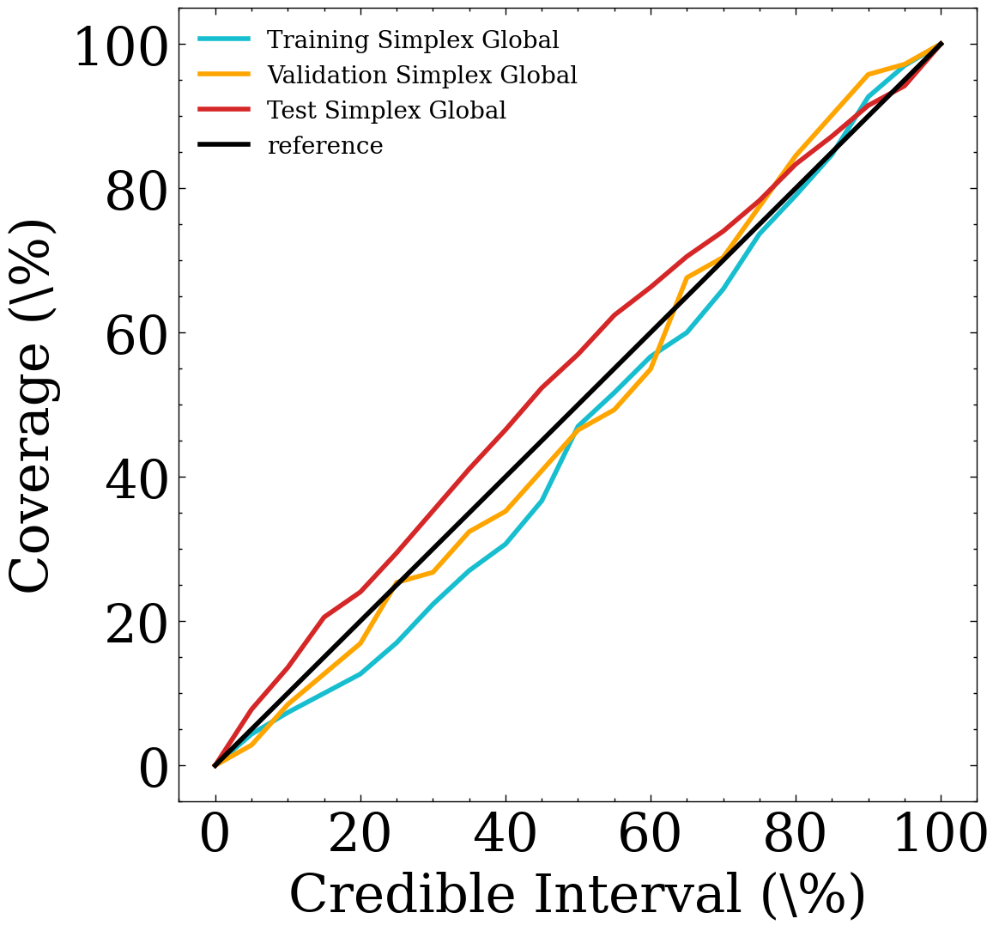

In [205]:
plt.rc("xtick", labelsize=22)
plt.rc("ytick", labelsize=22)
# Plotting the results
plt.figure(figsize=(6, 6),dpi=200)

width_line=2

plt.plot(percentiles, coverage_train_simplex_global, label='Training Simplex Global',color=color_trainig,linewidth=width_line)
plt.plot(percentiles, coverage_validation_simplex_global, label='Validation Simplex Global',color=color_validation,linewidth=width_line)
plt.plot(percentiles, coverage_test_simplex_global, label='Test Simplex Global',color=color_testing,linewidth=width_line)


# plt.plot(percentiles, coverage_train_simplex,linestyle='dashed', label='Training',color=color_trainig,linewidth=width_line)
# plt.plot(percentiles, coverage_validation_simplex, linestyle='dashed',label='Validation',color=color_validation,linewidth=width_line)
# plt.plot(percentiles, coverage_test_simplex,linestyle='dashed', label='Test',color=color_testing,linewidth=width_line)



plt.plot(percentiles, percentiles,label='reference',color='k',linewidth=width_line)
plt.xlabel('Credible Interval (\%)',fontsize=22)
plt.ylabel('Coverage (\%)',fontsize=22)

plt.xticks(ticks=[0, 20,40,60,80,100])

# plt.title('Coverage of Observed Data Points by Credible Intervals')
# plt.grid(True)
plt.legend(fontsize=10)

plt.savefig('Plots/Coverage Graph of Local Simplex case.png')
plt.show()


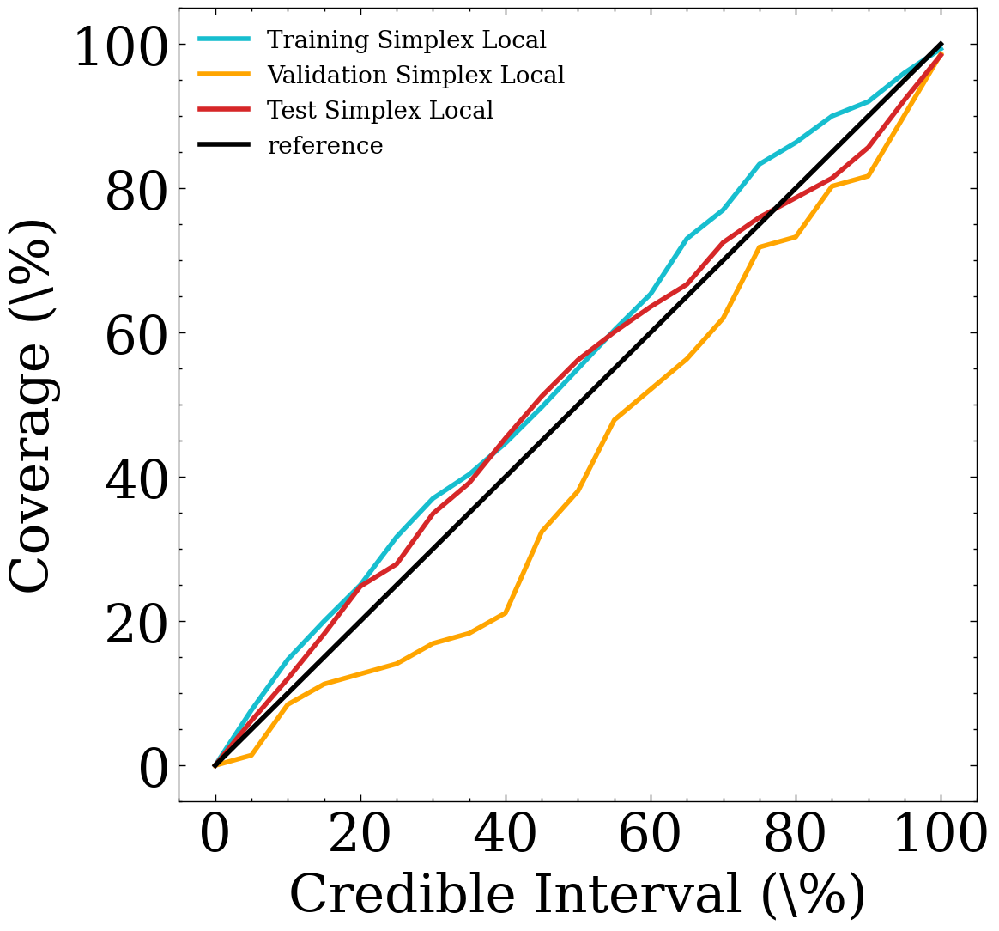

In [206]:
plt.rc("xtick", labelsize=22)
plt.rc("ytick", labelsize=22)
# Plotting the results
plt.figure(figsize=(6, 6),dpi=200)

width_line=2

plt.plot(percentiles, coverage_train_simplex_local, label='Training Simplex Local',color=color_trainig,linewidth=width_line)
plt.plot(percentiles, coverage_validation_simplex_local, label='Validation Simplex Local',color=color_validation,linewidth=width_line)
plt.plot(percentiles, coverage_test_simplex_local, label='Test Simplex Local',color=color_testing,linewidth=width_line)


# plt.plot(percentiles, coverage_train_simplex,linestyle='dashed', label='Training',color=color_trainig,linewidth=width_line)
# plt.plot(percentiles, coverage_validation_simplex, linestyle='dashed',label='Validation',color=color_validation,linewidth=width_line)
# plt.plot(percentiles, coverage_test_simplex,linestyle='dashed', label='Test',color=color_testing,linewidth=width_line)



plt.plot(percentiles, percentiles,label='reference',color='k',linewidth=width_line)
plt.xlabel('Credible Interval (\%)',fontsize=22)
plt.ylabel('Coverage (\%)',fontsize=22)

plt.xticks(ticks=[0, 20,40,60,80,100])

# plt.title('Coverage of Observed Data Points by Credible Intervals')
# plt.grid(True)
plt.legend(fontsize=10)

plt.savefig('Plots/Coverage Graph of Local Simplex case.png')
plt.show()


## The cost of local analysis is more parameters need to be analyzed. Let's compare the 2 scenerios when we use the same number of parameters.

### Global Analysis

In [207]:
# This is the function that caluclates the deviation in the global case
def PC_RMSE_calculator(components_kept):  #A function that will basically run everything above (without the plots) with varying number of kept PCs




    S_hat=np.array([S[i] for i in range(components_kept)])

    # U_hat=np.array([U.T[i]*S_hat[i] for i in range(components_kept)])
    U_hat=np.array([U.T[i] for i in range(components_kept)]) 
    # We scale U_hat because right now our SVD are used on centered data. Each principal component is a column vector of U, which is unit vector,
    # so we want to scale them up to the original magnitude.

    # Vt_hat=np.array([Vt[i] for i in range(components_kept)])
    Vt_hat=np.array([Vt[i]/S_hat[i] for i in range(components_kept)])   


    if centering_data:
        num_components=components_kept+1
    else:
        num_components=components_kept



    #########################################
    #Creating principal components that are for training. These should be equivalent to \hat U, and if they are not there is something wrong
    models_PC_train = {}
    if centering_data:
        models_PC_train[str("PC_0")] = predictions_mean_train       
    for i in range(components_kept):
        models_PC_train[str("PC_")+str(i+1)] = np.dot(Vt_hat[i],model_predictions_train.T)
    models_PC_train["N"] = models_output_train["N"]
    models_PC_train["Z"] = models_output_train["Z"]
    models_PC_train["A"] = models_PC_train["N"] + models_PC_train["Z"]
    # models_PC_training = pd.DataFrame(models_PC_train)
    models_PC_train = pd.DataFrame(models_PC_train)
    #########################################

    #########################################
    #Creating principal components that are for validation
    models_PC_validation = {}
    if centering_data:
        models_PC_validation[str("PC_0")] = predictions_mean_validation
    for i in range(components_kept):
        models_PC_validation[str("PC_")+str(i+1)] = np.dot(Vt_hat[i],model_predictions_validation.T)
    models_PC_validation["N"] = models_output_validation["N"]
    models_PC_validation["Z"] = models_output_validation["Z"]
    models_PC_validation["A"] = models_PC_validation["N"] + models_PC_validation["Z"]
    models_PC_validation = pd.DataFrame(models_PC_validation)
    #########################################

    #########################################
    #Creating principal components that are for testing
    models_PC_test = {}
    if centering_data:
        models_PC_test[str("PC_0")] = predictions_mean_test
    for i in range(components_kept):
        # models_PC_test[str("PC_")+str(i+1)] = np.dot(Vt_hat[i],model_predictions_test.T)*S_hat[i]
        models_PC_test[str("PC_")+str(i+1)] = np.dot(Vt_hat[i],model_predictions_test.T)

    models_PC_test["N"] = models_output_test["N"]
    models_PC_test["Z"] = models_output_test["Z"]
    models_PC_test["A"] = models_PC_test["N"] + models_PC_test["Z"]
    models_PC_test = pd.DataFrame(models_PC_test)
    #########################################

    #Creating principal components that are valid everywhere (testing + training + validation)
    models_PC = {}
    if centering_data:
        models_PC[str("PC_0")] = predictions_mean
    for i in range(components_kept):
        models_PC[str("PC_")+str(i+1)] = np.dot(Vt_hat[i],model_predictions.T)
    models_PC = pd.DataFrame(models_PC)
    models_PC["N"] = Full_set.T[0]
    models_PC["Z"] = Full_set.T[1]
    models_PC["A"] = models_PC["N"] + models_PC["Z"]
    #########################################

    key_list_PCs=list(models_PC_test.keys())


    X=np.copy(U_hat)
    if centering_data:
        y=np.copy(models_output_train["truth"].tolist())-predictions_mean_train
    else:
        y=np.copy(models_output_train["truth"].tolist())
    #Making the list of principal components across the train part. These should be identical to the X on top made by \hat U
    X_train=[]
    for i in range(num_components):
        X_train.append(models_PC_train[key_list_PCs[i]].tolist())
    X_train=np.array(X_train)
    #Making the list of principal components across the validation part
    X_validation=[]
    for i in range(num_components):
        X_validation.append(models_PC_validation[key_list_PCs[i]].tolist())
    X_validation=np.array(X_validation)

    #Making the list of principal components across the testing part
    X_test=[]
    for i in range(num_components):
        X_test.append(models_PC_test[key_list_PCs[i]].tolist())
    X_test=np.array(X_test)
    #Making the list of principal components across the entire chart (training+validation+testing)
    X_full=[]
    for i in range(num_components):
        X_full.append(models_PC[key_list_PCs[i]].tolist())
    X_full=np.array(X_full)

    

    # 1) Find the least square solution for the training part
    X_T_X_inv = np.linalg.inv(X.dot(X.T))
    beta = X_T_X_inv.dot(X).dot(y)
    
    #1.5) Construct the super model across the entire range and the test range
    if centering_data:
        beta_full= np.insert(beta, 0, 1)  #Augmenting the beta list to add a "1" at the begining so it can use the PC0 (the mean)
    else:
        beta_full=np.copy(beta)

    # supermodel=X.T.dot(beta_full)
    supermodel=X_train.T.dot(beta_full)
    supermodel_train=np.copy(supermodel)
    supermodel_validation=X_validation.T.dot(beta_full)
    supermodel_test=X_test.T.dot(beta_full)
    supermodel_full=X_full.T.dot(beta_full)

    
    super_model_resituals_train=supermodel_train-models_output_train['truth'].tolist()
    super_model_residuals_validation= supermodel_validation-models_output_validation['truth'].tolist()
    super_model_residuals_test = supermodel_test-models_output_test['truth'].tolist()
    super_model_residuals_full = supermodel_full-models_output['truth'].tolist()

    sigma_train=np.sqrt(np.sum(super_model_resituals_train**2) / len(super_model_resituals_train) )
    sigma_validation=np.sqrt(np.sum(super_model_residuals_validation**2) / len(super_model_residuals_validation) )
    sigma_test=np.sqrt(np.sum(super_model_residuals_test**2) / len(super_model_residuals_test) )
    sigma_full=np.sqrt(np.sum(super_model_residuals_full**2) / len(super_model_residuals_full) )


    return [sigma_train,sigma_validation,sigma_test,sigma_full]

In [208]:
if centering_data:
    s_validation=[np.linalg.norm(np.array(models_output_validation["truth"].tolist())-predictions_mean_validation)/np.sqrt(len(predictions_mean_validation))]
    s_test=[np.linalg.norm(np.array(models_output_test["truth"].tolist())-predictions_mean_test)/np.sqrt(len(predictions_mean_test))]
    s_train=[np.linalg.norm(np.array(models_output_train["truth"].tolist())-predictions_mean_train)/np.sqrt(len(predictions_mean_train))]
    s_all=[np.linalg.norm(np.array(models_output["truth"].tolist())-predictions_mean)/np.sqrt(len(predictions_mean))]
    
else:
    s_test=[]
    s_train=[]
    s_validation=[]
    s_all=[]

if centering_data:
    for i in range(1,len(S)):
        res=PC_RMSE_calculator(i)
        s_train.append(res[0])
        s_validation.append(res[1])
        s_test.append(res[2])
        
        s_all.append(res[3])
else:
    for i in range(1,len(S)+1):
        res=PC_RMSE_calculator(i)
        s_train.append(res[0])
        s_validation.append(res[1])
        s_test.append(res[2])
        
        s_all.append(res[3])

In [209]:
len(s_train)

15

In [210]:
s_test

[2.0825354899055024,
 1.3137197085472785,
 1.0592512948984552,
 1.1522326556136475,
 0.9546679098668116,
 0.6698112864467719,
 0.5185056896471044,
 0.47487055632163155,
 0.4807652276691934,
 0.5232813900026523,
 0.5759821708960836,
 0.5620830898760982,
 0.581432255072945,
 0.5517079942124455,
 0.5699277646374925]

### Local Analysis

In [211]:
# This is the function that caluclates the deviation in the global case
def PC_RMSE_calculator_local(components_kept):  #A function that will basically run everything above (without the plots) with varying number of kept PCs




    S_hat=np.array([S[i] for i in range(components_kept)])

    # U_hat=np.array([U.T[i]*S_hat[i] for i in range(components_kept)])
    U_hat=np.array([U.T[i] for i in range(components_kept)]) 
    # We scale U_hat because right now our SVD are used on centered data. Each principal component is a column vector of U, which is unit vector,
    # so we want to scale them up to the original magnitude.

    # Vt_hat=np.array([Vt[i] for i in range(components_kept)])
    Vt_hat=np.array([Vt[i]/S_hat[i] for i in range(components_kept)])   


    if centering_data:
        num_components=components_kept+1
    else:
        num_components=components_kept



    #########################################
    #Creating principal components that are for training. These should be equivalent to \hat U, and if they are not there is something wrong
    models_PC_train_local = {}
    models_PC_train_local["PC_0"] = models_PC_train["PC_0"]
    for i in range(components_kept):
        models_PC_train_local["PC_" + str(i+1)] = models_PC_train["PC_" + str(i+1)]
    for i in range(components_kept):
        models_PC_train_local["PC_" + str(i+1) + "_Z"] = models_PC_train["PC_" + str(i+1)] * models_PC_train["Z"]
    for i in range(components_kept):
        models_PC_train_local["PC_" + str(i+1) + "_N"] = models_PC_train["PC_" + str(i+1)] * models_PC_train["N"]
    models_PC_train_local["Z"] = models_PC_train["Z"]
    models_PC_train_local["N"] = models_PC_train["N"]
    models_PC_train_local['A'] = models_PC_train_local["Z"] + models_PC_train_local["N"]
    models_PC_train_local = pd.DataFrame(models_PC_train_local)
    #########################################

    #########################################
    #Creating principal components that are for validation
    models_PC_validation_local = {}
    models_PC_validation_local["PC_0"] = models_PC_validation["PC_0"]
    for i in range(components_kept):
        models_PC_validation_local["PC_" + str(i+1)] = models_PC_validation["PC_" + str(i+1)]
    for i in range(components_kept):
        models_PC_validation_local["PC_" + str(i+1) + "_Z"] = models_PC_validation["PC_" + str(i+1)] * models_PC_validation["Z"]
    for i in range(components_kept):
        models_PC_validation_local["PC_" + str(i+1) + "_N"] = models_PC_validation["PC_" + str(i+1)] * models_PC_validation["N"]
    models_PC_validation_local["Z"] = models_PC_validation["Z"]
    models_PC_validation_local["N"] = models_PC_validation["N"]
    models_PC_validation_local['A'] = models_PC_validation_local["Z"] + models_PC_validation_local["N"]
    models_PC_validation_local = pd.DataFrame(models_PC_validation_local)
    #########################################

    #########################################
    #Creating principal components that are for testing
    models_PC_test_local = {}
    models_PC_test_local["PC_0"] = models_PC_test["PC_0"]
    for i in range(components_kept):
        models_PC_test_local["PC_" + str(i+1)] = models_PC_test["PC_" + str(i+1)]
    for i in range(components_kept):
        models_PC_test_local["PC_" + str(i+1) + "_Z"] = models_PC_test["PC_" + str(i+1)] * models_PC_test["Z"]
    for i in range(components_kept):
        models_PC_test_local["PC_" + str(i+1) + "_N"] = models_PC_test["PC_" + str(i+1)] * models_PC_test["N"]
    models_PC_test_local["Z"] = models_PC_test["Z"]
    models_PC_test_local["N"] = models_PC_test["N"]
    models_PC_test_local['A'] = models_PC_test_local["Z"] + models_PC_test_local["N"]
    models_PC_test_local = pd.DataFrame(models_PC_test_local)
    #########################################

    #Creating principal components that are valid everywhere (testing + training + validation)
    models_PC_local = {}
    models_PC_local["PC_0"] = models_PC["PC_0"]
    for i in range(components_kept):
        models_PC_local["PC_" + str(i+1)] = models_PC["PC_" + str(i+1)]
    for i in range(components_kept):
        models_PC_local["PC_" + str(i+1) + "_Z"] = models_PC["PC_" + str(i+1)] * models_PC["Z"]
    for i in range(components_kept):
        models_PC_local["PC_" + str(i+1) + "_N"] = models_PC["PC_" + str(i+1)] * models_PC["N"]
    models_PC_local["Z"] = models_PC["Z"]
    models_PC_local["N"] = models_PC["N"]
    models_PC_local['A'] = models_PC_local["Z"] + models_PC_local["N"]
    models_PC_local = pd.DataFrame(models_PC_local)
    #########################################

    key_list_PCs=list(models_PC_test_local.keys())


    X=np.copy(U_hat)
    if centering_data:
        y=np.copy(models_output_train["truth"].tolist())-predictions_mean_train
    else:
        y=np.copy(models_output_train["truth"].tolist())
    #Making the list of principal components across the train part. These should be identical to the X on top made by \hat U
    X_train_local=[]
    for i in range(3*components_kept + 1):
        X_train_local.append(models_PC_train_local[key_list_PCs[i]].tolist())
    X_train_local=np.array(X_train_local)
    #Making the list of principal components across the validation part
    X_validation_local=[]
    for i in range(3*components_kept + 1):
        X_validation_local.append(models_PC_validation_local[key_list_PCs[i]].tolist())
    X_validation_local=np.array(X_validation_local)

    #Making the list of principal components across the testing part
    X_test_local=[]
    for i in range(3*components_kept + 1):
        X_test_local.append(models_PC_test_local[key_list_PCs[i]].tolist())
    X_test_local=np.array(X_test_local)
    #Making the list of principal components across the entire chart (training+validation+testing)
    X_full_local_centered=[]
    for i in range(3*components_kept):
        X_full_local_centered.append(models_PC_local[key_list_PCs[i+1]].tolist())
    X_full_local_centered=np.array(X_full_local_centered)

    X_full_local=[]
    for i in range(3*components_kept+1):
        X_full_local.append(models_PC_local[key_list_PCs[i]].tolist())
    X_full_local=np.array(X_full_local)

    # 1) Find the least square solution for the training part
    X_T_X_inv = np.linalg.inv(X_full_local_centered.dot(X_full_local_centered.T))
    beta = X_T_X_inv.dot(X_full_local_centered).dot(y)
    
    #1.5) Construct the super model across the entire range and the test range
    if centering_data:
        beta_full= np.insert(beta, 0, 1)  #Augmenting the beta list to add a "1" at the begining so it can use the PC0 (the mean)
    else:
        beta_full=np.copy(beta)

    # supermodel=X.T.dot(beta_full)
    supermodel_local=X_train_local.T.dot(beta_full)
    supermodel_train_local=np.copy(supermodel)
    supermodel_validation_local=X_validation_local.T.dot(beta_full)
    supermodel_test_local=X_test_local.T.dot(beta_full)
    supermodel_full_local=X_full_local.T.dot(beta_full)

    
    super_model_resituals_train_local = supermodel_train_local - models_output_train['truth'].tolist()
    super_model_residuals_validation_local = supermodel_validation_local - models_output_validation['truth'].tolist()
    super_model_residuals_test_local = supermodel_test_local - models_output_test['truth'].tolist()
    super_model_residuals_full_local = supermodel_full_local - models_output['truth'].tolist()

    sigma_train_local = np.sqrt(np.sum(super_model_resituals_train_local**2) / len(super_model_resituals_train_local) )
    sigma_validation_local = np.sqrt(np.sum(super_model_residuals_validation_local**2) / len(super_model_residuals_validation_local) )
    sigma_test_local = np.sqrt(np.sum(super_model_residuals_test_local**2) / len(super_model_residuals_test_local) )
    sigma_full_local = np.sqrt(np.sum(super_model_residuals_full_local**2) / len(super_model_residuals_full_local) )


    return [sigma_train_local,sigma_validation_local,sigma_test_local,sigma_full_local]

In [212]:
if centering_data:
    s_validation_local=[np.linalg.norm(np.array(models_output_validation["truth"].tolist())-predictions_mean_validation)/np.sqrt(len(predictions_mean_validation))]
    s_test_local=[np.linalg.norm(np.array(models_output_test["truth"].tolist())-predictions_mean_test)/np.sqrt(len(predictions_mean_test))]
    s_train_local=[np.linalg.norm(np.array(models_output_train["truth"].tolist())-predictions_mean_train)/np.sqrt(len(predictions_mean_train))]
    s_all_local=[np.linalg.norm(np.array(models_output["truth"].tolist())-predictions_mean)/np.sqrt(len(predictions_mean))]
    
else:
    s_test_local=[]
    s_train_local=[]
    s_validation_local=[]
    s_all_local=[]

if centering_data:
    for i in range(1,15):
        res=PC_RMSE_calculator(i)
        s_train_local.append(res[0])
        s_validation_local.append(res[1])
        s_test_local.append(res[2])
        
        s_all_local.append(res[3])
else:
    for i in range(1,16):
        res=PC_RMSE_calculator(i)
        s_train.append(res[0])
        s_validation.append(res[1])
        s_test.append(res[2])
        
        s_all.append(res[3])

In [213]:
s_test_local

[2.0825354899055024,
 1.3137197085472785,
 1.0592512948984552,
 1.1522326556136475,
 0.9546679098668116,
 0.6698112864467719,
 0.5185056896471044,
 0.47487055632163155,
 0.4807652276691934,
 0.5232813900026523,
 0.5759821708960836,
 0.5620830898760982,
 0.581432255072945,
 0.5517079942124455,
 0.5699277646374925]

In [214]:
s_train

[1.8487718698537479,
 1.2175912385355934,
 0.8788781961210768,
 0.7489781338185377,
 0.6645108607768495,
 0.4605936993485935,
 0.3958854419160348,
 0.37781047786689786,
 0.37598395618751507,
 0.3563556799481202,
 0.3468737715110902,
 0.33496173327548645,
 0.3267992353455127,
 0.3230618509878574,
 0.32238042514620513]

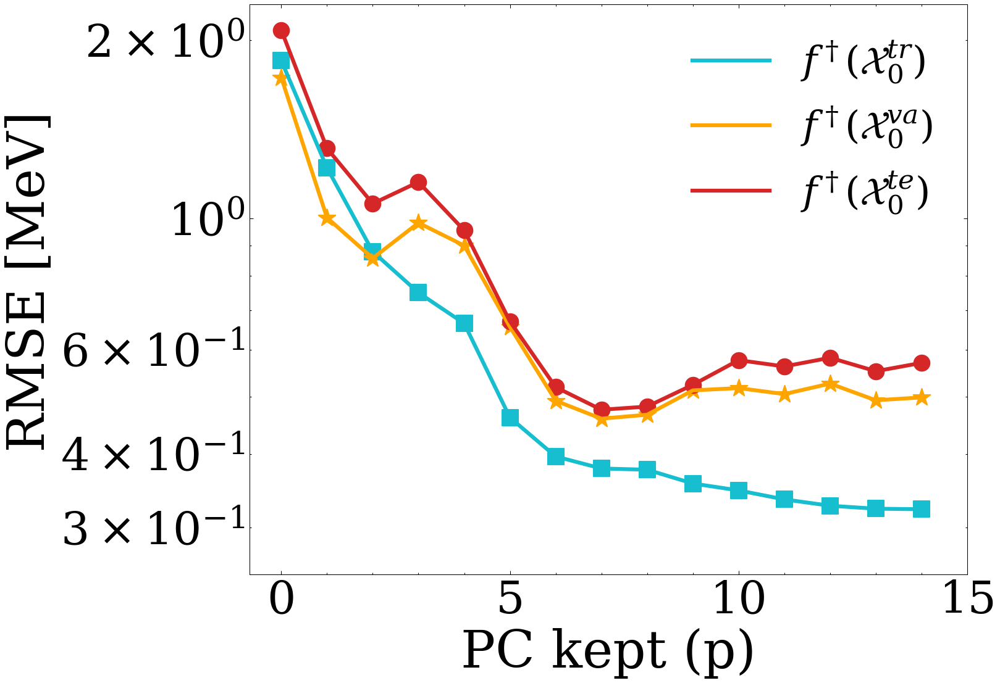

In [217]:
plt.rc("xtick", labelsize=35)
plt.rc("ytick", labelsize=35)

fig, ax = plt.subplots(figsize=(10,8),dpi=150)
fig.patch.set_facecolor('white')




size_points=150


ax.scatter(np.arange(0,len(s_train_local)), s_train_local,color=color_trainig,s=size_points,marker=marker_trainig)
ax.plot(np.arange(0,len(s_train_local)), s_train_local,color=color_trainig,linewidth=3,label='$f^\dagger(\mathcal{X}_0^{tr})$')

ax.scatter(np.arange(0,len(s_validation_local)), s_validation_local,color=color_validation,s=size_points*1.3,marker=marker_validation)
ax.plot(np.arange(0,len(s_validation_local)), s_validation_local,color=color_validation,linewidth=3,label="$f^\dagger(\mathcal{X}_0^{va})$")


ax.scatter(np.arange(0,len(s_test_local)), s_test_local,color=color_testing,s=size_points,marker=marker_testing)
ax.plot(np.arange(0,len(s_test_local)), s_test_local,color=color_testing,linewidth=3,label="$f^\dagger(\mathcal{X}_0^{te})$")

# ax.axhline(y=sigma_naive_train,color=color_trainig,label="BMC$(\mathcal{X}_0^{tr})$",linestyle='dashed',linewidth=3)

# ax.axhline(y=sigma_naive_test,color=color_testing,label="BMC$(\mathcal{X}_0^{te})$",linestyle='dashed',linewidth=3)








ax.set_yticks([0.2,0.5,1,2])


ax.set_yscale('log')
ax.set_xlabel(r'PC kept (p)',fontsize=40)
ax.set_ylabel(r' RMSE [MeV]',fontsize=40);
ax.set_xticks([0,5,10,15])

plt.ylim(2.5*10**(-1),2.3)

# plt.legend(fontsize=20,loc=(0.1,0.6))
plt.savefig('Plots/RMSE decays as the number of PCs.png')
plt.legend(fontsize=30)
plt.show()